## Physical Interpretations

In [1]:
import numpy as np
import numba as nb
import time
import matplotlib.pyplot as plt
from numpy import insert
import time
import pandas as pd
import os

In [2]:
# # # datafile_list = ['20200206_1455,20_ME16_3+_NCE15_AGC100_cvScan2000_turbo_1,7V_2uL',
# # #                  '20160503_1127_PH4_3+_CVscan_NCE35_Turbo',
# # #                  '20160603_1040_ME9_3+_CVscan_NCE35_Turbo',
# # #                  '20160622_1514_ME14_3+_1to2500_CVscan_NCE35'
####                    '7255_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso',
# # #                 ]

# datafile_list = ['7302_2D-PC-MS_2pmol-ul_1AGC_0-7quadiso',
#                  '7302_2D-PC-MS_1pmol-ul_1AGC_0-7quadiso',
#                  '7302_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso',
#                  '7302_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso',
#                  '7255_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso',
#                  '7255_2D-PC-MS_1pmol-ul_0-1AGC_0-7quadiso']

datafile_dict = {}

for dirname in os.listdir('../IC/IC/raw data/'):
    datafile_dict[dirname] = []
    for filename in os.listdir('../IC/IC/raw data/' + str(dirname)):
        datafile_dict[dirname].append(os.path.splitext(filename)[0])
        # 6727_2d-PC-MS_1pmol-ul_1AGC_0-7quadiso_HCD']

FileNotFoundError: [Errno 2] No such file or directory: '../IC/IC/raw data/'

In [3]:
print(datafile_dict.keys())

dict_keys([])


In [4]:
name = '7255_2d-PC-MS_10pmol-ul_1AGC_0-7quadiso_CID' # list(datafile_dict.values())[2][1]

In [5]:
import argparse
import sys
import os
import re

parser = argparse.ArgumentParser()
parser.add_argument('--parpath', nargs='?', type=str, default='./peptide output/Test/' + str(name) + '/', help='parent path of folders for different scan numbers')
parser.add_argument('--name', nargs='?', type=str, default=str(name), help='file name')
parser.add_argument('--numscan_list', nargs='?', type=list, default=[], help='file name')
parser.add_argument('--m', nargs='?', type=str, default='tic', help='tic or w or cov')
parser.add_argument('--epoch', nargs='?', type=int, default=None, help='epoch number')

# Check if the script is run in IPython/Jupyter Notebook
if 'ipykernel' in sys.argv[0]:
    # Remove the last two elements (they are specific to IPython/Jupyter)
    sys.argv = sys.argv[:-2]

args = parser.parse_args()
print(args.name)
numscan_list = args.numscan_list

if numscan_list == []:
    for dir_name in os.listdir(args.parpath):
        if len(dir_name.split(' ')) == 2:
            numscan_list.append(int(dir_name.split(' ')[0]))
    numscan_list.sort()

7255_2d-PC-MS_10pmol-ul_1AGC_0-7quadiso_CID


In [6]:
method = '_cma(loss_func4,bins:100)'

In [7]:
## firstly input peptide sequence and its charge state

# file_name  peptide_sequence
# ME14_3+:   VTIMPK(Ac)DIQLAR
# PH4_3+     EQFDDY(p)GHMRF(NH2) 
# ME9_3+:    GWGR(Me2)EENLFSWK
# ME16_3+:   VTIMPKDIQLAR
# 7255:      ALDLLDRNYLQSLPSK
# 7732:      KFIFRTAGTAGR
# 6727:      DQARVAPSSSDPKSKFF
# 7302:      HGMTVVIRKKF
# 3510:      GSHQISLDNPDYQQDFFPK
peptide_input = input("Enter the theoretical sequence of peptide:\n ")
charge_input = input("Enter the charge of peptide:\n") # input '3'

# secondly load tic_top feat data from corresponding files
## need to change according to different file locations

## For convergence plots, I created different files for different scan numbers, so need to specify here
numscan= numscan_list[-1]
path = args.parpath + str(numscan) +' scans/'
name = args.name
# 20160622_1514_ME14_3+_1to2500_CVscan_NCE35
# 20200206_1455,20_ME16_3+_NCE15_AGC100_cvScan2000_turbo_1,7V_2uL
# 20161208_1724_ME16_3+_CVscan_Normal_isoWidth1
# 20161121_1714_ME14_3+_CVscan_AGCMSn100_Normal
# 20160603_1040_ME9_3+_CVscan_NCE35_Turbo
# 20160503_1127_PH4_3+_CVscan_NCE35_Turbo
# 3510_2D-MS-PC_turbo
# 7302_2D-MS-PC_turbo
# 6727_2D-MS-PC_turbo
# 7255_2D-MS-PC_turbo
# 7732_2D-MS-PC_turbo
# 3510_2D-MS-PC_0-001pmol-ul_2mz-quadiso_0-01AGC
# 3510_2D-MS-PC_0-01pmol-ul_2mz-quadiso_0-1AGC
# 3510_2D-MS-PC_0-05fmol-ul_2mz-quadiso_0-005AGC
# 6727_2D-MS-PC_0-001pmol-ul_2mz-quadiso_0-005AGC
# 6727_2D-MS-PC_0-01pmol-ul_2mz-quadiso_0-01AGC
# 6727_2D-MS-PC_0-01pmol-ul_2mz-quadiso_0-1AGC
# 14/07/2022 HCD data listing below
# 3510_2D-PC-MS_1pmol-ul_1AGC_0-7quadiso
# 3510_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso
# 7302_2D-PC-MS_2pmol-ul_1AGC_0-7quadiso
# 7302_2D-PC-MS_1pmol-ul_1AGC_0-7quadiso
# 7302_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso
# 7302_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso
# 7255_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso
# 7255_2D-PC-MS_1pmol-ul_0-1AGC_0-7quadiso
# 7255_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso
# 7255_2D-PC-MS_10pmol-ul_1AGC_0-7quadiso
# 7732_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso
# 7732_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso

featfile = path+'/'+args.m+'_topfeat.npy'
if args.epoch is not None:
    featfile = path+'/'+args.m+'_'+args.epoch+'_topfeat.npy'

tolerance = 0.8  # for linear ion trap


KeyboardInterrupt



In [8]:
top_feat = np.load(featfile)

1.c-ion: mass = mass of b-ion + 17.0265

2.z-ion: mass = y-ion - 17.0265

3.NH3-loss product: any of the a,b,y-ions - 17.0265

4.H2O-loss product: any of the a,b,y-ions - 18.0106

5.Neutral loss of HN=C=NH molecule specific to Arg (R) residue: any ion that contains R- residue - 42.0218

6.Internal b-ions: sum of the residue masses + 1.0078, as in the formula for the regular b-ions

7.Internal a-ions: same reduction by the CO mass from the corresponding b-ion as for the terminal a-ions

8.Internal a,b-ions can also lose NH3 or H2O as the terminal a,b ions do.

9.C-ion cannot be produced if the next residue after the last residue of c-ion is Pro (P), because the nitrogen is part of a ring structure in this amino acid - please look at its chemical structure and you'll see why. So, we need to code this new rule into your software.

In [177]:
peptide_input = peptide_input.replace('K(Ac)', '1')
peptide_input = peptide_input.replace('R(Me2)', '2')
peptide_input = peptide_input.replace('Y(p)', '3')
peptide_input = peptide_input.replace('F(NH2)', '4')

# 21/12/2022
peptide_input = peptide_input.replace('R(Me)', '5')

# For the term "R(sMe2)," it signifies "symmetric dimethylation," where the two methyl groups are attached to the same nitrogen atom in the guanidine group. 
peptide_input = peptide_input.replace('R(sMe2)', '2')

# For the term "R(aMe2)," it signifies "asymmetric dimethylation," where the two methyl groups are attached to different nitrogen atoms in the guanidine group. 
peptide_input = peptide_input.replace('R(aMe2)', '2') 

peptide_input = peptide_input.replace('pY', '3')
peptide_input = peptide_input.replace('(nitro)Y', '6')
peptide_input = peptide_input.replace('K(Me)3', '7')
peptide_input = peptide_input.replace('C(SO3H)', '8')
peptide_input = peptide_input.replace('Y(SO3H)', '9')

# The lowercase letter to represent "Myr" is usually "m" in the context of representing the myristoyl group in peptide sequences.
peptide_input = peptide_input.replace('Myr', 'm')

# For the lowercase letter that can represent norleucine (Nle) in a peptide sequence, it is common to use "n" or "l" to represent norleucine. 
peptide_input = peptide_input.replace('Nle', 'n')

define = {'A' : 71.03711, 'R' : 156.10111, 'N' : 114.04293, 'D' : 115.02694,
         'C' : 103.00919, 'E' : 129.04259, 'Q' : 128.05858, 'G' : 57.02146,
         'H' : 137.05891, 'I' : 113.08406, 'L' : 113.08406, 'K' : 128.09496, 
         'M' : 131.04049, 'F' : 147.06841, 'P' : 97.05276, 'S' : 87.03203,
         'T' : 101.04768, 'W' : 186.07931, 'Y' : 163.06333, 'V' : 99.06841,
         '1': 128.09496+42.0106,   '2': 156.10111+28.0314,  '3': 163.06333+79.9663,   
          '4': 147.06841-0.98402, '5': 156.10111+28.0314/2, '6': 163.06333+44.9851,
         '7': 128.09496 + 3 * 28.0314/2, '8': 103.00919 + 80.062, '9': 163.06333 + 80.062,
         'm': 210.1984, 'n': 113.1151}

peptide_list =list(peptide_input)
peptide = []
for item in peptide_list:
    peptide.append(define[item])
    

# HN=C=NH loss specific to R residue 
# any ion - 42.0218
R_residue = []
for i in nb.prange(len(peptide_input)):
    if peptide_input[i] == 'R':
        R_residue.append(-42.0218)
    else:
        R_residue.append(0)    
        
        
# CH3CH2SCH3 loss specific to M residue
# any ion -76.0346 
M_residue = []
for i in nb.prange(len(peptide_input)):
    if peptide_input[i] == 'M':
        M_residue.append(-76.0346)
    else:
        M_residue.append(0)


In [178]:
# create arrays for y and b ions with charge 1+
# e.g. for peptide sequence VTIMPK(Ac)DIQLAR
#      y_charge1 array has numbers in the form of ['R+19.01838', 'R+A+19.01838','R+A+L+19.01838',
#                                                   ...,'R+A+L+Q+I+D+K(Ac)+P+M+I+T+19.01838']
#      b_charge1 array has numbers in the form of ['V+1.00782', 'V+T+1.00782','V+T+I+1.00782',
#                                                   ...,'V+T+I+M+P+K(Ac)+D+I+Q+L+A+1.00782']
# therefore, when calculate the theoretical values, b_charge1[0] will form a complementary pair with y_charge1[-1]
y_charge1 = []
b_charge1 = []
arr_y = 19.01838
arr_b = 1.00782

for i in nb.prange(1,len(peptide)):
    arr_y = peptide[-i] + arr_y
    arr_b = peptide[i-1] + arr_b
    y_charge1.append(arr_y)
    b_charge1.append(arr_b)
a_charge1 = [x - 28 for x in b_charge1]    
c_charge1 = [x + 17.0265 for x in b_charge1]    
x_charge1 = [x + 28 for x in y_charge1]       
z_charge1 = [x - 17.0265 for x in y_charge1]

In [179]:
# count all possible theoretical complementary pairs
complem =[]

# i loops over the peptide length, 
# starts from 0 and ends with len(peptide)-2
for i in nb.prange(len(peptide)-1):
    # c1 loops for charge state of the 1st fragment in the pair
    # c2 loops for charge state of the 2nd fragment in the pair
    for c1 in nb.prange(1,int(charge_input)):
        for c2 in nb.prange(1,int(charge_input)):
            # for complementary pairs, combined charge states should match with the total charge of peptide
            if c1+c2 == int(charge_input):

                ax = ['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2.5]
                bx = ['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2]
                cx = ['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',4]
                ay = ['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',0.5]
                by = ['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',0]
                cy = ['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2]
#                 az = ['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2.5]
#                 bz = ['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2]
#                 cz = ['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',4]
                
                complem.append(by)
                complem.append(ay)
                
                # C-ion cannot be produced if the next residue after the last residue of c-ion is Pro (P),
                if peptide[i+1] != 97.05276:
                    complem.append(cy)
                    complem.append(cx)  
#                     complem.append(cz)
    
                complem.append(bx)
#                 complem.append(bz)
                
                complem.append(ax)
#                 complem.append(az)
                 
            # NH3 loss or H2O loss  
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 +(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 0.5])
                complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 0.5])
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 0.5])
                complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 0.5])
                
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',1])
                complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)',1])
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])
                complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                
                if peptide[i+1] != 97.05276:
                    complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2.5])              
                    complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2.5])
                      
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
#                 complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])                            
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
#                 complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                                            
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                 complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                 complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                
            # 1 neutral loss on both sides
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1])
                
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1])

            # NH3 and H2O loss
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])  
                complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 1])     
                                            
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])   
                complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 1.5]) 
                                            
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                 complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                                                
                if peptide[i+1] != 97.05276:                                
                    complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])   
                         
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                 complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
             
                # 2 neutral loss on one side and 1 neutral loss on the other
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 1.5])   
                                            
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])   
                                            
                # 2 neutral loss on one side and 2 neutral loss on the other              
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])                            
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])

In [180]:
## one terminal and one internal

term_and_inter =[]
# i loops over from 0 to len(peptide)-4 for the terminal ion
# it stands for the position of terminal ions
# because for example the peptide VTIMPK(Ac)DIQLAR
# the terminal y-ions can at most count from R to M to ensure an internal b-ion (the shortest is b(2-3):T+I)
for i in nb.prange(len(peptide_input)-3):
    # b-ion counts from rhs and lhs are counted separately
    # for pairing terminal y-ions and terminal b-ions respectively
    b_new_arr = peptide[-i-2] + 1.00782
    bb_new_arr = peptide[i+1] + 1.00782
    
    # k loops over from 2 to len(peptide)-2, for the internal ion
    # it stands for the positions where the internal b-ions stop counting
    for k in nb.prange(2, len(peptide_input)-1):
        # k needs to be larger than i+1
        if k > (i+1):
            # the logic is a bit complicated here
            # e.g. for peptide VTIMPK(Ac)DIQLAR, i loops from 0 to 8, 
            # when i=0, b_new_arr has peptide[-2]+1.00782=A+1.00782 and bb_new_arr has T+1.00782 at start
            # and k loops from 2 to 10, all of them are larger than i+1=1,
            # take k=2 as example, 
            # the internal b_new_arr will add the letter at peptide[-3], which is L
            # and therefore b_new_arr = A+L+1.00782 = b(10-11)
            # bb_new_arr will add peptide[2], which is I
            # and therefore bb_new_arr = T+I+1.00782 = b(2-3)
            # as k loops to higher number, b_new_arr can at most add up to b(2-11) and bb_new_arr to b(2-11) as well
            b_new_arr = b_new_arr + peptide[-k-1]
            bb_new_arr =  bb_new_arr + peptide[k]
            for c1 in nb.prange(1,int(charge_input)):
                for c2 in nb.prange(1,int(charge_input)):
                    if c1+c2 <= int(charge_input):
                      
                      # without neutral loss
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1])
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5])

                      # H2O/NH3 loss(1 neutral loss) of internal/terminal a/b ions
                      # no loss on the other 
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5])  
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+(c2-1)*1.00784 )/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5]) 
                        
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+(c2-1)*1.00784) /c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                        
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr-28+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr-28+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                              
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                       
                      # H2O/NH3 loss(1 neutral loss) on both internal and terminal ions                  
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])                      
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])      
                                              
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5]) 
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                             
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])                      
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])      
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5]) 
                                              
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                         
                      # H2O and NH3 loss(2 neutral loss) of internal/terminal a/b ions 
                      # no loss on the other
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2])                      
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+(c2-1)*1.00784) /c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2])     
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])            
                                              
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                     
                      # H2O and NH3 loss(2 neutral loss) of internal/terminal a/b ions 
                      # H2O/NH3 1 neutral loss on the other  
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])               
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5]) 
                                              
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])       
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                              
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3])
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3])                          
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                        
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3]) 
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3])                                                        
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])  
                                              
                      # H2O and NH3 loss(2 neutral loss) of internal/terminal a/b ions 
                      # H2O and NH3 loss(2 neutral loss) on the other                      
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])    
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3])                      
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])                      
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])                                     

In [181]:
# two terminals ions
# non-complementary
term_and_term = []
# i and j both loops from 0 to 10 in case of peptide VTIMPK(Ac)DIQLAR
# when i = 3, b-ion equals to V+T+I+M+1.00782 = b4 
# j has to be smaller than 12-3-2 = 7, otherwise if j=7
# y-ion will be R+A+L+Q+I+D+K(Ac)+P+19.01838 = y8 and that will form a complementary pair
for i in nb.prange(len(peptide_input)-2):
    for j in nb.prange(len(peptide_input)-2):
        if j < len(peptide_input)-i-2:
            for c1 in nb.prange(1,int(charge_input)):
                for c2 in nb.prange(1,int(charge_input)):
                    if c1+c2 <= int(charge_input):
                      # no neutral loss
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 
                                              'y'+str(j+1)+'('+str(c2)+'+)', 1.5])                        
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 
                                              'y'+str(j+1)+'('+str(c2)+'+)', 2])
                        
                        if peptide[i+1] != 97.05276:
                            term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 
                                                  'y'+str(j+1)+'('+str(c2)+'+)', 3.5])
                            term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 
                                                  'x'+str(j+1)+'('+str(c2)+'+)', 5.5])
#                             term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 
#                                                   'z'+str(j+1)+'('+str(c2)+'+)', 5.5])
                    
                            
#                         term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 
#                                               'z'+str(j+1)+'('+str(c2)+'+)', 3.5])
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 
                                              'x'+str(j+1)+'('+str(c2)+'+)', 3.5])
                        
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 
                                              'x'+str(j+1)+'('+str(c2)+'+)', 4])
#                         term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 
#                                               'z'+str(j+1)+'('+str(c2)+'+)', 4])
 
                        
                      # NH3/H2O (1 neutral loss) loss on one side
                        # 3 bond cleavages
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2])
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', 
                                              (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2])
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', 
                                              (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2])
                        
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', 
                                              (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', 
                                              (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                        
                        term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)',
                                              (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 4])
                        term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', 
                                              (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 4])
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4])
#                         term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
#                                               (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4])
#                         term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
#                                               (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4])
                        
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        
#                         term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
#                                               (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                         term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)',
#                                               (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        
                        
                      # NH3/H2O (1 neutral loss) loss on both sides
                        # 4 bond cleavages
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                        
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3]) 
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                        
                      # NH3 and H2O (2 neutral loss) loss on one side
                        # 4 bond cleavages
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', 
                                              (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', 
                                              (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        
                        term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', 
                                              (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4.5])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)',
                                              (a_charge1[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                        
                      # NH3 and H2O (2 neutral loss) loss on one side
                      # and NH3/H2O (1 neutral loss) loss on the other
                        # 5 bond cleavages
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                    
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])  
                        
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])
                        
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                        
                      # NH3 and H2O (2 neutral loss) loss on both sides
                        # 6 bond cleavages  
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])  
 

In [182]:
# R_residue loss
# only apply when R_residue array has values
if sum(R_residue) != 0:
    y_R = []
    b_R = []
    arrR_y = 0
    arrR_b = 0
    # to make y_R and b_R arrays which have length of len(peptide)-1,
    # the elements in the array corresponding to their cumulative sum
    # e.g. R_residue = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -42.0218] for peptide VTIMPK(Ac)DIQLAR
    # its b_R will be [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] and 
    # y_R will be [-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218]
    # they will be added with peptide according to their matched sequence
    for i in nb.prange(1,len(R_residue)):
        arrR_y = R_residue[-i] + arrR_y
        arrR_b = R_residue[i-1] + arrR_b
        y_R.append(arrR_y)
        b_R.append(arrR_b)
  
    # complementary 
    for i in nb.prange(len(peptide)-1):
        for c1 in nb.prange(1,int(charge_input)):
            for c2 in nb.prange(1,int(charge_input)):
                if c1+c2 == int(charge_input): 
                    if b_R[i] != 0:
                        if peptide[i+1] != 97.05276:
                            complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
#                             complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                                'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                               'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 4.5])
                            
                            
                        complem.append(['a'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                        
                        complem.append(['a'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 0.5])
                        
                        complem.append(['a'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                         complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                        
                        
                        complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1])
                        
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])        
#                         complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                         complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])     
                        
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])        
#                         complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                         complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])     

                    elif y_R[-i-1] != 0:
                        if peptide[i+1] != 97.05276:
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                               'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
#                             complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                                'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3])
                            
                            
                            
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                        
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 0.5])
                        
#                         complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
#                         complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                        
                        
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1.5])
#                         complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1])
#                         complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1.5])
#                         complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1])
#                         complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 2])
#                         complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1.5])
#                         complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])

                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 1])
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2])
                        
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 1])
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2])
                        
    # uncomplementary
    # terminal and internal
    for i in nb.prange(len(peptide_input)-3):
        bR_new_arr = R_residue[-i-2]
        bbR_new_arr = R_residue[i+1]
        
        b_new_arr = peptide[-i-2]+1.00782
        bb_new_arr = peptide[i+1]+1.00782
        for k in nb.prange(2, len(peptide_input)-1):
            if k > (i+1):
                bR_new_arr = bR_new_arr + R_residue[-k-1]
                bbR_new_arr =  bbR_new_arr + R_residue[k]
                b_new_arr = b_new_arr + peptide[-k-1]
                bb_new_arr =  bb_new_arr + peptide[k]
                for c1 in nb.prange(1,int(charge_input)):
                    for c2 in nb.prange(1,int(charge_input)):
                        if c1+c2 <= int(charge_input):
                            if y_R[i] != 0:
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                            
                            elif b_R[i] != 0:   
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'-(NH3)('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'-(NH3)('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                            elif bR_new_arr != 0:
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3.5])
                                               
                                
                            elif bbR_new_arr != 0:
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                
                                
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])    
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])    
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])    
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3.5])    
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3.5])
                            else:
                                pass
                            
    # uncomplementary
    # two terminals
    for i in nb.prange(len(peptide_input)-2):
        for j in nb.prange(len(peptide_input)-2):
            if j < len(peptide_input)-i-2:
                for c1 in nb.prange(1,int(charge_input)):
                    for c2 in nb.prange(1,int(charge_input)):
                        if c1+c2 <= int(charge_input):
                            if b_R[i] != 0:  
                                
                                if peptide[i+1] != 97.05276:
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 4])
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 6])
#                                     term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 6])
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 5])
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                

                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])

#                                 term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4])
#                                 term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                             
                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                
                                
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 3])
                        
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])

#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5]) 
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4])
                                

                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 3])
                        
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])
                                
#                                 term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5]) 
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4])
                                
                            elif y_R[j] != 0:
                                if peptide[i+1] != 97.05276:
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                     (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                     (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 6])
#                                     term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                      (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 6])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                     (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                     (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 4.5])

                                    
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                

                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])

#                                 term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
#                                 term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                               
                                
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3])
                                
                                
               
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5.5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5.5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 4])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 4])
     

In [183]:
# M-residue loss
# only apply when M_residue array has values
if sum(M_residue) != 0:
    y_M = []
    b_M = []
    arrM_y = 0
    arrM_b = 0
    # to make y_M and b_M arrays which have length of len(peptide)-1,
    # the elements in the array corresponding to their cumulative sum
    # e.g. M_residue = [0, 0, 0, -76.0346, 0, 0, 0, 0, 0, 0, 0, 0] for peptide VTIMPK(Ac)DIQLAR
    # its b_R will be [0, 0, 0, -76.0346, -76.0346, -76.0346, -76.0346, -76.0346, -76.0346, -76.0346, -76.0346] and 
    # y_R will be [0, 0, 0, 0, 0, 0, 0, 0,-76.0346,-76.0346,-76.0346]
    # they will be added with peptide according to their matched sequence
    for i in nb.prange(1,len(M_residue)):
        arrM_y = M_residue[-i] + arrM_y
        arrM_b = M_residue[i-1] + arrM_b
        y_M.append(arrM_y)
        b_M.append(arrM_b)
        
    # complementary 
    for i in nb.prange(len(peptide)-1):
        for c1 in nb.prange(1,int(charge_input)):
            for c2 in nb.prange(1,int(charge_input)):
                if c1+c2 == int(charge_input):    
                    if b_M[i] != 0:
                        if peptide[i+1] != 97.05276:
                            complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                                'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                                'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
#                             complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                                 'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                                'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                                'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 3])
                            
                            
                        complem.append(['a'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                        
                        complem.append(['a'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 0.5])
                        
                        complem.append(['a'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                         complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                        
                        
                        complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                        
                        complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1])
                        
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])        
#                         complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                         complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])     
                        
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])        
#                         complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                         complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])     



                    elif y_M[-i-1] != 0:
                        if peptide[i+1] != 97.05276:
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                               'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
#                             complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                                'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                            
                            
                            
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                        
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 0.5])
                        
#                         complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
#                         complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                        
                        
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
#                         complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1])
#                         complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
#                         complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1])
#                         complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2])
#                         complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
#                         complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])

                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 1])
                       
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 1])
                       
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                
    # uncomplementary
    # terminal and internal
    for i in nb.prange(len(peptide_input)-3):
        bM_new_arr = M_residue[-i-2]
        bbM_new_arr = M_residue[i+1]
        
        b_new_arr = peptide[-i-2]+1.00782
        bb_new_arr = peptide[i+1]+1.00782
        for k in nb.prange(2, len(peptide_input)-1):
            if k > (i+1):
                bM_new_arr = bM_new_arr + M_residue[-k-1]
                bbM_new_arr =  bbM_new_arr + M_residue[k]
                b_new_arr = b_new_arr + peptide[-k-1]
                bb_new_arr =  bb_new_arr + peptide[k]
                for c1 in nb.prange(1,int(charge_input)):
                    for c2 in nb.prange(1,int(charge_input)):
                        if c1+c2 <= int(charge_input):
                            if y_M[i] != 0:
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                                
                            elif b_M[i] != 0:   
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                            elif bM_new_arr != 0:
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                
                                
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3.5])
                            
                            elif bbM_new_arr != 0:
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                
                                
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])    
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])    
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])    
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3.5])    
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3.5])
                            else:
                                pass
                            
    # uncomplementary
    # two terminals
    for i in nb.prange(len(peptide_input)-2):
        for j in nb.prange(len(peptide_input)-2):
            if j < len(peptide_input)-i-2:
                for c1 in nb.prange(1,int(charge_input)):
                    for c2 in nb.prange(1,int(charge_input)):
                        if c1+c2 <= int(charge_input):
                            if b_M[i] != 0:  
                                if peptide[i+1] != 97.05276:
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 4])
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 6])
#                                     term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                 (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 6])
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 5])
                                    
                                    
                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                

                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                
#                                 term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                  (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4])
#                                 term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                  (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                
                                
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 3])
                        
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])
                    
                    
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5]) 
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 3])
                        
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])

                                
#                                 term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5]) 
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4])
                                
                            elif y_M[j] != 0:
                                
                                if peptide[i+1] != 97.05276:
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 6])
#                                     term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                 (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 6])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                    
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                

                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                 (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                

#                                 term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                  (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
#                                 term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                  (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                
                                
                                
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                
                                

                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5.5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5.5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 4])


In [184]:
sequence = complem + term_and_inter + term_and_term

import pandas as pd
# create a pandas dataframe to add title for each column and round the m/z values
df_ref = pd.DataFrame(sequence, columns=['Interpretation A','m/z A', 'm/z B', 'Interpretation B','Plausibility'])
df_ref['m/z A']=df_ref['m/z A'].round(2)
df_ref['m/z B']=df_ref['m/z B'].round(2)
sequence=df_ref.to_numpy()


# save the file 
npy_file = path +'/sequence.npy'
np.save(npy_file, sequence)
df_ref.to_csv(path + '/sequence.csv')

correlation = []
## cut off diagonal with 5.5 Da
new_top_feat=[]
for i in top_feat:
    if abs(i[0]-i[1])>=5.5:
        new_top_feat.append(i)
new_top_feat = np.array(new_top_feat)        
# display(top_feat)

# compare the measured fragments pairs to theoretical values list
# if the difference is smaller than or equal to the tolerance, 
# the array created will record this pair
for i in new_top_feat:
    for j in sequence:
        if abs(i[0]-j[2]) <= tolerance and abs(i[1]-j[1]) <= tolerance:
            mass_deviation = np.sqrt(abs(i[0]-j[2])**2+abs(i[1]-j[1])**2)
            correlation.append([str(j[3]), i[0], i[1], str(j[0]), i[2], i[3], j[4], mass_deviation.round(3)])
        elif abs(i[0]-j[1]) <= tolerance and abs(i[1]-j[2]) <= tolerance:
            mass_deviation = np.sqrt(abs(i[0]-j[1])**2+abs(i[1]-j[2])**2)
            correlation.append([str(j[0]), i[0], i[1], str(j[3]), i[2], i[3], j[4], mass_deviation.round(3)])
            
            
correlation = np.array(correlation)
correlation[:,1:3]
correlation_list = correlation[:,1:3].astype(float).tolist()

# if there is no match with the theoretical values, will record the pair as unidentified fragments
unidentify = []
for item in new_top_feat.tolist():
    if item[:2] not in correlation_list:
        unidentify.append(['',item[0],item[1],'',item[2],item[3],'',''])
        
correlation_new = correlation.tolist()+unidentify
correlation_new = np.array(correlation_new)

# sort the fragments according to their normalised correlation scores
mapp = np.array([float(x) for x in correlation_new[:, 5]])
correlation_new = correlation_new[np.flip(mapp.argsort())]

df = pd.DataFrame(correlation_new, columns=['Interpretation A','m/z A', 'm/z B', 'Interpretation B',
                 'CorrelationScore', 'NormalisedScore', 'Plausibility','MassDeviation'])

df.NormalisedScore = df.NormalisedScore.astype(float)

# sort the fragments according to normalisation scores and then to their interpretation plausibility and then to
# their mass deviation from theoretical values
df2 = df.sort_values(by=['NormalisedScore','Plausibility','MassDeviation'], ascending = [False, True, True])

correlation_new=df2.to_numpy()

# add index number to fragments
# different index numbers refer to different pairs
plus_index =[]
number=1
for row in nb.prange(len(correlation_new)):
    if row < 1:
        plus_index.append(np.insert(correlation_new[row],0,number))
    elif row >= 1:
        if correlation_new[row][1]==correlation_new[row-1][1] and correlation_new[row][2]==correlation_new[row-1][2]:
            plus_index.append(np.insert(correlation_new[row],0,''))
            
        else:
            number = number+1
            plus_index.append(np.insert(correlation_new[row],0,number))

plus_index.insert(0,['Index','Interpretation A','m/z A', 'm/z B', 'Interpretation B',
                 'CorrelationScore', 'NormalisedScore', 'Plausibility','MassDeviation'])

In [185]:
print(new_top_feat)

[[ 604.39        831.12        238.71155116  241.43245281]
 [ 593.91        659.22        478.27089451  324.41276887]
 [ 537.5         772.13        471.42786538  471.38686649]
 ...
 [1074.46       1117.64          8.73712306  111.26829671]
 [ 312.87        598.15          7.98124205  128.44901624]
 [ 526.8         879.43         10.22547168  129.05998705]]


In [186]:
print(sequence)

[['b1(1+)' 72.04 887.99 'y15(2+)' 0.0]
 ['a1(1+)' 44.04 887.99 'y15(2+)' 0.5]
 ['c1(1+)' 89.07 887.99 'y15(2+)' 2.0]
 ...
 ['a14-(NH3)-(HN=C=NH)(2+)' 763.41 130.09 'y1-(NH3)(1+)' 3.5]
 ['b14-(NH3)-(HN=C=NH)(2+)' 777.41 112.08 'y1-(H2O)-(NH3)(1+)' 3.5]
 ['a14-(NH3)-(HN=C=NH)(2+)' 763.41 112.08 'y1-(H2O)-(NH3)(1+)' 4.0]]


In [187]:
print(plus_index)

[['Index', 'Interpretation A', 'm/z A', 'm/z B', 'Interpretation B', 'CorrelationScore', 'NormalisedScore', 'Plausibility', 'MassDeviation'], array([1, 'b3(1+)', '299.96', '717.23', 'y12(2+)', '734.2483840337698',
       708.3861083792751, '1.5', '0.256'], dtype=object), array([2, 'b5(1+)', '526.15', '660.65', 'y11(2+)', '755.566805675879',
       611.8042629506848, '0.0', '0.262'], dtype=object), array([3, 'a9(2+)', '523.57', '772.12', 'y7(1+)', '498.57124376762135',
       590.6104234639085, '0.5', '0.4'], dtype=object), array([4, 'b4(1+)', '412.9', '660.45', 'y11(2+)', '470.67844017980457',
       589.2864193446813, '1.5', '0.525'], dtype=object), array([5, 'y3(1+)', '330.94', '758.37', 'b13(2+)', '180.26652825240663',
       536.7903617934115, '0.0', '0.263'], dtype=object), array(['', 'y6(2+)', '330.94', '758.37', 'b(5-10)-(NH3)(1+)',
       '180.26652825240663', 536.7903617934115, '1.5', '0.75'],
      dtype=object), array([6, 'y4(1+)', '444.02', '701.99', 'b12(2+)', '151.9932332

In [188]:
df_tmp = pd.DataFrame(plus_index, columns=['Index', 'interpretation 1','m/z 1','m/z 2','interpretation 2','score',
                                         'normalised score','Plausibility','MassDeviation'])

In [189]:
df_tmp['interpretation 1'] != ''

0        True
1        True
2        True
3        True
4        True
        ...  
3453    False
3454    False
3455    False
3456    False
3457    False
Name: interpretation 1, Length: 3458, dtype: bool

In [190]:
# save the file 
name_of_file =  path +'/'+str(name)+'.csv'
npy_file = path +'/interpretation.npy'
np.savetxt(name_of_file, plus_index,delimiter=',',fmt = '%s')
np.save(npy_file, plus_index)

In [191]:
name_of_file

'./peptide output/Test/7255_2d-PC-MS_10pmol-ul_1AGC_0-7quadiso_CID/10000 scans//7255_2d-PC-MS_10pmol-ul_1AGC_0-7quadiso_CID.csv'

## Histogram plots

This part plots the number of unidentified peaks against peak index. Here the peak index refers to every ten fragments, which means 10, 20, 30, 40....
Such plots allow us to observe how well the fragments can be interpreted and indicate when the total mass is exceeded.

In [192]:
import numpy as np
import time
import matplotlib.pyplot as plt
from numpy import insert
import time
import pandas as pd

In [193]:
'''define a function used to plot number of unidentified fragments against peak index (10,20,30,40...)
input: number of fragment pairs and the total mass of corresponding peptide
return: x and y arrays for plots and the position where the total mass is exceeded'''

def list_number(range_number, max_maxx):
    count = [] 
    
    ## if there is no interpretations, array appends '1',
    ## if there are interpretations, array appends '0'
    for i in nb.prange(range_number):
        if df.iloc[i]['interpretation 1'] is np.nan:
            count.append(1)
        else:
            count.append(0)
            
    ## find the position where the fragments mass exceeds that of peptide
    for j in nb.prange(len(df)):
        if df.iloc[j]['m/z 1']+df.iloc[j]['m/z 2'] > max_maxx:
            outlier_index = j+1
            break
        else:
            pass
            
    newlist=np.array(count)
    y_list = []
    x_list = []
    x_value = 0
    
    while len(newlist) >= 10:
        # count the sum of array for the first 10 peaks
        # the sum is equivalent to the number of unidentified peaks
        first_ten = newlist[:10]
        y_list.append(sum(first_ten))
         # count the sum of array for next 10 peaks
        newlist = newlist[10:]
        # create an array for x-axis array
        x_value = x_value+10
        x_list.append(x_value)

    return x_list, y_list, outlier_index

In [194]:
# 20160622_1514_ME14_3+_1to2500_CVscan_NCE35
# 20200206_1455,20_ME16_3+_NCE15_AGC100_cvScan2000_turbo_1,7V_2uL
# 20161208_1724_ME16_3+_CVscan_Normal_isoWidth1
# 20161121_1714_ME14_3+_CVscan_AGCMSn100_Normal
# 20160603_1040_ME9_3+_CVscan_NCE35_Turbo
# 20160503_1127_PH4_3+_CVscan_NCE35_Turbo
# 3510_2D-MS-PC_turbo
# 7302_2D-MS-PC_turbo
# 6727_2D-MS-PC_turbo
# 7255_2D-MS-PC_turbo
# 7732_2D-MS-PC_turbo
# 3510_2D-MS-PC_0-001pmol-ul_2mz-quadiso_0-01AGC
# 3510_2D-MS-PC_0-01pmol-ul_2mz-quadiso_0-1AGC
# 3510_2D-MS-PC_0-05fmol-ul_2mz-quadiso_0-005AGC
# 6727_2D-MS-PC_0-001pmol-ul_2mz-quadiso_0-005AGC
# 6727_2D-MS-PC_0-01pmol-ul_2mz-quadiso_0-01AGC
# 6727_2D-MS-PC_0-01pmol-ul_2mz-quadiso_0-1AGC

## HCD data
# 3510_2D-PC-MS_1pmol-ul_1AGC_0-7quadiso
# 3510_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso
# 7302_2D-PC-MS_2pmol-ul_1AGC_0-7quadiso
# 7302_2D-PC-MS_1pmol-ul_1AGC_0-7quadiso
# 7302_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso
# 7302_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso
# 7255_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso
# 7255_2D-PC-MS_1pmol-ul_0-1AGC_0-7quadiso
# 7255_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso
# 11/10/2022
# 7255_2D-PC-MS_10pmol-ul_1AGC_0-7quadiso
# 7732_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso
# 7732_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso


# VTIMPK(Ac)DIQLAR  ME14_3+
# EQFDDY(p)GHMRF(NH2)  PH4_3+
# GWGR(Me2)EENLFSWK  ME9_3+
# VTIMPKDIQLAR  ME16_3+
# GSHQISLDNPDYQQDFFPK_3+
# 7255  ALDLLDRNYLQSLPSK
# 7732  KFIFRTAGTAGR
# 6727  DQARVAPSSSDPKSKFF
# 7302  HGMTVVIRKKF
# 3510  GSHQISLDNPDYQQDFFPK

# load the interpretation excel from my file location
# input the peptide sequence and total mass of peptide

scan_number=numscan_list[-1]
name=args.name
peptide_sequence=peptide_input
'''['DQARVAPSSSDPKSKFF' if re.match('6727', n) 
                  else 'ALDLLDRNYLQSLPSK' if re.match('7255', n) 
                  else 'KFIFRTAGTAGR' if re.match('7732', n) 
                  else 'HGMTVVIRKKF' if re.match('7302'. n) 
                  else 'GSHQISLDNPDYQQDFFPK' if re.match('3510', n) 
                  else 'VTIMPK(Ac)DIQLAR' if re.match('ME14_3+', n) 
                  else 'EQFDDY(p)GHMRF(NH2)' if re.match('PH4_3+ ', n) 
                  else 'GWGR(Me2)EENLFSWK' if re.match('ME9_3+', n) 
                  else 'VTIMPKDIQLAR' if re.match('ME16_3+', n) else peptide_input for n in [name]][0]'''

peptide_sequence = peptide_sequence.replace('K(Ac)', '1')
peptide_sequence = peptide_sequence.replace('R(Me2)', '2')
peptide_sequence = peptide_sequence.replace('Y(p)', '3')
peptide_sequence = peptide_sequence.replace('F(NH2)', '4')

# 21/12/2022
peptide_sequence = peptide_sequence.replace('R(Me)', '5')

# For the term "R(sMe2)," it signifies "symmetric dimethylation," where the two methyl groups are attached to the same nitrogen atom in the guanidine group. 
peptide_sequence = peptide_sequence.replace('R(sMe2)', '2')

# For the term "R(aMe2)," it signifies "asymmetric dimethylation," where the two methyl groups are attached to different nitrogen atoms in the guanidine group. 
peptide_sequence = peptide_sequence.replace('R(aMe2)', '2') 

peptide_sequence = peptide_sequence.replace('pY', '3')
peptide_sequence = peptide_sequence.replace('(nitro)Y', '6')
peptide_sequence = peptide_sequence.replace('K(Me)3', '7')
peptide_sequence = peptide_sequence.replace('C(SO3H)', '8')
peptide_sequence = peptide_sequence.replace('Y(SO3H)', '9')

# The lowercase letter to represent "Myr" is usually "m" in the context of representing the myristoyl group in peptide sequences.
peptide_sequence = peptide_sequence.replace('Myr', 'm')

# For the lowercase letter that can represent norleucine (Nle) in a peptide sequence, it is common to use "n" or "l" to represent norleucine. 
peptide_sequence = peptide_sequence.replace('Nle', 'n')

define = {'A' : 71.03711, 'R' : 156.10111, 'N' : 114.04293, 'D' : 115.02694,
         'C' : 103.00919, 'E' : 129.04259, 'Q' : 128.05858, 'G' : 57.02146,
         'H' : 137.05891, 'I' : 113.08406, 'L' : 113.08406, 'K' : 128.09496, 
         'M' : 131.04049, 'F' : 147.06841, 'P' : 97.05276, 'S' : 87.03203,
         'T' : 101.04768, 'W' : 186.07931, 'Y' : 163.06333, 'V' : 99.06841,
         '1': 128.09496+42.0106,   '2': 156.10111+28.0314,  '3': 163.06333+79.9663,   
          '4': 147.06841-0.98402, '5': 156.10111+28.0314/2, '6': 163.06333+44.9851,
         '7': 128.09496 + 3 * 28.0314/2, '8': 103.00919 + 80.062, '9': 163.06333 + 80.062,
         'm': 210.1984, 'n': 113.1151}

peptide_list =list(peptide_sequence)
peptide = []
for item in peptide_list:
    peptide.append(define[item])
    
# calculate the total mass of peptide     
max_number=sum(peptide)+18.0106

columns = ['interpretation 1','m/z 1','m/z 2','interpretation 2','score','normalised score','Plausibility','MassDeviation']
df=pd.read_csv(args.parpath + str(scan_number)+' scans/'
                +name+ '.csv', sep=',',header=None, names=columns)

df=df.drop(index=df.index[0])
# drop repeated rows accoring to column m/z 1 & m/z (delete those ones with more than 1 interpretation)
df=df.drop_duplicates(subset=['m/z 1', 'm/z 2'], keep="first").reset_index(drop=True)
df['m/z 1']=df['m/z 1'].astype(float)
df['m/z 2']=df['m/z 2'].astype(float)

In [195]:
print(max_number)

1844.9996199999998


In [196]:
pd.DataFrame(plus_index, columns=['Index', 'interpretation 1','m/z 1','m/z 2','interpretation 2','score',
                                         'normalised score','Plausibility','MassDeviation'])

,Index,interpretation 1,m/z 1,m/z 2,interpretation 2,score,normalised score,Plausibility,MassDeviation
0,Index,Interpretation A,m/z A,m/z B,Interpretation B,CorrelationScore,NormalisedScore,Plausibility,MassDeviation
1,1,b3(1+),299.96,717.23,y12(2+),734.2483840337698,708.386108,1.5,0.256
2,2,b5(1+),526.15,660.65,y11(2+),755.566805675879,611.804263,0.0,0.262
3,3,a9(2+),523.57,772.12,y7(1+),498.57124376762135,590.610423,0.5,0.4
4,4,b4(1+),412.9,660.45,y11(2+),470.67844017980457,589.286419,1.5,0.525
...,...,...,...,...,...,...,...,...,...
3453,2951,,593.99,840.98,,5.077129194556867,57.591424,,
3454,2952,,726.85,822.36,,6.587277550198842,55.861708,,
3455,2953,,520.01,537.49,,7.1873649988028205,48.079502,,
3456,2954,,537.77,830.81,,30.25233109775176,47.857874,,


In [197]:
df

,interpretation 1,m/z 1,m/z 2,interpretation 2,score,normalised score,Plausibility,MassDeviation
0,b3(1+),299.96,717.23,y12(2+),734.2483840337698,708.3861083792751,1.5,0.256
1,b5(1+),526.15,660.65,y11(2+),755.566805675879,611.8042629506848,0.0,0.262
2,a9(2+),523.57,772.12,y7(1+),498.57124376762135,590.6104234639085,0.5,0.4
3,b4(1+),412.90,660.45,y11(2+),470.67844017980457,589.2864193446813,1.5,0.525
4,y3(1+),330.94,758.37,b13(2+),180.26652825240663,536.7903617934115,0.0,0.263
...,...,...,...,...,...,...,...,...
2950,NaN,593.99,840.98,NaN,5.077129194556867,57.59142384614591,NaN,NaN
2951,NaN,726.85,822.36,NaN,6.587277550198842,55.86170841480229,NaN,NaN
2952,NaN,520.01,537.49,NaN,7.1873649988028205,48.07950203953137,NaN,NaN
2953,NaN,537.77,830.81,NaN,30.25233109775176,47.85787363303515,NaN,NaN


In [198]:
print(df[:10])

  interpretation 1   m/z 1    m/z 2 interpretation 2               score  \
0           b3(1+)  299.96   717.23          y12(2+)   734.2483840337698   
1           b5(1+)  526.15   660.65          y11(2+)    755.566805675879   
2           a9(2+)  523.57   772.12           y7(1+)  498.57124376762135   
3           b4(1+)  412.90   660.45          y11(2+)  470.67844017980457   
4           y3(1+)  330.94   758.37          b13(2+)  180.26652825240663   
5           y4(1+)  444.02   701.99          b12(2+)   151.9932332082286   
6           y5(1+)  531.06   658.09          b11(2+)   499.2210382532639   
7           a4(1+)  384.97   717.45          y12(2+)  236.76458523619502   
8           y6(1+)  659.07  1074.44           b9(1+)   373.9615901070342   
9           b9(2+)  537.50   772.13           y7(1+)  471.42786537965264   

     normalised score Plausibility MassDeviation  
0   708.3861083792751          1.5         0.256  
1   611.8042629506848          0.0         0.262  
2   590.61

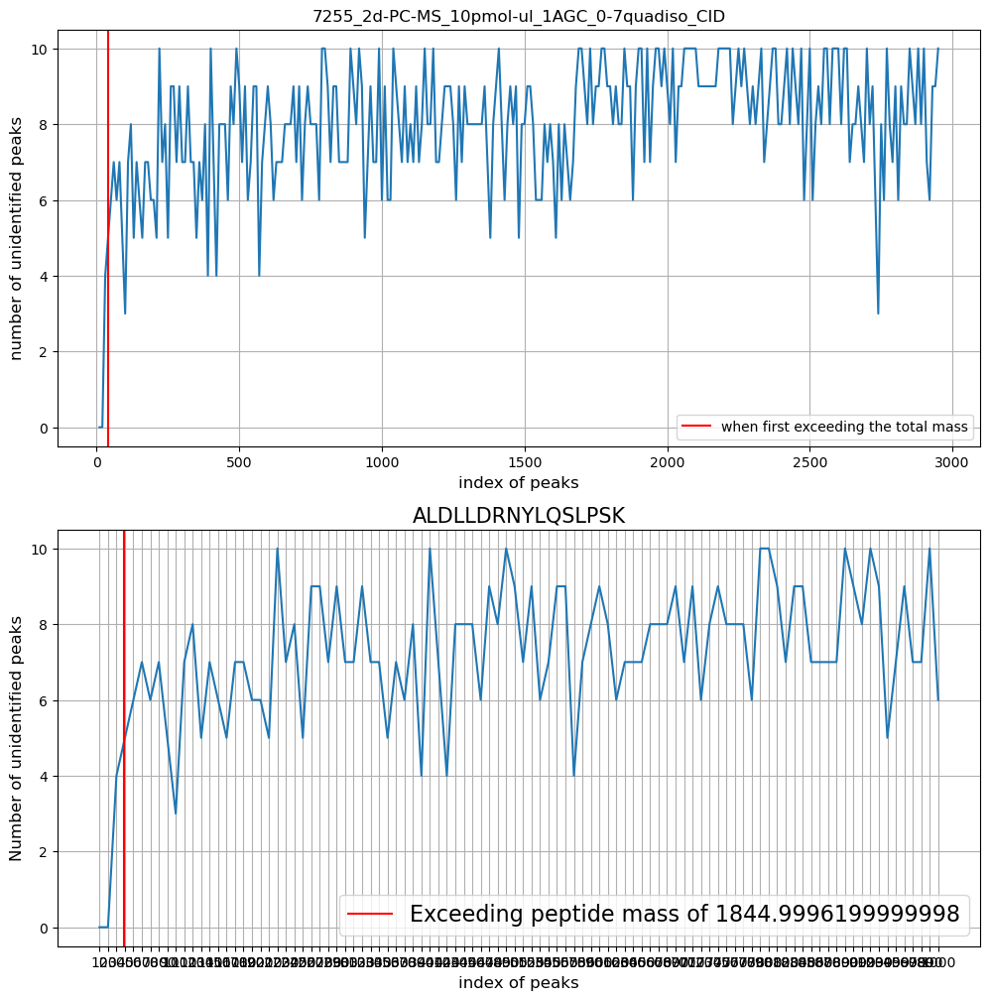

In [199]:
plt.figure(figsize=(12, 12))

plt.subplot(211)
plt.xlabel('index of peaks',size=12)
plt.ylabel('number of unidentified peaks',size=12)

# recall the function defined
# plot x_list against y_list
plt.plot(list_number(len(df), max_number)[0],list_number(len(df),max_number)[1])

# draw the vertical line indicating where the mass is exceeding
plt.axvline(x=list_number(len(df), max_number)[2], c='r',label='when first exceeding the total mass')
plt.grid()
plt.legend()
plt.title(name)
# plot a zoom in version 
zoom_in_fragment = 1000
plt.subplot(212)       
plt.ylabel('Number of unidentified peaks',size=12)
plt.xlabel('index of peaks',size=12)
plt.title(peptide_sequence,fontsize=15)
plt.grid()
plt.plot(list_number(zoom_in_fragment , max_number)[0],list_number(zoom_in_fragment , max_number)[1])
plt.xticks(list_number(zoom_in_fragment , max_number)[0])
plt.axvline(x=list_number(len(df), max_number)[2], c='r',label='Exceeding peptide mass of '+ str(max_number))
plt.legend(loc='best', fontsize=16)

plt.savefig(args.parpath + str(scan_number)+' scans/'+ name +'_histogram.jpg')

In [200]:
tic_x, tic_y = list_number(len(df), max_number)[0],list_number(len(df),max_number)[1]
tic_local_x, tic_local_y = list_number(zoom_in_fragment , max_number)[0],list_number(zoom_in_fragment , max_number)[1]
tic_line = list_number(len(df), max_number)[2]

In [201]:
featfile = path+'/w_top_feat' + str(method) + '.npy'

In [202]:
top_feat = np.load(featfile)

1.c-ion: mass = mass of b-ion + 17.0265

2.z-ion: mass = y-ion - 17.0265

3.NH3-loss product: any of the a,b,y-ions - 17.0265

4.H2O-loss product: any of the a,b,y-ions - 18.0106

5.Neutral loss of HN=C=NH molecule specific to Arg (R) residue: any ion that contains R- residue - 42.0218

6.Internal b-ions: sum of the residue masses + 1.0078, as in the formula for the regular b-ions

7.Internal a-ions: same reduction by the CO mass from the corresponding b-ion as for the terminal a-ions

8.Internal a,b-ions can also lose NH3 or H2O as the terminal a,b ions do.

9.C-ion cannot be produced if the next residue after the last residue of c-ion is Pro (P), because the nitrogen is part of a ring structure in this amino acid - please look at its chemical structure and you'll see why. So, we need to code this new rule into your software.

In [203]:
peptide_input = peptide_input.replace('K(Ac)', '1')
peptide_input = peptide_input.replace('R(Me2)', '2')
peptide_input = peptide_input.replace('Y(p)', '3')
peptide_input = peptide_input.replace('F(NH2)', '4')

# 21/12/2022
peptide_input = peptide_input.replace('R(Me)', '5')

# For the term "R(sMe2)," it signifies "symmetric dimethylation," where the two methyl groups are attached to the same nitrogen atom in the guanidine group. 
peptide_input = peptide_input.replace('R(sMe2)', '2')

# For the term "R(aMe2)," it signifies "asymmetric dimethylation," where the two methyl groups are attached to different nitrogen atoms in the guanidine group. 
peptide_input = peptide_input.replace('R(aMe2)', '2') 

peptide_input = peptide_input.replace('pY', '3')
peptide_input = peptide_input.replace('(nitro)Y', '6')
peptide_input = peptide_input.replace('K(Me)3', '7')
peptide_input = peptide_input.replace('C(SO3H)', '8')
peptide_input = peptide_input.replace('Y(SO3H)', '9')

# The lowercase letter to represent "Myr" is usually "m" in the context of representing the myristoyl group in peptide sequences.
peptide_input = peptide_input.replace('Myr', 'm')

# For the lowercase letter that can represent norleucine (Nle) in a peptide sequence, it is common to use "n" or "l" to represent norleucine. 
peptide_input = peptide_input.replace('Nle', 'n')

define = {'A' : 71.03711, 'R' : 156.10111, 'N' : 114.04293, 'D' : 115.02694,
         'C' : 103.00919, 'E' : 129.04259, 'Q' : 128.05858, 'G' : 57.02146,
         'H' : 137.05891, 'I' : 113.08406, 'L' : 113.08406, 'K' : 128.09496, 
         'M' : 131.04049, 'F' : 147.06841, 'P' : 97.05276, 'S' : 87.03203,
         'T' : 101.04768, 'W' : 186.07931, 'Y' : 163.06333, 'V' : 99.06841,
         '1': 128.09496+42.0106,   '2': 156.10111+28.0314,  '3': 163.06333+79.9663,   
          '4': 147.06841-0.98402, '5': 156.10111+28.0314/2, '6': 163.06333+44.9851,
         '7': 128.09496 + 3 * 28.0314/2, '8': 103.00919 + 80.062, '9': 163.06333 + 80.062,
         'm': 210.1984, 'n': 113.1151}

peptide_list =list(peptide_input)
peptide = []
for item in peptide_list:
    peptide.append(define[item])
    

# HN=C=NH loss specific to R residue 
# any ion - 42.0218
R_residue = []
for i in nb.prange(len(peptide_input)):
    if peptide_input[i] == 'R':
        R_residue.append(-42.0218)
    else:
        R_residue.append(0)    
        
        
# CH3CH2SCH3 loss specific to M residue
# any ion -76.0346 
M_residue = []
for i in nb.prange(len(peptide_input)):
    if peptide_input[i] == 'M':
        M_residue.append(-76.0346)
    else:
        M_residue.append(0)


In [204]:
# create arrays for y and b ions with charge 1+
# e.g. for peptide sequence VTIMPK(Ac)DIQLAR
#      y_charge1 array has numbers in the form of ['R+19.01838', 'R+A+19.01838','R+A+L+19.01838',
#                                                   ...,'R+A+L+Q+I+D+K(Ac)+P+M+I+T+19.01838']
#      b_charge1 array has numbers in the form of ['V+1.00782', 'V+T+1.00782','V+T+I+1.00782',
#                                                   ...,'V+T+I+M+P+K(Ac)+D+I+Q+L+A+1.00782']
# therefore, when calculate the theoretical values, b_charge1[0] will form a complementary pair with y_charge1[-1]
y_charge1 = []
b_charge1 = []
arr_y = 19.01838
arr_b = 1.00782

for i in nb.prange(1,len(peptide)):
    arr_y = peptide[-i] + arr_y
    arr_b = peptide[i-1] + arr_b
    y_charge1.append(arr_y)
    b_charge1.append(arr_b)
a_charge1 = [x - 28 for x in b_charge1]    
c_charge1 = [x + 17.0265 for x in b_charge1]    
x_charge1 = [x + 28 for x in y_charge1]       
z_charge1 = [x - 17.0265 for x in y_charge1]

In [205]:
# count all possible theoretical complementary pairs
complem =[]

# i loops over the peptide length, 
# starts from 0 and ends with len(peptide)-2
for i in nb.prange(len(peptide)-1):
    # c1 loops for charge state of the 1st fragment in the pair
    # c2 loops for charge state of the 2nd fragment in the pair
    for c1 in nb.prange(1,int(charge_input)):
        for c2 in nb.prange(1,int(charge_input)):
            # for complementary pairs, combined charge states should match with the total charge of peptide
            if c1+c2 == int(charge_input):

                ax = ['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2.5]
                bx = ['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2]
                cx = ['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',4]
                ay = ['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',0.5]
                by = ['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',0]
                cy = ['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2]
#                 az = ['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2.5]
#                 bz = ['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',2]
#                 cz = ['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',4]
                
                complem.append(by)
                complem.append(ay)
                
                # C-ion cannot be produced if the next residue after the last residue of c-ion is Pro (P),
                if peptide[i+1] != 97.05276:
                    complem.append(cy)
                    complem.append(cx)  
#                     complem.append(cz)
    
                complem.append(bx)
#                 complem.append(bz)
                
                complem.append(ax)
#                 complem.append(az)
                 
            # NH3 loss or H2O loss  
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 +(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 0.5])
                complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 0.5])
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 0.5])
                complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 0.5])
                
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)',1])
                complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)',1])
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])
                complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                
                if peptide[i+1] != 97.05276:
                    complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2.5])              
                    complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2.5])
                      
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
#                 complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])                            
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
#                 complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                                            
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                 complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                 complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                
            # 1 neutral loss on both sides
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1])
                
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]- 18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1])

            # NH3 and H2O loss
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])  
                complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 1])     
                                            
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])   
                complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 1.5]) 
                                            
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                 complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                                                
                if peptide[i+1] != 97.05276:                                
                    complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])   
                         
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+(c2-1)*1.00784)/c2,
                       'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                 complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+(c2-1)*1.00784)/c2,
#                        'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
             
                # 2 neutral loss on one side and 1 neutral loss on the other
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 1.5])
                complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 1.5])   
                                            
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])
                complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])   
                                            
                # 2 neutral loss on one side and 2 neutral loss on the other              
                complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])                            
                complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]- 17.0265 -18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]- 17.0265-18.0106+(c2-1)*1.00784)/c2,
                       'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])

In [206]:
## one terminal and one internal

term_and_inter =[]
# i loops over from 0 to len(peptide)-4 for the terminal ion
# it stands for the position of terminal ions
# because for example the peptide VTIMPK(Ac)DIQLAR
# the terminal y-ions can at most count from R to M to ensure an internal b-ion (the shortest is b(2-3):T+I)
for i in nb.prange(len(peptide_input)-3):
    # b-ion counts from rhs and lhs are counted separately
    # for pairing terminal y-ions and terminal b-ions respectively
    b_new_arr = peptide[-i-2] + 1.00782
    bb_new_arr = peptide[i+1] + 1.00782
    
    # k loops over from 2 to len(peptide)-2, for the internal ion
    # it stands for the positions where the internal b-ions stop counting
    for k in nb.prange(2, len(peptide_input)-1):
        # k needs to be larger than i+1
        if k > (i+1):
            # the logic is a bit complicated here
            # e.g. for peptide VTIMPK(Ac)DIQLAR, i loops from 0 to 8, 
            # when i=0, b_new_arr has peptide[-2]+1.00782=A+1.00782 and bb_new_arr has T+1.00782 at start
            # and k loops from 2 to 10, all of them are larger than i+1=1,
            # take k=2 as example, 
            # the internal b_new_arr will add the letter at peptide[-3], which is L
            # and therefore b_new_arr = A+L+1.00782 = b(10-11)
            # bb_new_arr will add peptide[2], which is I
            # and therefore bb_new_arr = T+I+1.00782 = b(2-3)
            # as k loops to higher number, b_new_arr can at most add up to b(2-11) and bb_new_arr to b(2-11) as well
            b_new_arr = b_new_arr + peptide[-k-1]
            bb_new_arr =  bb_new_arr + peptide[k]
            for c1 in nb.prange(1,int(charge_input)):
                for c2 in nb.prange(1,int(charge_input)):
                    if c1+c2 <= int(charge_input):
                      
                      # without neutral loss
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1])
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5])

                      # H2O/NH3 loss(1 neutral loss) of internal/terminal a/b ions
                      # no loss on the other 
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5])  
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+(c2-1)*1.00784 )/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5]) 
                        
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+(c2-1)*1.00784) /c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                        
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr-28+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr-28+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                              
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                       
                      # H2O/NH3 loss(1 neutral loss) on both internal and terminal ions                  
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])                      
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])      
                                              
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5]) 
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                             
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])                      
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])      
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5]) 
                                              
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                         
                      # H2O and NH3 loss(2 neutral loss) of internal/terminal a/b ions 
                      # no loss on the other
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2])                      
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+(c2-1)*1.00784) /c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2])     
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])            
                                              
                        term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                     
                      # H2O and NH3 loss(2 neutral loss) of internal/terminal a/b ions 
                      # H2O/NH3 1 neutral loss on the other  
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])               
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5]) 
                                              
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])       
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                              
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3])
                        term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3])                          
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                        
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3]) 
                        term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3])                                                        
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])  
                                              
                      # H2O and NH3 loss(2 neutral loss) of internal/terminal a/b ions 
                      # H2O and NH3 loss(2 neutral loss) on the other                      
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])    
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -17.0265-18.0106+(c2-1)*1.00784)/c2 ,
                                             'b(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)-(NH3)('+str(c2)+'+)', 3])                      
                        term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (b_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])                      
                        term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                             'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])                                     

In [207]:
# two terminals ions
# non-complementary
term_and_term = []
# i and j both loops from 0 to 10 in case of peptide VTIMPK(Ac)DIQLAR
# when i = 3, b-ion equals to V+T+I+M+1.00782 = b4 
# j has to be smaller than 12-3-2 = 7, otherwise if j=7
# y-ion will be R+A+L+Q+I+D+K(Ac)+P+19.01838 = y8 and that will form a complementary pair
for i in nb.prange(len(peptide_input)-2):
    for j in nb.prange(len(peptide_input)-2):
        if j < len(peptide_input)-i-2:
            for c1 in nb.prange(1,int(charge_input)):
                for c2 in nb.prange(1,int(charge_input)):
                    if c1+c2 <= int(charge_input):
                      # no neutral loss
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 
                                              'y'+str(j+1)+'('+str(c2)+'+)', 1.5])                        
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 
                                              'y'+str(j+1)+'('+str(c2)+'+)', 2])
                        
                        if peptide[i+1] != 97.05276:
                            term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 
                                                  'y'+str(j+1)+'('+str(c2)+'+)', 3.5])
                            term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 
                                                  'x'+str(j+1)+'('+str(c2)+'+)', 5.5])
#                             term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 
#                                                   'z'+str(j+1)+'('+str(c2)+'+)', 5.5])
                    
                            
#                         term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 
#                                               'z'+str(j+1)+'('+str(c2)+'+)', 3.5])
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 
                                              'x'+str(j+1)+'('+str(c2)+'+)', 3.5])
                        
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 
                                              'x'+str(j+1)+'('+str(c2)+'+)', 4])
#                         term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 
#                                               'z'+str(j+1)+'('+str(c2)+'+)', 4])
 
                        
                      # NH3/H2O (1 neutral loss) loss on one side
                        # 3 bond cleavages
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2])
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', 
                                              (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2])
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', 
                                              (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2])
                        
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', 
                                              (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', 
                                              (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                        
                        term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)',
                                              (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 4])
                        term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', 
                                              (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 4])
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4])
#                         term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
#                                               (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4])
#                         term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
#                                               (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4])
                        
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        
#                         term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
#                                               (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                         term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)',
#                                               (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        
                        
                      # NH3/H2O (1 neutral loss) loss on both sides
                        # 4 bond cleavages
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                        
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3]) 
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                        
                      # NH3 and H2O (2 neutral loss) loss on one side
                        # 4 bond cleavages
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                        term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', 
                                              (b_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                        term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', 
                                              (a_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        
                        term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', 
                                              (c_charge1[i]+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4.5])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
                        
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (x_charge1[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)',
                                              (a_charge1[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (z_charge1[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                        
                      # NH3 and H2O (2 neutral loss) loss on one side
                      # and NH3/H2O (1 neutral loss) loss on the other
                        # 5 bond cleavages
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                    
                        term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])
                        term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (b_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])  
                        
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])
                        
                        term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', 
                                              (a_charge1[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                        
                      # NH3 and H2O (2 neutral loss) loss on both sides
                        # 6 bond cleavages  
                        term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (b_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                        term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', 
                                              (a_charge1[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])  
 

In [208]:
# R_residue loss
# only apply when R_residue array has values
if sum(R_residue) != 0:
    y_R = []
    b_R = []
    arrR_y = 0
    arrR_b = 0
    # to make y_R and b_R arrays which have length of len(peptide)-1,
    # the elements in the array corresponding to their cumulative sum
    # e.g. R_residue = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, -42.0218] for peptide VTIMPK(Ac)DIQLAR
    # its b_R will be [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0] and 
    # y_R will be [-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218,-42.0218]
    # they will be added with peptide according to their matched sequence
    for i in nb.prange(1,len(R_residue)):
        arrR_y = R_residue[-i] + arrR_y
        arrR_b = R_residue[i-1] + arrR_b
        y_R.append(arrR_y)
        b_R.append(arrR_b)
  
    # complementary 
    for i in nb.prange(len(peptide)-1):
        for c1 in nb.prange(1,int(charge_input)):
            for c2 in nb.prange(1,int(charge_input)):
                if c1+c2 == int(charge_input): 
                    if b_R[i] != 0:
                        if peptide[i+1] != 97.05276:
                            complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
#                             complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                                'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                               'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 4.5])
                            
                            
                        complem.append(['a'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                        
                        complem.append(['a'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 0.5])
                        
                        complem.append(['a'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                         complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                        
                        
                        complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1])
                        
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])        
#                         complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                         complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])     
                        
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])        
#                         complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                         complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(HN=C=NH)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])     

                    elif y_R[-i-1] != 0:
                        if peptide[i+1] != 97.05276:
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                               'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
#                             complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                                'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3])
                            
                            
                            
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                        
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 0.5])
                        
#                         complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
#                         complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                        
                        
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1.5])
#                         complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1])
#                         complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1.5])
#                         complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1])
#                         complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 2])
#                         complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 1.5])
#                         complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_R[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(HN=C=NH)('+str(c2)+'+)', 3.5])

                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 1])
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2])
                        
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 1])
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_R[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2])
                        
    # uncomplementary
    # terminal and internal
    for i in nb.prange(len(peptide_input)-3):
        bR_new_arr = R_residue[-i-2]
        bbR_new_arr = R_residue[i+1]
        
        b_new_arr = peptide[-i-2]+1.00782
        bb_new_arr = peptide[i+1]+1.00782
        for k in nb.prange(2, len(peptide_input)-1):
            if k > (i+1):
                bR_new_arr = bR_new_arr + R_residue[-k-1]
                bbR_new_arr =  bbR_new_arr + R_residue[k]
                b_new_arr = b_new_arr + peptide[-k-1]
                bb_new_arr =  bb_new_arr + peptide[k]
                for c1 in nb.prange(1,int(charge_input)):
                    for c2 in nb.prange(1,int(charge_input)):
                        if c1+c2 <= int(charge_input):
                            if y_R[i] != 0:
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                            
                            elif b_R[i] != 0:   
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'-(H2O)('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'-(NH3)('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'-(NH3)('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                            elif bR_new_arr != 0:
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_R[i]+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3.5])
                                               
                                
                            elif bbR_new_arr != 0:
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784) /c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                
                                
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])    
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])    
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])    
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(HN=C=NH)'+'('+str(c2)+'+)', 3.5])    
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbR_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(HN=C=NH)'+'('+str(c2)+'+)', 3.5])
                            else:
                                pass
                            
    # uncomplementary
    # two terminals
    for i in nb.prange(len(peptide_input)-2):
        for j in nb.prange(len(peptide_input)-2):
            if j < len(peptide_input)-i-2:
                for c1 in nb.prange(1,int(charge_input)):
                    for c2 in nb.prange(1,int(charge_input)):
                        if c1+c2 <= int(charge_input):
                            if b_R[i] != 0:  
                                
                                if peptide[i+1] != 97.05276:
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 4])
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 6])
#                                     term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 6])
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 5])
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                

                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])

#                                 term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4])
#                                 term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                             
                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                
                                
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 3])
                        
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])

#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5]) 
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4])
                                

                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 3])
                        
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])
                                
#                                 term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5]) 
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(HN=C=NH)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4])
                                
                            elif y_R[j] != 0:
                                if peptide[i+1] != 97.05276:
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                     (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                     (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 6])
#                                     term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                      (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 6])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                     (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                     (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 4.5])

                                    
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                

                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])

#                                 term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4])
#                                 term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                               
                                
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_R[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3])
                                
                                
               
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5.5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_R[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(HN=C=NH)('+str(c2)+'+)', 5.5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(HN=C=NH)('+str(c2)+'+)', 4])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_R[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_R[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(HN=C=NH)('+str(c2)+'+)', 4])
     

In [209]:
# M-residue loss
# only apply when M_residue array has values
if sum(M_residue) != 0:
    y_M = []
    b_M = []
    arrM_y = 0
    arrM_b = 0
    # to make y_M and b_M arrays which have length of len(peptide)-1,
    # the elements in the array corresponding to their cumulative sum
    # e.g. M_residue = [0, 0, 0, -76.0346, 0, 0, 0, 0, 0, 0, 0, 0] for peptide VTIMPK(Ac)DIQLAR
    # its b_R will be [0, 0, 0, -76.0346, -76.0346, -76.0346, -76.0346, -76.0346, -76.0346, -76.0346, -76.0346] and 
    # y_R will be [0, 0, 0, 0, 0, 0, 0, 0,-76.0346,-76.0346,-76.0346]
    # they will be added with peptide according to their matched sequence
    for i in nb.prange(1,len(M_residue)):
        arrM_y = M_residue[-i] + arrM_y
        arrM_b = M_residue[i-1] + arrM_b
        y_M.append(arrM_y)
        b_M.append(arrM_b)
        
    # complementary 
    for i in nb.prange(len(peptide)-1):
        for c1 in nb.prange(1,int(charge_input)):
            for c2 in nb.prange(1,int(charge_input)):
                if c1+c2 == int(charge_input):    
                    if b_M[i] != 0:
                        if peptide[i+1] != 97.05276:
                            complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                                'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                                'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
#                             complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                                 'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                                'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                                'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 3])
                            
                            
                        complem.append(['a'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                        
                        complem.append(['a'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 0.5])
                        
                        complem.append(['a'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
#                         complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 2.5])
                        
                        
                        complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1])
                        
                        complem.append(['b'+ str(i+1)+'-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1])
                        
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])        
#                         complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                         complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])     
                        
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 1])        
#                         complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3.5])
#                         complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)('+str(c2)+'+)', 1.5])     
                        complem.append(['a'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)-(CH3CH2SCH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(NH3)('+str(c2)+'+)', 2])     



                    elif y_M[-i-1] != 0:
                        if peptide[i+1] != 97.05276:
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                               'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
#                             complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                                'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                            complem.append(['c'+ str(i+1)+'('+str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                               'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                            
                            
                            
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                        
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 0.5])
                        
#                         complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
#                         complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                        
                        
                        
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
#                         complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1])
#                         complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
#                         complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1])
#                         complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2])
#                         complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (x_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'x'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
#                         complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (z_charge1[-i-1]+y_M[-i-1]+(c2-1)*1.00784)/c2,
#                            'z'+ str(len(peptide)-i-1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])

                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 1])
                       
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-18.0106+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        
                        complem.append(['a'+ str(i+1)+'('+str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['b'+ str(i+1)+'('+str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 1])
                       
                        complem.append(['a'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(H2O)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                        complem.append(['b'+ str(i+1)+'-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 1.5])
                        complem.append(['a'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                        complem.append(['b'+ str(i+1)+'-(H2O)-(NH3)('+str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (y_charge1[-i-1]+y_M[-i-1]-17.0265+(c2-1)*1.00784)/c2,
                           'y'+ str(len(peptide)-i-1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                
    # uncomplementary
    # terminal and internal
    for i in nb.prange(len(peptide_input)-3):
        bM_new_arr = M_residue[-i-2]
        bbM_new_arr = M_residue[i+1]
        
        b_new_arr = peptide[-i-2]+1.00782
        bb_new_arr = peptide[i+1]+1.00782
        for k in nb.prange(2, len(peptide_input)-1):
            if k > (i+1):
                bM_new_arr = bM_new_arr + M_residue[-k-1]
                bbM_new_arr =  bbM_new_arr + M_residue[k]
                b_new_arr = b_new_arr + peptide[-k-1]
                bb_new_arr =  bb_new_arr + peptide[k]
                for c1 in nb.prange(1,int(charge_input)):
                    for c2 in nb.prange(1,int(charge_input)):
                        if c1+c2 <= int(charge_input):
                            if y_M[i] != 0:
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')'+'('+str(c2)+'+)', 2.5])
                                
                            elif b_M[i] != 0:   
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(NH3)'+'('+str(c2)+'+)', 3.5])
                                
                            elif bM_new_arr != 0:
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                
                                
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'('+ str(c1)+'+)', (y_charge1[i]+y_M[i]+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3.5])
                                
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['y'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['y'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (y_charge1[i]+y_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (b_new_arr+bM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(len(peptide_input)-k) + '-' + str(len(peptide_input)-i-1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3.5])
                            
                            elif bbM_new_arr != 0:
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 1.5])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                
                                
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])    
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2])
                                term_and_inter.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])    
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])    
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 2.5])
                                term_and_inter.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-18.0106+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-18.0106+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(H2O)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3.5])    
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr-17.0265+(c2-1)*1.00784)/c2,
                                                 'b(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3])
                                term_and_inter.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265-18.0106+(c1-1)*1.00784)/c1, (bb_new_arr+bbM_new_arr -28-17.0265+(c2-1)*1.00784)/c2,
                                                 'a(' + str(i+2) + '-' + str(k+1) + ')-(NH3)-(CH3CH2SCH3)'+'('+str(c2)+'+)', 3.5])
                            else:
                                pass
                            
    # uncomplementary
    # two terminals
    for i in nb.prange(len(peptide_input)-2):
        for j in nb.prange(len(peptide_input)-2):
            if j < len(peptide_input)-i-2:
                for c1 in nb.prange(1,int(charge_input)):
                    for c2 in nb.prange(1,int(charge_input)):
                        if c1+c2 <= int(charge_input):
                            if b_M[i] != 0:  
                                if peptide[i+1] != 97.05276:
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 4])
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 6])
#                                     term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                 (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 6])
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 5])
                                    
                                    
                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                

                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                
#                                 term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                  (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4])
#                                 term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                  (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                
                                
                                
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 3])
                        
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])
                    
                    
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5]) 
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'('+str(c2)+'+)', 3])
                        
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'('+str(c2)+'+)', 5])

                                
#                                 term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'('+str(c2)+'+)', 5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)('+str(c2)+'+)', 3.5])                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)('+str(c2)+'+)', 3.5]) 
                                term_and_term.append(['b'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)-(CH3CH2SCH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(NH3)('+str(c2)+'+)', 4])
                                
                            elif y_M[j] != 0:
                                
                                if peptide[i+1] != 97.05276:
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 6])
#                                     term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                 (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 6])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                    term_and_term.append(['c'+str(i+1)+'('+ str(c1)+'+)', (c_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                    
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                

                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                 (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                 (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                

#                                 term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                  (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4])
#                                 term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
#                                                  (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                
                                
                                
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                
                                term_and_term.append(['b'+str(i+1)+'('+ str(c1)+'+)', (b_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'('+ str(c1)+'+)', (a_charge1[i]+b_M[i]+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                
                                

                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 4.5])
#                                 term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                
                                term_and_term.append(['b'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 2.5])
                                term_and_term.append(['a'+str(i+1)+'-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 3])
                    

                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (x_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'x'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5.5])
                               
#                                 term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5])
#                                 term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
#                                                       (z_charge1[j]+y_M[j]+(c2-1)*1.00784)/c2, 'z'+str(j+1)+'-(CH3CH2SCH3)('+str(c2)+'+)', 5.5])
                              
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-18.0106+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(H2O)-(CH3CH2SCH3)('+str(c2)+'+)', 4])
                                
                                term_and_term.append(['b'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (b_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1,
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 3.5])
                                term_and_term.append(['a'+str(i+1)+'-(H2O)-(NH3)('+ str(c1)+'+)', (a_charge1[i]+b_M[i]-18.0106-17.0265+(c1-1)*1.00784)/c1, 
                                                      (y_charge1[j]+y_M[j]-17.0265+(c2-1)*1.00784)/c2, 'y'+str(j+1)+'-(NH3)-(CH3CH2SCH3)('+str(c2)+'+)', 4])


In [210]:
sequence = complem + term_and_inter + term_and_term

import pandas as pd
# create a pandas dataframe to add title for each column and round the m/z values
df_ref = pd.DataFrame(sequence, columns=['Interpretation A','m/z A', 'm/z B', 'Interpretation B','Plausibility'])
df_ref['m/z A']=df_ref['m/z A'].round(2)
df_ref['m/z B']=df_ref['m/z B'].round(2)
sequence=df_ref.to_numpy()


# save the file 
npy_file = path +'/sequence.npy'
np.save(npy_file, sequence)
df_ref.to_csv(path + '/sequence.csv')

correlation = []
## cut off diagonal with 5.5 Da
new_top_feat=[]
for i in top_feat:
    if abs(i[0]-i[1])>=5.5:
        new_top_feat.append(i)
new_top_feat = np.array(new_top_feat)        
# display(top_feat)

# compare the measured fragments pairs to theoretical values list
# if the difference is smaller than or equal to the tolerance, 
# the array created will record this pair
for i in new_top_feat:
    for j in sequence:
        if abs(i[0]-j[2]) <= tolerance and abs(i[1]-j[1]) <= tolerance:
            mass_deviation = np.sqrt(abs(i[0]-j[2])**2+abs(i[1]-j[1])**2)
            correlation.append([str(j[3]), i[0], i[1], str(j[0]), i[2], i[3], j[4], mass_deviation.round(3)])
        elif abs(i[0]-j[1]) <= tolerance and abs(i[1]-j[2]) <= tolerance:
            mass_deviation = np.sqrt(abs(i[0]-j[1])**2+abs(i[1]-j[2])**2)
            correlation.append([str(j[0]), i[0], i[1], str(j[3]), i[2], i[3], j[4], mass_deviation.round(3)])
            
            
correlation = np.array(correlation)
correlation[:,1:3]
correlation_list = correlation[:,1:3].astype(float).tolist()

# if there is no match with the theoretical values, will record the pair as unidentified fragments
unidentify = []
for item in new_top_feat.tolist():
    if item[:2] not in correlation_list:
        unidentify.append(['',item[0],item[1],'',item[2],item[3],'',''])
        
correlation_new = correlation.tolist()+unidentify
correlation_new = np.array(correlation_new)

# sort the fragments according to their normalised correlation scores
mapp = np.array([float(x) for x in correlation_new[:, 5]])
correlation_new = correlation_new[np.flip(mapp.argsort())]

df = pd.DataFrame(correlation_new, columns=['Interpretation A','m/z A', 'm/z B', 'Interpretation B',
                 'CorrelationScore', 'NormalisedScore', 'Plausibility','MassDeviation'])

df.NormalisedScore = df.NormalisedScore.astype(float)

# sort the fragments according to normalisation scores and then to their interpretation plausibility and then to
# their mass deviation from theoretical values
df2 = df.sort_values(by=['NormalisedScore','Plausibility','MassDeviation'], ascending = [False, True, True])

correlation_new=df2.to_numpy()

# add index number to fragments
# different index numbers refer to different pairs
plus_index =[]
number=1
for row in nb.prange(len(correlation_new)):
    if row < 1:
        plus_index.append(np.insert(correlation_new[row],0,number))
    elif row >= 1:
        if correlation_new[row][1]==correlation_new[row-1][1] and correlation_new[row][2]==correlation_new[row-1][2]:
            plus_index.append(np.insert(correlation_new[row],0,''))
            
        else:
            number = number+1
            plus_index.append(np.insert(correlation_new[row],0,number))

plus_index.insert(0,['Index','Interpretation A','m/z A', 'm/z B', 'Interpretation B',
                 'CorrelationScore', 'NormalisedScore', 'Plausibility','MassDeviation'])

In [211]:
print(new_top_feat)

[[6.59070000e+02 8.31080000e+02 4.60363356e+02 1.55396520e+00]
 [5.37620000e+02 6.59060000e+02 1.59127127e+03 7.02290386e+00]
 [5.93970000e+02 6.59180000e+02 1.71226799e+03 8.88178266e+00]
 ...
 [5.92010000e+02 6.87350000e+02 6.09220064e+00 8.31744432e-01]
 [3.41480000e+02 5.31030000e+02 1.61551306e+01 1.70908702e+00]
 [6.03270000e+02 9.52110000e+02 5.73909796e+00 9.97318326e-01]]


In [212]:
print(sequence)

[['b1(1+)' 72.04 887.99 'y15(2+)' 0.0]
 ['a1(1+)' 44.04 887.99 'y15(2+)' 0.5]
 ['c1(1+)' 89.07 887.99 'y15(2+)' 2.0]
 ...
 ['a14-(NH3)-(HN=C=NH)(2+)' 763.41 130.09 'y1-(NH3)(1+)' 3.5]
 ['b14-(NH3)-(HN=C=NH)(2+)' 777.41 112.08 'y1-(H2O)-(NH3)(1+)' 3.5]
 ['a14-(NH3)-(HN=C=NH)(2+)' 763.41 112.08 'y1-(H2O)-(NH3)(1+)' 4.0]]


In [213]:
print(plus_index)

[['Index', 'Interpretation A', 'm/z A', 'm/z B', 'Interpretation B', 'CorrelationScore', 'NormalisedScore', 'Plausibility', 'MassDeviation'], array([1, 'b10(2+)', '593.97', '659.18', 'y6(1+)', '1712.2679940600246',
       8.881782660256563, '0.0', '0.407'], dtype=object), array(['', 'y10-(H2O)(2+)', '593.97', '659.18', 'c6(1+)',
       '1712.2679940600246', 8.881782660256563, '2.5', '0.877'],
      dtype=object), array([2, 'y6(1+)', '659.09', '1074.42', 'b9(1+)', '1016.1403326256273',
       7.77508471330729, '1.5', '0.313'], dtype=object), array(['', 'y6(1+)', '659.09', '1074.42', 'b(2-10)-(HN=C=NH)(1+)',
       '1016.1403326256273', 7.77508471330729, '1.5', '0.322'],
      dtype=object), array([3, 'y5(1+)', '531.08', '658.97', 'b11(2+)', '1012.9104298693735',
       7.45863633461646, '0.0', '0.661'], dtype=object), array(['', 'y5(1+)', '531.08', '658.97', 'b(7-11)-(NH3)(1+)',
       '1012.9104298693735', 7.45863633461646, '1.5', '0.68'],
      dtype=object), array(['', 'y5(1+)', '531

In [214]:
df_tmp = pd.DataFrame(plus_index, columns=['Index', 'interpretation 1','m/z 1','m/z 2','interpretation 2','score',
                                         'normalised score','Plausibility','MassDeviation'])

In [215]:
df_tmp['interpretation 1'] != ''

0        True
1        True
2        True
3        True
4        True
        ...  
3463    False
3464    False
3465    False
3466    False
3467     True
Name: interpretation 1, Length: 3468, dtype: bool

In [216]:
# save the file 
name_of_file =  path +'/'+str(name) + str(method) + '.csv'
npy_file = path +'/interpretation' + str(method) + '.npy'
np.savetxt(name_of_file, plus_index,delimiter=',',fmt = '%s')
np.save(npy_file, plus_index)

In [217]:
name_of_file

'./peptide output/Test/7255_2d-PC-MS_10pmol-ul_1AGC_0-7quadiso_CID/10000 scans//7255_2d-PC-MS_10pmol-ul_1AGC_0-7quadiso_CID_cma(loss_func1,bins:100).csv'

## Histogram plots

This part plots the number of unidentified peaks against peak index. Here the peak index refers to every ten fragments, which means 10, 20, 30, 40....
Such plots allow us to observe how well the fragments can be interpreted and indicate when the total mass is exceeded.

In [218]:
import numpy as np
import time
import matplotlib.pyplot as plt
from numpy import insert
import time
import pandas as pd

In [219]:
'''define a function used to plot number of unidentified fragments against peak index (10,20,30,40...)
input: number of fragment pairs and the total mass of corresponding peptide
return: x and y arrays for plots and the position where the total mass is exceeded'''

def list_number(range_number, max_maxx):
    count = [] 
    
    ## if there is no interpretations, array appends '1',
    ## if there are interpretations, array appends '0'
    for i in nb.prange(range_number):
        if df.iloc[i]['interpretation 1'] is np.nan:
            count.append(1)
        else:
            count.append(0)
            
    ## find the position where the fragments mass exceeds that of peptide
    for j in nb.prange(len(df)):
        if df.iloc[j]['m/z 1']+df.iloc[j]['m/z 2'] > max_maxx:
            outlier_index = j+1
            break
        else:
            pass
            
    newlist=np.array(count)
    y_list = []
    x_list = []
    x_value = 0
    
    while len(newlist) >= 10:
        # count the sum of array for the first 10 peaks
        # the sum is equivalent to the number of unidentified peaks
        first_ten = newlist[:10]
        y_list.append(sum(first_ten))
         # count the sum of array for next 10 peaks
        newlist = newlist[10:]
        # create an array for x-axis array
        x_value = x_value+10
        x_list.append(x_value)

    return x_list, y_list, outlier_index

In [220]:
# 20160622_1514_ME14_3+_1to2500_CVscan_NCE35
# 20200206_1455,20_ME16_3+_NCE15_AGC100_cvScan2000_turbo_1,7V_2uL
# 20161208_1724_ME16_3+_CVscan_Normal_isoWidth1
# 20161121_1714_ME14_3+_CVscan_AGCMSn100_Normal
# 20160603_1040_ME9_3+_CVscan_NCE35_Turbo
# 20160503_1127_PH4_3+_CVscan_NCE35_Turbo
# 3510_2D-MS-PC_turbo
# 7302_2D-MS-PC_turbo
# 6727_2D-MS-PC_turbo
# 7255_2D-MS-PC_turbo
# 7732_2D-MS-PC_turbo
# 3510_2D-MS-PC_0-001pmol-ul_2mz-quadiso_0-01AGC
# 3510_2D-MS-PC_0-01pmol-ul_2mz-quadiso_0-1AGC
# 3510_2D-MS-PC_0-05fmol-ul_2mz-quadiso_0-005AGC
# 6727_2D-MS-PC_0-001pmol-ul_2mz-quadiso_0-005AGC
# 6727_2D-MS-PC_0-01pmol-ul_2mz-quadiso_0-01AGC
# 6727_2D-MS-PC_0-01pmol-ul_2mz-quadiso_0-1AGC

## HCD data
# 3510_2D-PC-MS_1pmol-ul_1AGC_0-7quadiso
# 3510_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso
# 7302_2D-PC-MS_2pmol-ul_1AGC_0-7quadiso
# 7302_2D-PC-MS_1pmol-ul_1AGC_0-7quadiso
# 7302_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso
# 7302_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso
# 7255_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso
# 7255_2D-PC-MS_1pmol-ul_0-1AGC_0-7quadiso
# 7255_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso
# 11/10/2022
# 7255_2D-PC-MS_10pmol-ul_1AGC_0-7quadiso
# 7732_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso
# 7732_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso


# VTIMPK(Ac)DIQLAR  ME14_3+
# EQFDDY(p)GHMRF(NH2)  PH4_3+
# GWGR(Me2)EENLFSWK  ME9_3+
# VTIMPKDIQLAR  ME16_3+
# GSHQISLDNPDYQQDFFPK_3+
# 7255  ALDLLDRNYLQSLPSK
# 7732  KFIFRTAGTAGR
# 6727  DQARVAPSSSDPKSKFF
# 7302  HGMTVVIRKKF
# 3510  GSHQISLDNPDYQQDFFPK

# load the interpretation excel from my file location
# input the peptide sequence and total mass of peptide

scan_number=numscan_list[-1]
name=args.name
peptide_sequence=peptide_input
'''['DQARVAPSSSDPKSKFF' if re.match('6727', n) 
                  else 'ALDLLDRNYLQSLPSK' if re.match('7255', n) 
                  else 'KFIFRTAGTAGR' if re.match('7732', n) 
                  else 'HGMTVVIRKKF' if re.match('7302'. n) 
                  else 'GSHQISLDNPDYQQDFFPK' if re.match('3510', n) 
                  else 'VTIMPK(Ac)DIQLAR' if re.match('ME14_3+', n) 
                  else 'EQFDDY(p)GHMRF(NH2)' if re.match('PH4_3+ ', n) 
                  else 'GWGR(Me2)EENLFSWK' if re.match('ME9_3+', n) 
                  else 'VTIMPKDIQLAR' if re.match('ME16_3+', n) else peptide_input for n in [name]][0]'''

peptide_sequence = peptide_sequence.replace('K(Ac)', '1')
peptide_sequence = peptide_sequence.replace('R(Me2)', '2')
peptide_sequence = peptide_sequence.replace('Y(p)', '3')
peptide_sequence = peptide_sequence.replace('F(NH2)', '4')

# 21/12/2022
peptide_sequence = peptide_sequence.replace('R(Me)', '5')

# For the term "R(sMe2)," it signifies "symmetric dimethylation," where the two methyl groups are attached to the same nitrogen atom in the guanidine group. 
peptide_sequence = peptide_sequence.replace('R(sMe2)', '2')

# For the term "R(aMe2)," it signifies "asymmetric dimethylation," where the two methyl groups are attached to different nitrogen atoms in the guanidine group. 
peptide_sequence = peptide_sequence.replace('R(aMe2)', '2') 

peptide_sequence = peptide_sequence.replace('pY', '3')
peptide_sequence = peptide_sequence.replace('(nitro)Y', '6')
peptide_sequence = peptide_sequence.replace('K(Me)3', '7')
peptide_sequence = peptide_sequence.replace('C(SO3H)', '8')
peptide_sequence = peptide_sequence.replace('Y(SO3H)', '9')

# The lowercase letter to represent "Myr" is usually "m" in the context of representing the myristoyl group in peptide sequences.
peptide_sequence = peptide_sequence.replace('Myr', 'm')

# For the lowercase letter that can represent norleucine (Nle) in a peptide sequence, it is common to use "n" or "l" to represent norleucine. 
peptide_sequence = peptide_sequence.replace('Nle', 'n')

define = {'A' : 71.03711, 'R' : 156.10111, 'N' : 114.04293, 'D' : 115.02694,
         'C' : 103.00919, 'E' : 129.04259, 'Q' : 128.05858, 'G' : 57.02146,
         'H' : 137.05891, 'I' : 113.08406, 'L' : 113.08406, 'K' : 128.09496, 
         'M' : 131.04049, 'F' : 147.06841, 'P' : 97.05276, 'S' : 87.03203,
         'T' : 101.04768, 'W' : 186.07931, 'Y' : 163.06333, 'V' : 99.06841,
         '1': 128.09496+42.0106,   '2': 156.10111+28.0314,  '3': 163.06333+79.9663,   
          '4': 147.06841-0.98402, '5': 156.10111+28.0314/2, '6': 163.06333+44.9851,
         '7': 128.09496 + 3 * 28.0314/2, '8': 103.00919 + 80.062, '9': 163.06333 + 80.062,
         'm': 210.1984, 'n': 113.1151}

peptide_list =list(peptide_sequence)
peptide = []
for item in peptide_list:
    peptide.append(define[item])
    
# calculate the total mass of peptide     
max_number=sum(peptide)+18.0106

columns = ['interpretation 1','m/z 1','m/z 2','interpretation 2','score','normalised score','Plausibility','MassDeviation']
df=pd.read_csv(args.parpath + str(scan_number)+' scans/'
                +name+ str(method) +'.csv', sep=',',header=None, names=columns)

df=df.drop(index=df.index[0])
# drop repeated rows accoring to column m/z 1 & m/z (delete those ones with more than 1 interpretation)
df=df.drop_duplicates(subset=['m/z 1', 'm/z 2'], keep="first").reset_index(drop=True)
df['m/z 1']=df['m/z 1'].astype(float)
df['m/z 2']=df['m/z 2'].astype(float)

In [221]:
print(max_number)

1844.9996199999998


In [222]:
pd.DataFrame(plus_index, columns=['Index', 'interpretation 1','m/z 1','m/z 2','interpretation 2','score',
                                         'normalised score','Plausibility','MassDeviation'])

,Index,interpretation 1,m/z 1,m/z 2,interpretation 2,score,normalised score,Plausibility,MassDeviation
0,Index,Interpretation A,m/z A,m/z B,Interpretation B,CorrelationScore,NormalisedScore,Plausibility,MassDeviation
1,1,b10(2+),593.97,659.18,y6(1+),1712.2679940600246,8.881783,0.0,0.407
2,,y10-(H2O)(2+),593.97,659.18,c6(1+),1712.2679940600246,8.881783,2.5,0.877
3,2,y6(1+),659.09,1074.42,b9(1+),1016.1403326256273,7.775085,1.5,0.313
4,,y6(1+),659.09,1074.42,b(2-10)-(HN=C=NH)(1+),1016.1403326256273,7.775085,1.5,0.322
...,...,...,...,...,...,...,...,...,...
3463,2949,,501.98,580.25,,5.324120086210065,0.568313,,
3464,2950,,483.98,717.25,,4.7507218443754375,0.536482,,
3465,2951,,520.01,537.49,,7.5053307153679825,0.498924,,
3466,2952,,717.65,822.74,,8.725073778787129,0.400359,,


In [223]:
df

,interpretation 1,m/z 1,m/z 2,interpretation 2,score,normalised score,Plausibility,MassDeviation
0,b10(2+),593.97,659.18,y6(1+),1712.2679940600246,8.881782660256563,0.0,0.407
1,y6(1+),659.09,1074.42,b9(1+),1016.1403326256273,7.77508471330729,1.5,0.313
2,y5(1+),531.08,658.97,b11(2+),1012.9104298693735,7.45863633461646,0.0,0.661
3,b3(1+),299.95,717.23,y12(2+),766.2930830446544,7.409931737707309,1.5,0.264
4,b9(2+),537.62,659.06,y6(1+),1591.2712687790042,7.022903857354105,1.5,0.349
...,...,...,...,...,...,...,...,...
2948,NaN,501.98,580.25,NaN,5.324120086210065,0.5683131798537282,NaN,NaN
2949,NaN,483.98,717.25,NaN,4.7507218443754375,0.5364824013177213,NaN,NaN
2950,NaN,520.01,537.49,NaN,7.5053307153679825,0.4989244885405772,NaN,NaN
2951,NaN,717.65,822.74,NaN,8.725073778787129,0.4003592274705466,NaN,NaN


In [224]:
print(df[:10])

  interpretation 1   m/z 1    m/z 2 interpretation 2               score  \
0          b10(2+)  593.97   659.18           y6(1+)  1712.2679940600246   
1           y6(1+)  659.09  1074.42           b9(1+)  1016.1403326256273   
2           y5(1+)  531.08   658.97          b11(2+)  1012.9104298693735   
3           b3(1+)  299.95   717.23          y12(2+)   766.2930830446544   
4           b9(2+)  537.62   659.06           y6(1+)  1591.2712687790042   
5          a10(2+)  580.09   659.04           y6(1+)   952.1106782725266   
6           b4(1+)  412.91   660.46          y11(2+)   612.0259622193199   
7           b9(2+)  537.51   772.14           y7(1+)   691.2263263959596   
8           y3(1+)  330.94   758.35          b13(2+)  210.22467433747445   
9           b5(1+)  526.14   660.65          y11(2+)   923.0389889604176   

     normalised score Plausibility MassDeviation  
0   8.881782660256563          0.0         0.407  
1    7.77508471330729          1.5         0.313  
2    7.458

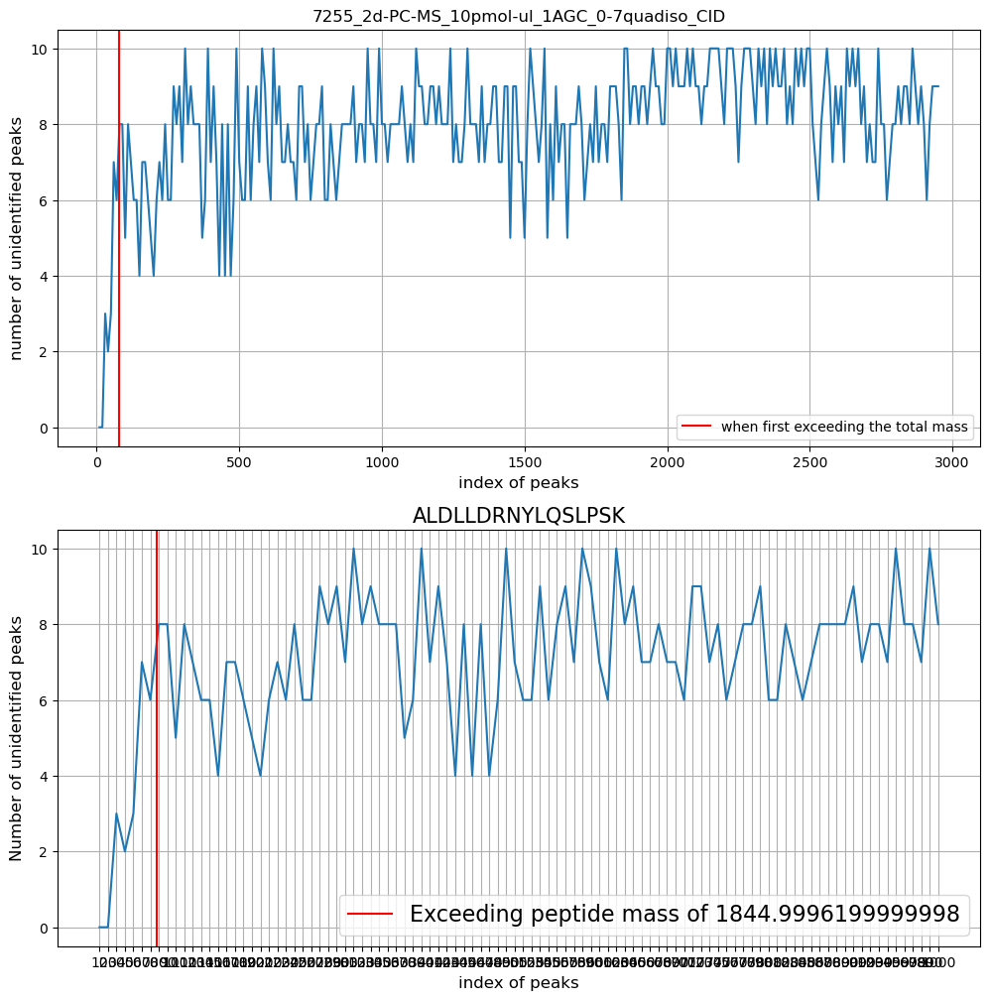

In [225]:
plt.figure(figsize=(12, 12))

plt.subplot(211)
plt.xlabel('index of peaks',size=12)
plt.ylabel('number of unidentified peaks',size=12)

# recall the function defined
# plot x_list against y_list
plt.plot(list_number(len(df), max_number)[0],list_number(len(df),max_number)[1])

# draw the vertical line indicating where the mass is exceeding
plt.axvline(x=list_number(len(df), max_number)[2], c='r',label='when first exceeding the total mass')
plt.grid()
plt.legend()
plt.title(name)
# plot a zoom in version 
zoom_in_fragment = 1000
plt.subplot(212)       
plt.ylabel('Number of unidentified peaks',size=12)
plt.xlabel('index of peaks',size=12)
plt.title(peptide_sequence,fontsize=15)
plt.grid()
plt.plot(list_number(zoom_in_fragment , max_number)[0],list_number(zoom_in_fragment , max_number)[1])
plt.xticks(list_number(zoom_in_fragment , max_number)[0])
plt.axvline(x=list_number(len(df), max_number)[2], c='r',label='Exceeding peptide mass of '+ str(max_number))
plt.legend(loc='best', fontsize=16)

plt.savefig(args.parpath + str(scan_number)+' scans/'+ name +'_histogram' + str(method) + '.jpg')

In [226]:
w_x_100, w_y_100 = list_number(len(df), max_number)[0],list_number(len(df),max_number)[1]
w_local_x_100, w_local_y_100 = list_number(zoom_in_fragment , max_number)[0],list_number(zoom_in_fragment , max_number)[1]
w_line_100 = list_number(len(df), max_number)[2]

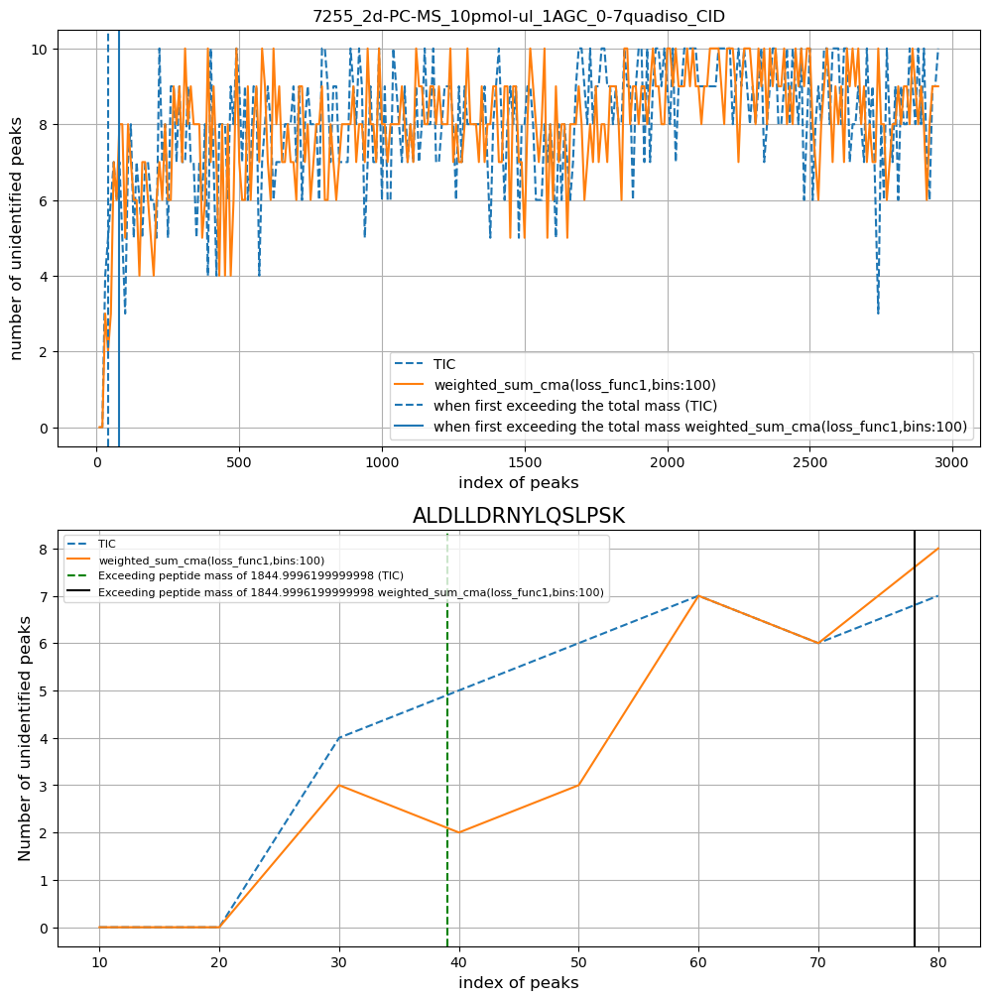

In [230]:
plt.figure(figsize=(12, 12))

plt.subplot(211)
plt.xlabel('index of peaks',size=12)
plt.ylabel('number of unidentified peaks',size=12)

# recall the function defined
# plot x_list against y_list
plt.plot(tic_x, tic_y, label='TIC', linestyle='--')
plt.plot(w_x_100, w_y_100, label='weighted_sum' + str(method))

# draw the vertical line indicating where the mass is exceeding
plt.axvline(x=tic_line,label='when first exceeding the total mass'+ ' (TIC)', linestyle='--')
plt.axvline(x=w_line_100,label='when first exceeding the total mass'+ ' weighted_sum' + str(method))

plt.grid()
plt.legend()
plt.title(name)
# plot a zoom in version 
zoom_in_fragment = 80
plt.subplot(212)       
plt.ylabel('Number of unidentified peaks',size=12)
plt.xlabel('index of peaks',size=12)
plt.title(peptide_sequence,fontsize=15)
plt.grid()
plt.plot(tic_local_x[:zoom_in_fragment//10], tic_local_y[:zoom_in_fragment//10], label='TIC', linestyle='--')
plt.plot(w_local_x_100[:zoom_in_fragment//10], w_local_y_100[:zoom_in_fragment//10], label='weighted_sum' + str(method))

plt.xticks(tic_local_x[:zoom_in_fragment//10])
plt.axvline(x=tic_line, c='g',label='Exceeding peptide mass of '+ str(max_number) + ' (TIC)', linestyle='--')
plt.axvline(x=w_line_100, c='k',label='Exceeding peptide mass of '+ str(max_number) + ' weighted_sum' + str(method))

plt.legend(loc='best', fontsize=8)
plt.savefig(args.parpath + str(scan_number)+' scans/'+ name +'_histogram' + str(method) + '.jpg')

# Scan number plots

Before use this code, needs to use original code to calculate the tic_top feat and correlation scores for different scans from 10000 to 1000. 
In the file 'pC2DMSUtils.py', change row 837 and row 844 to a specific scan number. After row 863: array = array[:scan + 1,:], add another row to cut the array. 

e.g. if we need 3000 scans, add array = array[:3001]; if we need 1000 scans, add array= array[:1001]

The scan number plots allows us to observe how many peaks within a specitic range after a lower scan number are same as that in a same range after 10000 scans.

## Normalised Score plots

In [1]:
import numpy as np
import numba as nb
import time
import matplotlib.pyplot as plt
from numpy import insert
import time
import pandas as pd
import os

In [2]:
# # # datafile_list = ['20200206_1455,20_ME16_3+_NCE15_AGC100_cvScan2000_turbo_1,7V_2uL',
# # #                  '20160503_1127_PH4_3+_CVscan_NCE35_Turbo',
# # #                  '20160603_1040_ME9_3+_CVscan_NCE35_Turbo',
# # #                  '20160622_1514_ME14_3+_1to2500_CVscan_NCE35'
####                    '7255_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso',
# # #                 ]

# datafile_list = ['7302_2D-PC-MS_2pmol-ul_1AGC_0-7quadiso',
#                  '7302_2D-PC-MS_1pmol-ul_1AGC_0-7quadiso',
#                  '7302_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso',
#                  '7302_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso',
#                  '7255_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso',
#                  '7255_2D-PC-MS_1pmol-ul_0-1AGC_0-7quadiso']

datafile_dict = {}

for dirname in os.listdir('../IC/IC/raw data/'):
    datafile_dict[dirname] = []
    for filename in os.listdir('../IC/IC/raw data/' + str(dirname)):
        datafile_dict[dirname].append(os.path.splitext(filename)[0])
        # 6727_2d-PC-MS_1pmol-ul_1AGC_0-7quadiso_HCD']

In [3]:
print(datafile_dict.keys())

dict_keys(['CID', '.ipynb_checkpoints', 'HCD'])


In [2]:
tolerance = 0.8  # for linear ion trap

In [3]:
name = '20160511_2003_ME17_2+_CVscan_Turbo' # list(datafile_dict.values())[2][1]

In [4]:
import argparse
import sys
import os
import re

parser = argparse.ArgumentParser()
parser.add_argument('--parpath', nargs='?', type=str, default='./peptide output/Test/' + str(name) + '/', help='parent path of folders for different scan numbers')
parser.add_argument('--name', nargs='?', type=str, default=str(name), help='file name')
parser.add_argument('--numscan_list', nargs='?', type=list, default=[], help='file name')
parser.add_argument('--m', nargs='?', type=str, default='tic', help='tic or w or cov')
parser.add_argument('--epoch', nargs='?', type=int, default=None, help='epoch number')

# Check if the script is run in IPython/Jupyter Notebook
if 'ipykernel' in sys.argv[0]:
    # Remove the last two elements (they are specific to IPython/Jupyter)
    sys.argv = sys.argv[:-2]

args = parser.parse_args()
print(args.name)
numscan_list = [1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000]

if numscan_list == []:
    for dir_name in os.listdir(args.parpath):
        if len(dir_name.split(' ')) == 2:
            numscan_list.append(int(dir_name.split(' ')[0]))
    numscan_list.sort()

20160511_2003_ME17_2+_CVscan_Turbo


In [5]:
import os
import matplotlib.pyplot as plt
from pC2DMSUtils import maxIndices#, varII, covXI, cutAC, scaleToPower
import pC2DMS
import pC2DMSUtils
import time
from pathlib import Path

def txt2cache(textFile, path, numscanInterval=None):
    saveName=path+'/save'
    numScans='all'

    print('path:', path)
    print(numScans, 'scans')
    print('save in', saveName)

    start = time.time()
    pC2DMSUtils.readTextFile(textFile, path, numscanInterval=numscanInterval)
    readTime = time.time()


def preprocess(prefix, data_path='../IC/raw data/Test/', cache_path='./peptide output/Test/', numscanInterval=None):
    data_filename = data_path + prefix + '.txt'
    cache_dir = cache_path + prefix + '/10000 scans'
    if not os.path.exists(cache_dir):
        os.makedirs(cache_dir)
    #     if Path(cache_dir).is_dir():
    #         print('Cache directory exists. Preprocessing skipped.')
    #     else:
    txt2cache(data_filename, cache_dir, numscanInterval=numscanInterval)
    return cache_dir

In [6]:
path = args.parpath + str(numscan_list[-1])+' scans/'

In [7]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [10]:
cache_dir = preprocess(name, data_path='../IC/IC/raw data/HCD/', cache_path='./peptide output/HCD/', numscanInterval=1000)

path: ./peptide output/HCD/7732_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso/10000 scans
all scans
save in ./peptide output/HCD/7732_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso/10000 scans/save
Reading file ../IC/IC/raw data/HCD/7732_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso.txt to ./peptide output/HCD/7732_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso/10000 scans
Reading scan number 100
Reading scan number 200
Reading scan number 300
Reading scan number 400
Reading scan number 500
Reading scan number 600
Reading scan number 700
Reading scan number 800



KeyboardInterrupt



In [8]:
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [9]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [10]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [11]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

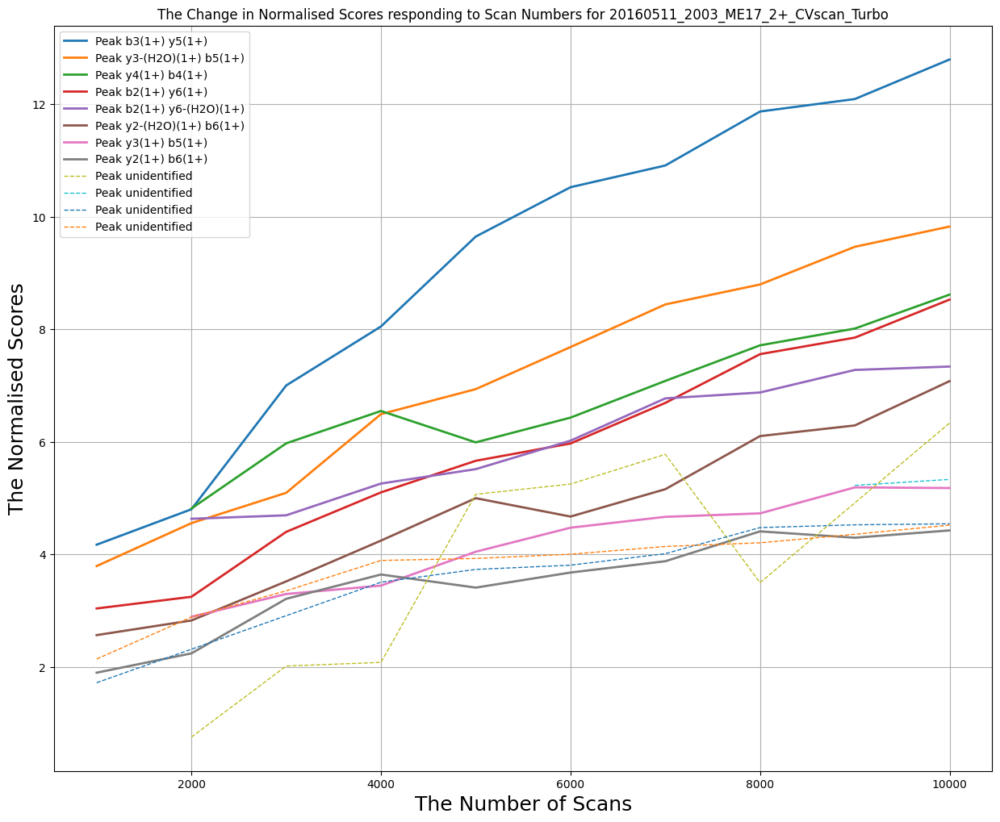

In [14]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(8):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(4):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+'.jpg')

In [16]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [17]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

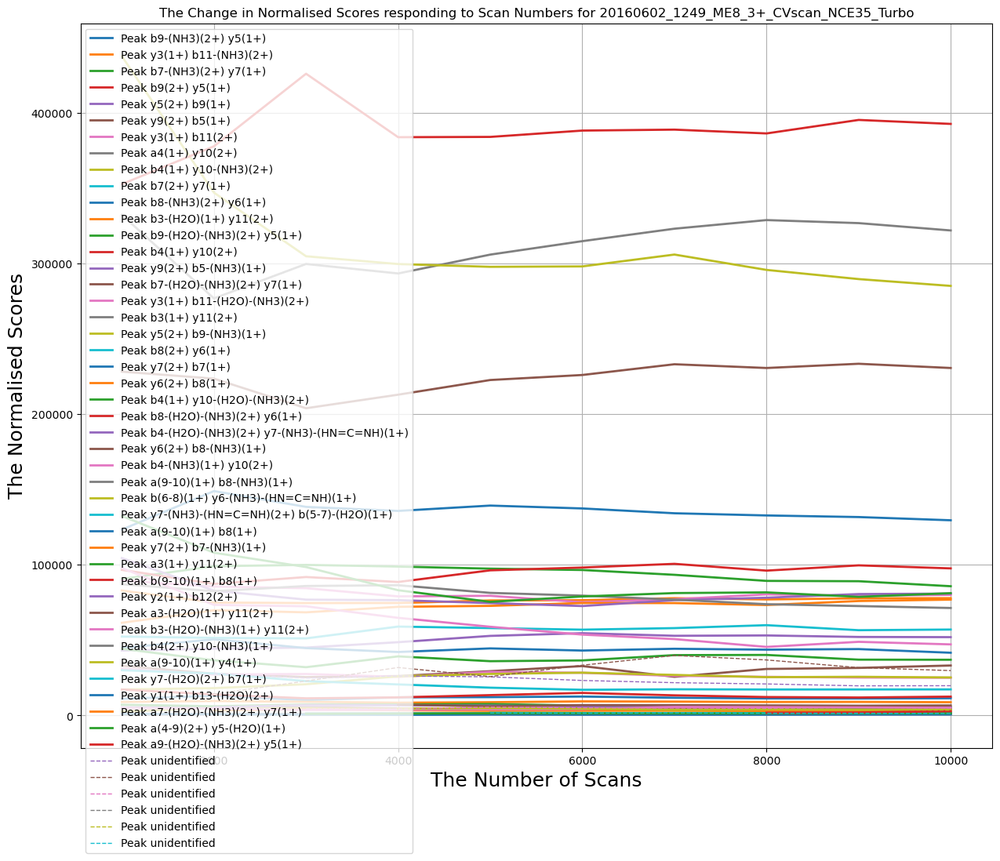

In [18]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+'.jpg')

In [11]:
weights_tpe_loss_func1 = np.array([1.77742493, 0.26736808, 1.79356456, 0.60505574, 0.68142098, 0.55045802
, 0.41505678, 0.23192339, 0.74895327, 1.05238373, 0.46418789, 0.92438629
, 1.76361323, 1.11775136, 1.21711266, 1.95209787, 0.04707956, 0.78448469
, 0.17315706, 1.0403938, 0.32855712, 1.61574099, 0.19461299, 0.5621586
, 0.5571355, 1.09908919, 0.70036215, 1.75407656, 1.01922498, 0.46050934
, 0.25243517, 0.33699795, 0.48094845, 1.39329184, 0.57847116, 1.91095005
, 1.09944832, 0.97740241, 1.67971844])

In [12]:
weights_tpe_loss_func2 = np.array([1.10342122, 1.74157288, 0.95289493, 0.8134206, 0.64139062, 0.56111331
, 0.86290635, 0.32493003, 0.17430608, 0.2823324, 0.14877877, 1.03187679
, 1.30729305, 1.52126059, 1.19581792, 1.36287387, 1.11043203, 1.2143669
, 1.45443463, 0.69125176, 0.82259259, 1.68136914, 1.17540044, 1.35825569
, 1.03686637, 1.31171829, 1.92378558, 1.31088039, 1.40793891, 0.11603733
, 1.85584202, 1.40675701, 1.32256018, 0.66425642, 1.09700642, 1.47240462
, 1.37059904, 0.35769377, 1.2734134])

In [13]:
import dill
weights = np.load('weights_tpe.npy')
with open('optimizer_tpe_loss_func3.dill', "rb") as file:
    optimizer = dill.load(file)
weights_tpe_loss_func3 = np.array([optimizer.best_params[f'w_{i}'] for i in range(len(weights))])

In [14]:
weights_tpe_loss_func4 = np.array([1.10852360e+00, 1.03970814e+00, 4.36300691e-01, 1.31365090e+00
, 4.55692794e-01, 8.46024175e-01, 1.11253384e+00, 1.80067251e+00
, 1.21228033e+00, 2.34350823e-01, 1.57904318e-03, 7.55099172e-01
, 3.18901463e-01, 9.36451730e-01, 1.34660578e+00, 1.13076963e+00
, 1.12982963e+00, 1.45391947e+00, 1.00338455e+00, 1.86823253e+00
, 1.17855160e+00, 1.57184266e+00, 1.30403196e+00, 9.19918662e-01
, 2.79588481e-01, 2.75350232e-01, 1.10435645e+00, 1.10348111e+00
, 1.12390881e+00, 7.22830155e-01, 1.36734980e+00, 1.91305993e+00
, 1.95821784e+00, 4.40292674e-01, 1.01821398e+00, 2.66211971e-01
, 1.69587907e+00, 1.02986897e+00, 1.45997074e+00])

In [15]:
weights_tpe_loss_func5 = np.array([1.78643503, 1.97387545, 0.0027472, 0.46062098, 0.22549437, 0.11800101
, 0.41769073, 1.44530662, 0.09006972, 1.7663439, 0.30848602, 1.63996923
, 1.20210581, 0.73912003, 1.92104281, 0.35867612, 0.18520138, 1.55290516
, 0.97055754, 0.67422005, 1.13377179, 1.53499875, 0.58469242, 0.42898833
, 0.82192562, 1.92543258, 0.46590693, 1.88193987, 1.24368601, 0.77147638
, 1.44005645, 1.99877199, 0.63879869, 1.42557613, 1.50939376, 1.30646755
, 1.87145148, 0.43392816, 1.0519267])

In [16]:
import dill
weights = np.load('weights_tpe.npy')
with open('optimizer_tpe_loss_func6.dill', "rb") as file:
    optimizer = dill.load(file)
weights_tpe_loss_func6 = np.array([optimizer.best_params[f'w_{i}'] for i in range(len(weights))])

In [17]:
weights_tpe_loss_func7 = np.array([1.71042941, 1.18545085, 0.1827421, 1.67872559, 0.64012184, 1.40807761
, 1.5289048, 0.57543409, 0.25069895, 1.14613521, 1.53194626, 1.13818212
, 1.96563661, 1.49753189, 0.68189568, 1.48926443, 0.32658166, 1.64403286
, 1.60971704, 0.78599101, 0.91606975, 1.46645888, 0.32496261, 1.70146248
, 0.38903718, 0.64998074, 0.70178567, 1.69566121, 1.90589651, 0.7270056
, 0.36394164, 1.37541046, 1.00017358, 0.55479913, 0.47575668, 1.32682428
, 0.33163603, 1.2922196, 0.4422693])

In [18]:
import dill
weights = np.load('weights_tpe.npy')
with open('optimizer_tpe_loss_func8.dill', "rb") as file:
    optimizer = dill.load(file)
weights_tpe_loss_func8 = np.array([optimizer.best_params[f'w_{i}'] for i in range(len(weights))])

In [19]:
import dill
weights = np.load('weights_tpe.npy')
with open('optimizer_tpe_loss_func9.dill', "rb") as file:
    optimizer = dill.load(file)
weights_tpe_loss_func9 = np.array([optimizer.best_params[f'w_{i}'] for i in range(len(weights))])

In [20]:
weights_bayopt_loss_func1 = [0, 0, 0, 2, 2, 0, 2, 2, 2, 0, 0, 2, 2, 0, 2, 2, 2, 2, 0, 0, 2, 2, 2, 2,
 0, 2, 2, 0, 0, 0, 0, 2, 0, 2, 2, 2, 2, 0, 2]
weights = np.array(weights)
weights[weights==0] = 0.00001

In [21]:
weights_bayopt_loss_func2 = np.array([2, 0, 2, 0, 0, 2, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2,
 0, 2, 2, 0, 0, 2, 0, 2, 2, 0, 2, 2, 0, 2, 2])
weights[weights==0] = 0.00001

In [22]:
weights_bayopt_loss_func3 = np.array([0.74908024, 1.90142861, 1.66488528, 0.73272369, 1.89777107, 1.93126407
, 1.6167947, 0.60922754, 0.19534423, 1.36846605, 1.46398788, 1.19731697
, 0.31203728, 0.31198904, 0.11616722, 1.73235229, 1.20223002, 1.41614516
, 0.04116899, 1.9398197, 0.42467822, 0.36364993, 0.36680902, 0.60848449
, 1.04951286, 0.86389004, 0.58245828, 1.22370579, 0.27898772, 0.5842893
, 0.91213997, 1.57035192, 0.39934756, 1.02846888, 1.18482914, 0.09290083
, 1.2150897, 0.34104825, 0.13010319])
weights[weights==0] = 0.00001

In [23]:
weights_bayopt_loss_func4 = np.array([0, 0, 2, 0, 2, 2, 2, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 2, 2, 2, 2, 2, 0, 2,
 0, 2, 2, 0, 2, 2, 0, 0, 0, 0, 0, 2, 0, 0, 2])
weights[weights==0] = 0.00001

In [24]:
weights_bayopt_loss_func5 = np.load('weights_bayopt.npy')
with open('optimizer_bayopt_loss_func5.dill', "rb") as file:
    optimizer = dill.load(file)
weights_bayopt_loss_func5 = np.array([optimizer.max['params'][f'w_{i}'] for i in range(len(weights_bayopt_loss_func5))])
weights[weights==0] = 0.00001

In [25]:
weights_bayopt_loss_func6 = np.array([0, 0, 0, 0, 2, 2, 2, 0, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0, 2, 0, 2, 2, 2, 2,
 0, 0, 2, 2, 2, 2, 0, 2, 2, 0, 0, 0, 2, 2, 0])
weights[weights==0] = 0.00001

In [26]:
weights_bayopt_loss_func7 = np.load('weights_bayopt.npy')
with open('optimizer_bayopt_loss_func7.dill', "rb") as file:
    optimizer = dill.load(file)
weights_bayopt_loss_func7 = np.array([optimizer.max['params'][f'w_{i}'] for i in range(len(weights_bayopt_loss_func7))])
weights[weights==0] = 0.00001

In [27]:
weights_bayopt_loss_func8 = np.load('weights_bayopt.npy')
with open('optimizer_bayopt_loss_func8.dill', "rb") as file:
    optimizer = dill.load(file)
weights_bayopt_loss_func8 = np.array([optimizer.max['params'][f'w_{i}'] for i in range(len(weights_bayopt_loss_func8))])
weights[weights==0] = 0.00001

In [28]:
weights_bayopt_loss_func9 = np.load('weights_bayopt.npy')
with open('optimizer_bayopt_loss_func9.dill', "rb") as file:
    optimizer = dill.load(file)
weights_bayopt_loss_func9 = np.array([optimizer.max['params'][f'w_{i}'] for i in range(len(weights_bayopt_loss_func9))])

In [29]:
weights_cma_loss_func1 = np.array([0.87198428, 0.68777021, 1.01795217, 0.7716168, 1.0648289, 0.86397994
, 0.75136499, 1.11068005, 1.26627141, 1.66521011, 0.99750603, 0.89477338
, 1.22469546, 0.71488525, 1.44985682, 1.12219983, 1.22642495, 0.86819807
, 0.95986557, 1.23142302, 0.81214284, 0.67746308, 1.00690961, 0.95587001
, 1.4200546, 0.65757342, 0.78818154, 0.89232315, 0.81914443, 0.76466677
, 0.7983191, 0.82793738, 0.85807479, 0.8224566, 0.78738265, 1.47025078
, 1.19951112, 1.2040894, 0.94259879, 0.80715694, 1.11184515, 0.63483471
, 1.13313472, 1.05243056, 0.87514524, 1.67005402, 0.862337, 0.67911068
, 1.05266955, 0.7748282, 1.25342226, 1.26187574, 0.90096771, 0.88453938
, 1.11914874, 1.08272728, 1.0683505, 0.83556591, 0.76477427, 0.91128541
, 1.26674233, 0.92334216, 0.78757248, 1.19857263, 0.84077996, 0.86083711
, 1.03330723, 0.98194791, 1.21986751, 1.63670788, 1.02694419, 0.70286656
, 0.90663071, 1.33366441, 1.11390551, 0.86586875, 1.58646817, 1.04841778
, 1.12230492, 0.79567624, 1.18097354, 1.07825851, 1.12660943, 1.04212653
, 0.91695336, 1.25433897, 0.94266378, 1.11215407, 0.72935826, 0.76088341
, 0.931085, 1.05899334, 1.8259861, 0.91874732, 0.61429458, 1.03770328
, 0.82013083, 1.09337602, 1.01910799, 0.6806872, 1.18878701, 0.86793008
, 1.18087911, 0.87001041, 0.73416922, 0.8967718, 0.94117019, 1.14080505
, 0.78194158, 0.63973257, 1.27371626, 1.04440407, 1.00156664, 0.84381549
, 0.71709606, 0.99613254, 1.24006755, 0.73606457, 1.33987664, 0.99302416
, 0.96541988, 1.28297668, 0.75528914, 1.26241501, 0.89946114, 1.06764348
, 0.643176, 0.58360713, 1.02761103, 1.07593344, 1.12800901, 1.04378883])

In [30]:
with open('optimizer_cma.dill', "rb") as file:
    optimizer = dill.load(file)
weights_cma_loss_func2 = optimizer.result.xbest

In [31]:
weights_cma_loss_func3 = np.array([0.004339374, 0.50798032, 1.64351229, 0.67775987, 0.01657082, 0.75269187
, 1.18337271, 0.93812863, 0.48505375, 0.21487606, 1.09743312, 0.71238726
, 1.55784343, 1.51592355, 0.35794554, 0.12552721, 0.85348355, 0.83238549
, 1.2352135, 1.30421881, 1.18605693, 0.40048151, 1.35825518, 0.31463801
, 1.06113056, 1.40472375, 0.53190937, 1.1505039, 1.05797006, 0.85244303
, 1.00309384, 0.51703579, 0.46421245, 0.90394702, 0.92111887, 1.03359514
, 1.24296482, 0.89522082, 1.1051857])

In [32]:
weights_cma_loss_func4 = np.array([0.74160025, 1.17554347, 1.22119417, 1.36680097, 1.08999095, 1.22091697
, 0.99335227, 0.97095117, 0.95386964, 0.76903355, 0.82569467, 0.89859331
, 1.1068456, 0.74264423, 0.79489182, 0.7577499, 0.97953646, 1.08452884
, 0.9237643, 0.91474233, 1.03872657, 1.01189228, 1.12106478, 0.66953374
, 1.36448624, 1.35191527, 0.95438715, 1.05684252, 0.90583876, 0.84336418
, 1.19558659, 1.18986215, 1.16811959, 0.85614931, 0.79294955, 1.28305282
, 0.9318661, 0.89405129, 0.80366216, 1.65484042, 0.87095745, 0.95280496
, 0.84949559, 0.95754092, 0.84557664, 0.98703843, 0.7958573, 1.13044703
, 2.17460658, 1.0500949, 0.71339967, 0.82321625, 0.9881275, 0.88146648
, 1.27887592, 0.78665736, 0.84669591, 1.18625178, 1.07888715, 0.69218346
, 0.80818622, 0.83819566, 0.73283246, 1.01583718, 1.50590281, 0.81426785
, 1.06637176, 0.86762882, 1.11352546, 0.95965498, 0.6892157, 0.79029643
, 1.03726876, 1.0607466, 0.90106773, 0.86688621, 0.90564701, 0.57473586
, 0.89276744, 0.8087, 0.58280645, 1.142229, 0.76628774, 0.88648582
, 0.99050494, 1.07598116, 0.96590563, 0.88465524, 1.00834114, 0.965941
, 0.6895089, 0.65006118, 1.02729331, 1.10461439, 0.55728501, 1.43483551
, 0.96925734, 0.9050727, 1.96655056, 0.94289558, 1.74285389, 0.68880273
, 0.90954084, 1.0566941, 1.11382684, 0.95825931, 1.12884838, 1.04043493
, 0.89725065, 1.00061915, 0.97365071, 1.22249004, 0.95852889, 0.89027841
, 1.07254553, 0.79384854, 1.10607781, 0.82076046, 0.83609501, 1.08345376
, 0.99252562, 1.03735257, 0.95148837, 0.88197611, 1.22194952, 1.1413378
, 0.8436952, 0.78352289, 0.97301558, 1.14048605, 1.09396806, 1.23491957])

In [33]:
weights_cma_loss_func5 = np.array([1.08235567, 1.7007001, 1.05053146, 1.16354133, 1.30436994, 1.07645093
, 0.80010504, 1.09421643, 1.06022697, 0.82340853, 1.81133325, 1.14547391
, 1.0049252, 0.91681941, 0.89225435, 0.96671632, 1.02047833, 0.91757289
, 1.08973375, 1.05664467, 1.09783187, 0.96355423, 2.32690759, 1.4882286
, 0.96345538, 1.04970041, 1.09236265, 1.03736084, 0.97311343, 0.99393913
, 1.02151578, 0.93341757, 0.99545414, 0.83251272, 0.89583761, 0.77637604
, 1.1233468, 0.82890623, 1.25410255, 0.84304488, 0.99194065, 1.03942671
, 0.89108309, 0.82101376, 0.57329883, 1.0843907, 0.96806558, 0.87374371
, 1.29038253, 0.95364384, 1.10987627, 0.91054148, 1.24937314, 0.72461002
, 0.81547781, 0.97595227, 0.854496, 1.03444771, 0.50597388, 1.03159309
, 1.04876783, 0.76429177, 0.98085502, 0.98772101, 1.19672411, 1.14932615
, 0.87221842, 0.9233438, 0.76339762, 0.84766567, 1.28559589, 0.99816565
, 0.92191606, 0.73648269, 0.84278932, 1.00830411, 0.9518849, 1.48940499
, 1.06219263, 0.94964687, 1.07903255, 0.8280714, 0.83849081, 0.88248163
, 0.81160419, 0.7677264, 0.86683654, 0.94689235, 0.87128427, 0.95178724
, 0.72460782, 0.93046847, 1.04029918, 0.92164921, 1.1873731, 1.11720498
, 1.09960697, 0.78078611, 0.92541968, 1.0127571, 0.95566998, 1.04265114
, 1.05512495, 1.00859152, 0.94805481, 1.37459694, 0.77233114, 0.86802872
, 1.07618159, 0.78286888, 0.90959356, 0.88371823, 0.98646182, 0.79151607
, 0.85532818, 0.87843792, 1.3573276, 1.1252403, 0.96219915, 1.00192645
, 0.94455152, 0.84614176, 1.05458519, 1.06315087, 1.25273037, 1.08543605
, 0.78252144, 0.77009164, 1.26329327, 0.9312291, 0.89136721, 1.45785433])

In [34]:
weights_cma_loss_func8 = np.array([1.15028883, 1.535553, 0.85256782, 1.25351425, 1.02903865, 1.10694954
, 0.66923489, 0.87466962, 0.76702507, 0.8296625, 1.59083789, 1.248532
, 0.95499102, 0.79348045, 1.03866525, 0.80876763, 0.97350157, 0.90872348
, 0.7997895, 1.09650606, 0.97262042, 1.08566564, 2.31788054, 1.20964984
, 0.88696283, 1.31102135, 0.96760832, 0.92989938, 0.75304444, 0.95614913
, 1.04764683, 0.95753273, 0.77273448, 0.88057494, 0.80606506, 1.01155385
, 0.94110419, 1.08002664, 1.2365259, 1.03257567, 0.88759867, 1.15200057
, 0.86322405, 0.87362921, 0.94795558, 0.98188941, 0.83553332, 0.79097092
, 1.07993065, 0.83387555, 0.7684245, 0.97577185, 1.27390716, 0.8976222
, 0.97742047, 0.71714888, 0.80487093, 1.21663078, 0.81811692, 1.311687
, 1.44274428, 0.6991004, 1.05063163, 0.82554934, 1.28499411, 0.9899731
, 0.92085101, 0.72096197, 0.69715104, 1.10196927, 1.24131502, 0.86700289
, 0.99368419, 0.76170781, 1.18824012, 0.89862287, 0.92484909, 1.65078859
, 0.92683258, 0.83931465, 1.00194186, 0.91440551, 0.85521695, 0.80448684
, 0.68757128, 0.74878047, 1.18095997, 1.02405593, 0.81441838, 0.9076404
, 1.01768724, 0.81405036, 0.88253721, 0.8853631, 1.3017709, 0.87891097
, 1.09882679, 0.76394074, 0.84849694, 1.28047215, 0.91572554, 0.98370889
, 1.14786307, 0.77618521, 0.95021292, 1.43098624, 0.91205883, 0.95004185
, 0.98638815, 0.75386612, 0.76772536, 0.92522359, 0.78133361, 0.60506717
, 0.86385797, 1.03060025, 1.17081388, 1.2693255, 0.96914056, 0.94286078
, 0.99600347, 1.06759092, 1.07990474, 0.80968994, 0.96427811, 1.020386
, 0.98965324, 1.07645702, 1.28051938, 0.89914826, 1.43505179, 1.43396541])

In [35]:
import dill

In [36]:
if 1:
    # # # datafile_list = ['20200206_1455,20_ME16_3+_NCE15_AGC100_cvScan2000_turbo_1,7V_2uL',
    # # #                  '20160503_1127_PH4_3+_CVscan_NCE35_Turbo',
    # # #                  '20160603_1040_ME9_3+_CVscan_NCE35_Turbo',
    # # #                  '20160622_1514_ME14_3+_1to2500_CVscan_NCE35'
    ####                    '7255_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso',
    # # #                 ]

    # datafile_list = ['7302_2D-PC-MS_2pmol-ul_1AGC_0-7quadiso',
    #                  '7302_2D-PC-MS_1pmol-ul_1AGC_0-7quadiso',
    #                  '7302_2D-PC-MS_0-5pmol-ul_0-1AGC_0-7quadiso',
    #                  '7302_2D-PC-MS_0-1pmol-ul_0-1AGC_0-7quadiso',
    #                  '7255_2D-PC-MS_5pmol-ul_1AGC_0-7quadiso',
    #                  '7255_2D-PC-MS_1pmol-ul_0-1AGC_0-7quadiso']

    datafile_dict = {}

    for dirname in os.listdir('../IC/IC/raw data/'):
        datafile_dict[dirname] = []
        for filename in os.listdir('../IC/IC/raw data/' + str(dirname)):
            datafile_dict[dirname].append(os.path.splitext(filename)[0])
        # 6727_2d-PC-MS_1pmol-ul_1AGC_0-7quadiso_HCD'

In [37]:
if 1:
    print(datafile_dict.keys())

dict_keys(['CID', '.ipynb_checkpoints', 'HCD'])


In [15]:
name1 = '7255_2d-PC-MS_10pmol-ul_1AGC_0-7quadiso_CID'
weights_tpe_loss_func2 = np.load(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'weights_tpe.npy')
with open(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'optimizer_tpe.dill', "rb") as file:
    optimizer = dill.load(file)
weights_tpe_loss_func2 = np.array([optimizer.best_params[f'w_{i}'] for i in range(len(weights_tpe_loss_func2))])

In [16]:
weights_tpe_loss_func1 = np.load(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'weights_tpe.npy')
with open(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'optimizer_tpe_loss_func_1.dill', "rb") as file:
    optimizer = dill.load(file)
weights_tpe_loss_func1 = np.array([optimizer.best_params[f'w_{i}'] for i in range(len(weights_tpe_loss_func1))])

In [17]:
weights_tpe_loss_func3 = np.load(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'weights_tpe.npy')
with open(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'optimizer_tpe_loss_func3.dill', "rb") as file:
    optimizer = dill.load(file)
weights_tpe_loss_func3 = np.array([optimizer.best_params[f'w_{i}'] for i in range(len(weights_tpe_loss_func3))])

In [18]:
weights_tpe_loss_func4 = np.load(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'weights_tpe.npy')
with open(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'optimizer_tpe_loss_func_4.dill', "rb") as file:
    optimizer = dill.load(file)
weights_tpe_loss_func4 = np.array([optimizer.best_params[f'w_{i}'] for i in range(len(weights_tpe_loss_func4))])

In [19]:
with open(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'optimizer_cma.dill', "rb") as file:
    optimizer = dill.load(file)
weights_cma_loss_func2 = optimizer.result.xbest

In [20]:
with open(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'optimizer_cma_loss_func1.dill', "rb") as file:
    optimizer = dill.load(file)
weights_cma_loss_func1 = optimizer.result.xbest

In [21]:
with open(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'optimizer_cma_loss_func3.dill', "rb") as file:
    optimizer = dill.load(file)
weights_cma_loss_func3 = optimizer.result.xbest

In [22]:
with open(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'optimizer_cma_loss_func4.dill', "rb") as file:
    optimizer = dill.load(file)
weights_cma_loss_func4 = optimizer.result.xbest

In [23]:
weights_bayopt_loss_func3 = np.load(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'weights_tpe.npy')
with open(os.path.join('./peptide output', 'Test' + '/' + str(name1) + '/') + str(10000)+ ' scans/' + 'optimizer_bayopt_loss_func3.dill', "rb") as file:
    optimizer = dill.load(file)
weights_bayopt_loss_func3 = np.array([optimizer.max['params'][f'w_{i}'] for i in range(len(weights_bayopt_loss_func3))])

In [ ]:
# HCD
weights_bayopt_loss_func6 = np.array([0.87112317, 0.89733748, 0.87650687, 1.37008348, 1.00559736, 0.89518398
, 0.87431395, 0.92198159, 1.05669802, 0.88811804, 0.93067809, 1.00675055
, 0.89790278, 1.96872794, 1.07794574, 1.03203038, 1.19991984, 1.13307793
, 0.88553637, 0.98477295, 0.89439146, 1.01157381, 0.98667223, 0.90934007
, 0.90422977, 1.13357135, 0.91216772, 0.9030477, 0.94171632, 1.41919452
, 0.89343589, 0.93308722, 1.12897788, 0.88452734, 0.93631889, 0.88820539
, 0.93779413, 0.91141823, 0.90203759, 0.9188024, 1.00030971, 1.07878907
, 0.87720632, 0.86489661, 0.91309217, 0.92476472, 0.97520075, 0.93174878
, 1.01740691, 1.19801854, 0.93166358, 1.25492543, 0.89042348, 0.91018291
, 1.17369309, 0.89830447, 0.9385538, 1.79481777, 0.91281987, 1.02952281
, 0.88688666, 0.97494476, 0.92940053, 0.92607988, 0.90386354, 0.86600078
, 0.86361726, 0.96569293, 0.92296873, 0.95336977, 0.88141738, 1.03143397
, 1.49948918, 1.13217642, 1.02180597, 0.90605468, 1.0950361, 1.00045405
, 1.04608305, 1.12469081, 0.94330474, 0.90122372, 1.0114607, 0.9543782
, 0.85925077, 1.08690669, 0.92965927, 1.2477167, 1.05671335, 0.8646265
, 1.01293254, 1.03067527, 1.0029602, 0.92255526, 0.88069653, 0.86912046
, 1.02500288, 0.89600699, 0.92544444, 0.98810584, 1.08500956, 1.29967336
, 1.00788255, 0.9020797, 0.8855902, 0.8575242, 0.90985514, 1.47643467
, 0.90062355, 1.10746507, 0.9298618, 0.87686963, 0.93049427, 0.88038554
, 1.04302369, 0.9278523, 1.36229459, 0.94538397, 0.869842, 0.88468603
, 1.46212181, 0.92082385, 0.97989005, 1.09239739, 1.11112693, 1.01565976
, 1.11038642, 0.8779026, 0.93986427, 1.04915634, 1.10111486, 0.95976109
, 0.87570212, 0.95334769, 0.88224087, 0.91409498, 0.93405143, 0.88092608
, 0.8752549])

In [ ]:
# HCD
weights_cma_loss_func7 = np.array([0.95662107, 0.99732295, 1.19682783, 0.94898082, 0.83731815, 0.82608289
, 1.9585741, 1.49865483, 0.9043632, 0.87636835, 1.36282057, 0.97964689
, 0.98440473, 0.76551217, 1.07386624, 0.89792854, 0.80501578, 1.07769491
, 0.93086671, 0.87434802, 0.99934345, 0.90642341, 1.16938247, 0.92913929
, 0.96583856, 1.07337673, 0.92130946, 1.02985348, 0.93572316, 0.97847215
, 0.6905362, 0.70769846, 0.85705859, 1.15079199, 1.04326385, 1.07416373
, 1.07149753, 1.0309159, 0.94736692, 1.00188537, 1.01953208, 0.94855573
, 0.72266263, 0.91820304, 1.04616662, 1.14968509, 0.90061208, 1.36206406
, 0.96827516, 1.08662254, 0.95195649, 0.97893272, 0.70078006, 1.05338126
, 0.97441398, 1.02829711, 0.9786826, 1.06183147, 1.14114007, 1.18040841
, 0.96807105, 0.94309936, 0.91534311, 0.92446689, 0.90382715, 0.77247425
, 0.94876862, 0.71105444, 1.11786291, 0.84034318, 1.04436563, 0.88813056
, 1.03338394, 1.26760402, 1.00615539, 0.95519698, 0.95842218, 1.06005922
, 0.71911983, 0.85479904, 0.86581372, 0.85600357, 1.26349291, 1.03600783
, 1.22364751, 0.79562667, 1.00606869, 0.78480315, 1.08764766, 1.00469334
, 0.94404054, 0.93178021, 1.22217724, 0.92495818, 1.17719688, 0.89737462
, 0.88988962, 1.20459903, 0.82094538, 1.05405064, 1.00264621, 0.96345775
, 1.10819636, 0.88325503, 1.0701273, 1.26152698, 1.10886677, 0.95220228
, 1.23958526, 1.76144479, 0.97752338, 1.05462496, 0.76252272, 0.79800157
, 1.00589699, 1.16528327, 1.57727951, 0.99166692, 0.88362777, 0.84872993
, 0.91983444, 0.85473096, 0.99005818, 1.11298821, 0.91822888, 1.09691587
, 1.08332267, 1.07749571, 0.70585489, 0.95545143, 1.01232548, 1.13384808
, 0.92553082, 1.01305235, 0.91259423, 1.00183038, 1.01201818, 0.79533434
, 1.09257626, 1.20582638, 0.95792566, 1.03284596, 0.96368829, 1.14649568
, 0.89412812, 1.10386574, 1.1788118, 0.68236232, 1.0434466, 1.018339
, 1.04378699, 1.2282047, 0.92810438, 0.98959542, 0.91640014, 0.94664761
, 0.88533122, 0.86786105, 1.83260171, 0.79743337, 0.85307385, 1.02625019
, 1.01090496, 0.89464695, 0.90231648, 1.01776568, 0.96992849, 0.90538594
, 0.86214975, 0.76580655, 1.11718874, 0.8769794, 1.08377213, 0.77219273
, 1.01783185, 0.88877631, 1.02674894, 0.89432013, 1.06899752, 0.88866339
, 1.0266468, 0.99733639, 1.25392064, 0.89182847, 0.95610225, 1.23759185
, 0.96599565, 0.96854844, 1.82283926, 0.89297817, 0.94381655, 0.9464253
, 0.86450913, 0.83031639, 1.19227924, 1.13375072, 1.09375495, 0.89685483
, 0.9007996, 0.86165366, 0.97188556, 0.98049589, 1.0703374, 1.08790018
, 0.89737231, 1.08302388, 0.91787596, 1.19074643, 1.05154045, 1.01072284
, 1.14009667, 0.8829923, 1.08620253, 1.07129211, 0.92551755, 1.02087424
, 1.14852339, 1.35779061, 1.2047962, 1.25398486, 0.83192776, 1.0743272
, 0.8154711, 1.13120388, 0.75661537, 1.02889801, 0.94537296, 1.164703
, 0.97547937, 1.55039974, 1.18303792, 0.99008081, 0.81725494, 0.90125115
, 0.98416121, 0.90946093, 0.92259666, 1.08902505, 1.09249353, 0.99641961
, 1.18990516, 0.86112228, 0.93527467, 0.81080199, 0.90828371, 0.88189996
, 0.98548683, 1.15503979, 1.01792103, 0.85479224, 0.85272261, 0.82502066
, 0.91424029, 0.93416758, 1.03909135, 0.95058727, 0.96078247, 1.06696422
, 0.89275323, 1.15642, 1.09737721, 0.78178208, 1.02939532, 1.02781244
, 0.88237949, 1.10937332, 1.1434825, 1.13004013, 0.87148852, 0.91732683
, 0.94859984, 0.88445863, 1.0560748, 1.06053814, 1.19404662, 0.87500315
, 0.8924485, 1.02034381, 1.08713227, 0.92870149, 0.81989104, 1.08794493
, 0.86042424, 1.14055827, 0.92784602, 1.01950274, 1.83895054, 1.35476196
, 0.78972402, 1.30276131, 1.03720625, 0.98365263, 1.02231335, 1.16884673
, 0.86001958, 0.89608725, 1.08271346, 0.95891934, 0.97185063, 0.95938658
, 0.86545232, 1.01044437, 0.81432086, 0.75647972, 0.97613786, 0.97785952
, 0.88665867, 0.89830763, 1.07320661, 1.12229534, 1.3692997, 0.85270321
, 0.82046281, 0.84822178, 0.96265851, 0.86976606, 0.88538121, 0.7979928
, 0.95739118, 0.89276319, 1.15658059, 1.10264304, 0.76798407, 0.86859452
, 1.03073585, 1.01847613, 0.80535423, 0.90119648, 1.05950013, 1.07225897
, 1.15283471, 0.99947776, 1.13382927, 1.01061399, 0.7668474, 0.93042607
, 0.99502593, 0.844519, 1.07469166, 0.93023522, 0.92309758, 0.90712157
, 0.96204558, 0.93537905, 1.34535079, 0.87607032, 0.71990895, 0.99872436
, 0.86934782, 1.11836238, 0.83549847, 0.82817089, 0.85150084, 0.73908161
, 1.03621368, 0.89409321, 1.78293252, 0.98103932, 0.73533645, 0.91646009
, 1.06385351, 0.76150272, 0.8838839, 0.86871001, 0.96180238, 1.21761423
, 1.02252689, 0.81052455, 1.02536831, 1.15073027, 0.81507666, 0.9480705
, 0.90739422, 1.00079543, 1.19429503, 0.9754177, 1.27969085, 0.91829571
, 0.81018741, 0.89613931, 1.21574658, 1.27809285, 0.92110194, 0.84442854
, 1.01847021, 1.02747626, 0.89228274, 0.93758348, 0.80724252, 0.95949329
, 0.93935902, 0.86744087, 0.88536376, 1.10537332, 0.92256401, 1.32910036
, 0.96285301, 0.88256025, 0.78684961, 1.12633493, 1.02884855, 1.12035669
, 1.03318861, 0.81161559, 1.16416896, 0.84874409, 0.9820599, 0.75627655
, 1.05803718, 0.88404472, 0.93985673, 0.78497608, 1.12769208, 0.96527715
, 0.80598345, 0.89884315, 0.9444484, 1.60054902, 1.0940977, 1.00762819
, 1.0104832, 1.00483658, 0.96769773, 0.92926015, 0.74424675, 0.97287511
, 1.32109466, 1.25647562, 0.87981019, 0.92500553, 0.96244128, 0.98389419
, 1.02044954, 0.88893959, 0.97495785, 1.0364795, 0.86841597, 1.0076962
, 0.8771026, 1.11831855, 1.00733064, 1.15855701, 0.98128034, 0.95263261
, 0.96644529, 0.9231682, 1.02836413, 1.16828948, 0.7326305, 0.98556742
, 1.24799547, 0.98011727, 0.8716873, 1.02530291, 1.03627849, 0.75421769
, 0.77790615, 1.06761164, 1.07000162, 0.87440736, 1.02768024, 0.95938044
, 0.98262694, 0.95100348])

In [ ]:
# HCD
weights_tpe_loss_func6 = np.array([0.65732909, 1.34503691, 1.50474906, 1.58315809, 1.57923629, 0.18241221
, 0.98884061, 0.11511752, 1.09905776, 0.883061, 1.77540837, 0.70183003
, 0.23413403, 0.28598336, 1.52302126, 1.23643613, 0.20224535, 0.16821361
, 1.40193826, 0.14552601, 1.64372012, 1.41248445, 0.16269756, 0.16967543
, 1.97327916, 0.74854159, 0.74128429, 1.62559913, 1.89449715, 1.97200213
, 1.50675637, 0.75251917, 0.16700143, 1.55429383, 1.1168085, 0.84844402
, 1.81270877, 0.22239496, 0.98525021, 0.02270729, 0.93732128, 0.11260655
, 0.23763583, 0.23505249, 1.2984206, 1.49208976, 1.16673753, 1.9243451
, 0.74974116, 0.57142417, 1.73719826, 0.44719168, 1.92644508, 0.02430895
, 1.93975765, 0.08631982, 1.78228623, 1.05540222, 1.98592959, 0.14759313
, 1.10770857, 1.93860507, 1.04619569, 1.25879728, 1.39149738, 0.90908213
, 1.25511616, 1.16862862, 1.80231602, 0.09089276, 0.56192638, 1.90082297
, 1.78052757, 0.91131351, 1.2402652, 0.55476237, 0.37624232, 0.92739681
, 0.70670446, 1.16731222, 0.15546927, 1.94878962, 1.97242149, 1.39632343
, 1.07219273, 0.61905523, 1.62759004, 1.36946235, 0.32523388, 1.82185437
, 1.64507449, 1.89959983, 1.45143902, 1.22683039, 0.83648607, 1.86545697
, 1.73212778, 0.09043734, 0.05273395, 0.75292673, 1.62110666, 1.97455226
, 0.30083378, 1.18826143, 0.76178171, 1.9398288, 1.68423785, 1.67665741
, 0.93738632, 0.829639, 0.54681414, 0.11275099, 1.72944475, 1.62580202
, 1.99943535, 1.99327367, 1.11086341, 1.53797483, 1.88953146, 1.69929478
, 0.4946962, 0.90108827, 0.25831883, 1.90810205, 1.21234927, 0.45728561
, 1.34340137, 1.23625648, 0.71632544, 0.22711518, 1.34314639, 1.0406154
, 1.54463678, 1.040327, 1.704363, 1.10381368, 1.12187594, 1.75330721
, 0.80696573])

ValueError: Shapes of x (138,) and y (139,) are incompatible

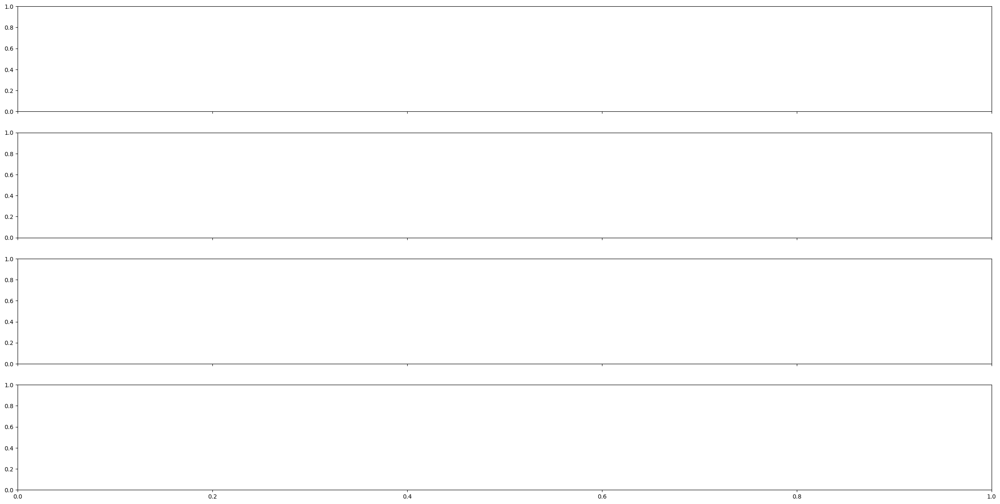

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline
import pC2DMS

scan1 = pC2DMS.Scan(args.parpath + str(10000)+' scans/')
# Define the optimization methods and their corresponding weights
optimization_methods = {
    # 'Bayesian optimization (GPR)': weights_bayopt_loss_func1,
    'Loss function 1': weights_tpe_loss_func1,
    'Loss function 2': weights_tpe_loss_func2,
    'Loss function 3': weights_tpe_loss_func3,
    'Loss function 4': weights_tpe_loss_func2
    # 'Covariance Matrix Adaptation Evolution Strategy': weights_cma_loss_func1
}

# Interpolate data points for a smoother curve
x_new = np.linspace(scan1.minMZ, scan1.maxMZ, 10000)

# Create a single plot with subplots for each optimization method
fig, axes = plt.subplots(len(optimization_methods), 1, figsize=(30, 15), sharex=True, sharey=True)

# Plot the data for each optimization method
for i, (method, method_weights) in enumerate(optimization_methods.items()):
    spl = make_interp_spline(np.arange(scan1.minMZ, scan1.maxMZ, scan1.sliceSize * (scan1.scanList.shape[1] // len(method_weights) + 1)), method_weights, k=1)
    weights_smooth = spl(x_new)

    # Plot the data and the fitted curve
    axes[i].plot(x_new, weights_smooth, color='blue', label='Weights', linewidth=2)
    axes[i].set_ylabel('Weights', fontsize=20)
    axes[i].set_title(f'Weights ({method})', fontsize=30)
    axes[i].grid(True)
    axes[i].legend()

# Set common x-axis label and adjust tick labels
plt.xlabel('m/z (Mass-to-Charge)', fontsize=20)
# Set custom ticks for the x-axis between 0 and 2
plt.xticks(np.arange(0, 2.1, 0.2), rotation=90)

# Adjust the layout for better visualization
plt.tight_layout()

# Save the figure
plt.savefig(args.parpath + str(10000) + ' scans/weights_tpe.jpg')

# Show the plot
plt.show()


In [19]:

import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline
import pC2DMS

scan1 = pC2DMS.Scan(args.parpath + str(10000)+' scans/')
# Define the optimization methods and their corresponding weights
optimization_methods = {
    'Bayesian optimization (GPR)': weights_bayopt_loss_func1,
    'Bayesian optimization (TPE)': weights_tpe_loss_func1,
    'Covariance Matrix Adaptation Evolution Strategy': weights_cma_loss_func1
}

# Interpolate data points for a smoother curve
x_new = np.linspace(scan1.minMZ, scan1.maxMZ, 10000)

# Create a single plot with subplots for each optimization method
fig, axes = plt.subplots(len(optimization_methods), 1, figsize=(30, 15), sharex=True, sharey=True)

# Plot the data for each optimization method
for i, (method, method_weights) in enumerate(optimization_methods.items()):
    spl = make_interp_spline(np.arange(scan1.minMZ, scan1.maxMZ, scan1.sliceSize * (scan1.scanList.shape[1] // len(method_weights) + 1)), method_weights, k=1)
    weights_smooth = spl(x_new)

    # Plot the data and the fitted curve
    axes[i].plot(x_new, weights_smooth, color='blue', label='Weights', linewidth=2)
    axes[i].set_ylabel('Weights', fontsize=20)
    axes[i].set_title(f'Weights (Optimization method: {method})', fontsize=30)
    axes[i].grid(True)
    axes[i].legend()

# Set common x-axis label and adjust tick labels
plt.xlabel('m/z (Mass-to-Charge)', fontsize=20)
plt.xticks(np.arange(scan1.minMZ, scan1.maxMZ, scan1.sliceSize * (scan1.scanList.shape[1] // len(method_weights) + 1)), rotation=90)

# Adjust the layout for better visualization
plt.tight_layout()

# Save the figure
plt.savefig(args.parpath + str(10000) + ' scans/weights_loss_func1.jpg')

# Show the plot
plt.show()


The history saving thread hit an unexpected error (OperationalError('disk I/O error')).History will not be written to the database.



KeyboardInterrupt



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline
import pC2DMS

scan1 = pC2DMS.Scan(args.parpath + str(10000)+' scans/')
# Define the optimization methods and their corresponding weights
optimization_methods = {
    'Bayesian optimization (GPR)': weights_bayopt_loss_func2,
    'Bayesian optimization (TPE)': weights_tpe_loss_func2,
    'Covariance Matrix Adaptation Evolution Strategy': weights_cma_loss_func2
}

# Interpolate data points for a smoother curve
x_new = np.linspace(scan1.minMZ, scan1.maxMZ, 10000)

# Create a single plot with subplots for each optimization method
fig, axes = plt.subplots(len(optimization_methods), 1, figsize=(30, 15), sharex=True, sharey=True)

# Plot the data for each optimization method
for i, (method, method_weights) in enumerate(optimization_methods.items()):
    spl = make_interp_spline(np.arange(scan1.minMZ, scan1.maxMZ, scan1.sliceSize * (scan1.scanList.shape[1] // len(method_weights) + 1)), method_weights, k=1)
    weights_smooth = spl(x_new)

    # Plot the data and the fitted curve
    axes[i].plot(x_new, weights_smooth, color='blue', label='Weights', linewidth=2)
    axes[i].set_ylabel('Weights', fontsize=20)
    axes[i].set_title(f'Weights (Optimization method: {method})', fontsize=30)
    axes[i].grid(True)
    axes[i].legend()

# Set common x-axis label and adjust tick labels
plt.xlabel('m/z (Mass-to-Charge)', fontsize=20)
plt.xticks(np.arange(scan1.minMZ, scan1.maxMZ, scan1.sliceSize * (scan1.scanList.shape[1] // len(method_weights) + 1)), rotation=90)

# Adjust the layout for better visualization
plt.tight_layout()

# Save the figure
plt.savefig(args.parpath + str(10000) + ' scans/weights_loss_func2.jpg')

# Show the plot
plt.show()


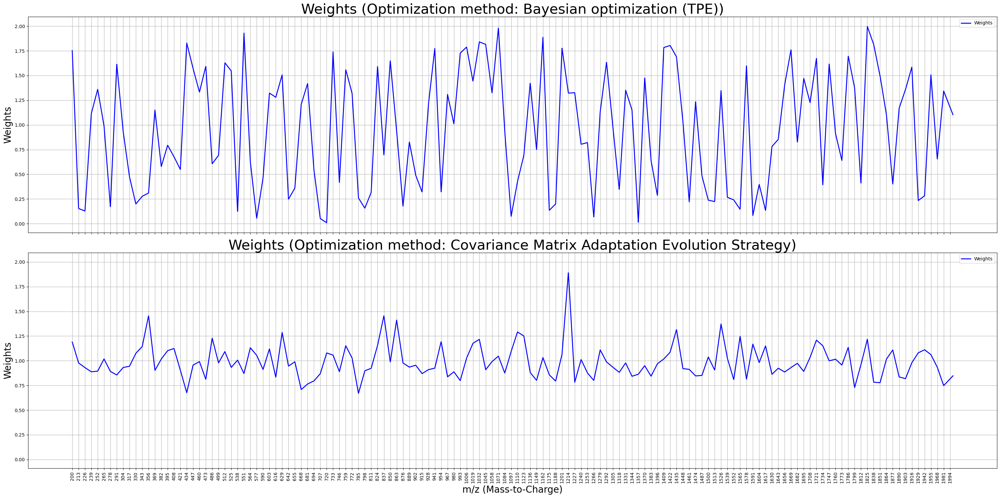

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline
import pC2DMS

scan1 = pC2DMS.Scan(args.parpath + str(10000)+' scans/')
# Define the optimization methods and their corresponding weights
optimization_methods = {
    # 'Bayesian optimization (GPR)': weights_bayopt_loss_func3,
    'Bayesian optimization (TPE)': weights_tpe_loss_func3,
    'Covariance Matrix Adaptation Evolution Strategy': weights_cma_loss_func3
}

# Interpolate data points for a smoother curve
x_new = np.linspace(scan1.minMZ, scan1.maxMZ, 10000)

# Create a single plot with subplots for each optimization method
fig, axes = plt.subplots(len(optimization_methods), 1, figsize=(30, 15), sharex=True, sharey=True)

# Plot the data for each optimization method
for i, (method, method_weights) in enumerate(optimization_methods.items()):
    spl = make_interp_spline(np.arange(scan1.minMZ, scan1.maxMZ, scan1.sliceSize * (scan1.scanList.shape[1] // len(method_weights) + 1)), method_weights, k=1)
    weights_smooth = spl(x_new)

    # Plot the data and the fitted curve
    axes[i].plot(x_new, weights_smooth, color='blue', label='Weights', linewidth=2)
    axes[i].set_ylabel('Weights', fontsize=20)
    axes[i].set_title(f'Weights (Optimization method: {method})', fontsize=30)
    axes[i].grid(True)
    axes[i].legend()

# Set common x-axis label and adjust tick labels
plt.xlabel('m/z (Mass-to-Charge)', fontsize=20)
plt.xticks(np.arange(scan1.minMZ, scan1.maxMZ, scan1.sliceSize * (scan1.scanList.shape[1] // len(method_weights) + 1)), rotation=90)

# Adjust the layout for better visualization
plt.tight_layout()

# Save the figure
plt.savefig(args.parpath + str(10000) + ' scans/weights_loss_func3.jpg')

# Show the plot
plt.show()


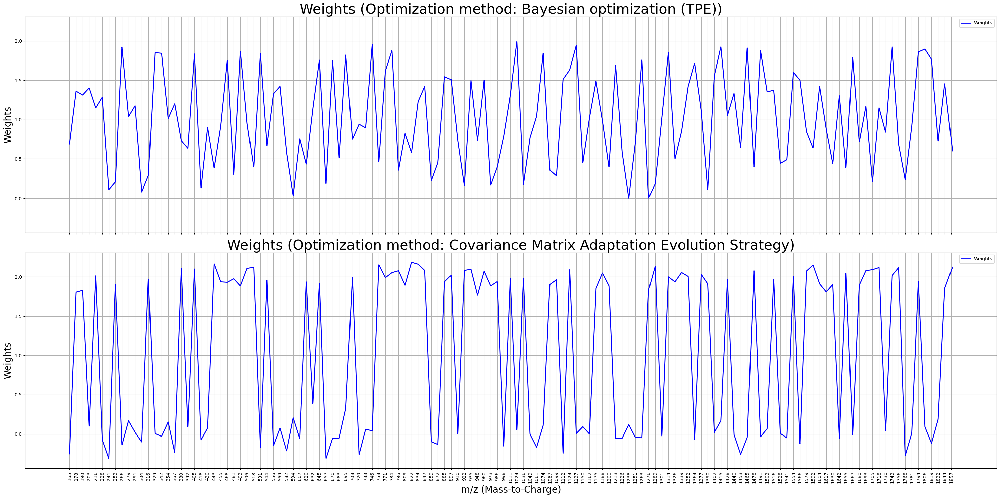

In [43]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline
import pC2DMS

scan1 = pC2DMS.Scan(args.parpath + str(10000)+' scans/')
# Define the optimization methods and their corresponding weights
optimization_methods = {
    'Bayesian optimization (TPE)': weights_tpe_loss_func4,
    'Covariance Matrix Adaptation Evolution Strategy': weights_cma_loss_func4
}

# Interpolate data points for a smoother curve
x_new = np.linspace(scan1.minMZ, scan1.maxMZ, 10000)

# Create a single plot with subplots for each optimization method
fig, axes = plt.subplots(len(optimization_methods), 1, figsize=(30, 15), sharex=True, sharey=True)

# Plot the data for each optimization method
for i, (method, method_weights) in enumerate(optimization_methods.items()):
    spl = make_interp_spline(np.arange(scan1.minMZ, scan1.maxMZ, scan1.sliceSize * (scan1.scanList.shape[1] // len(method_weights) + 1)), method_weights, k=1)
    weights_smooth = spl(x_new)

    # Plot the data and the fitted curve
    axes[i].plot(x_new, weights_smooth, color='blue', label='Weights', linewidth=2)
    axes[i].set_ylabel('Weights', fontsize=20)
    axes[i].set_title(f'Weights (Optimization method: {method})', fontsize=30)
    axes[i].grid(True)
    axes[i].legend()

# Set common x-axis label and adjust tick labels
plt.xlabel('m/z (Mass-to-Charge)', fontsize=20)
plt.xticks(np.arange(scan1.minMZ, scan1.maxMZ, scan1.sliceSize * (scan1.scanList.shape[1] // len(method_weights) + 1)), rotation=90)

# Adjust the layout for better visualization
plt.tight_layout()

# Save the figure
plt.savefig(args.parpath + str(10000) + ' scans/weights_loss_func4.jpg')

# Show the plot
plt.show()


In [36]:
method='_tpe(loss_func2,bins:100)_new'
weights = weights_tpe_loss_func2

In [37]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [38]:
print(top_score)

[['2' 'b(5-9)-(H2O)-(NH3)(1+)' '394.12' '523.37' 'y5(1+)'
  '22.679155856620596']
 ['6' 'b(10-12)(1+)' '262.01' '804.43' 'b9(1+)' '19.629319755774244']
 ['19' 'b(10-12)(1+)' '262.01' '787.4' 'b9-(NH3)(1+)'
  '11.640139196073553']
 ['21' 'b(8-11)(1+)' '319.1' '690.45' 'b7(1+)' '10.505096464261293']
 ['22' 'a(9-12)(1+)' '290.49' '747.45' 'b8(1+)' '10.48453972655986']
 ['27' 'a(9-12)(1+)' '290.46' '730.37' 'b8-(NH3)(1+)' '7.377608896243816']
 ['30' 'a(9-10)(1+)' '176.76' '730.48' 'b8-(NH3)(1+)' '5.515149947924597']
 ['31' 'b(6-8)(1+)' '285.75' '521.49' 'y6-(NH3)-(HN=C=NH)(1+)'
  '5.393407621801326']
 ['34' 'a(9-10)(1+)' '176.71' '747.42' 'b8(1+)' '5.289873209124236']
 ['36' 'b(8-11)(1+)' '319.07' '673.36' 'b7-(NH3)(1+)' '4.668042900761071']
 ['37' 'b(9-10)(1+)' '204.8' '747.97' 'b8(1+)' '4.482159371943353']
 ['55' 'a(9-10)(1+)' '176.62' '375.98' 'y4(1+)' '3.3616554958428635']
 ['56' 'b(10-11)(1+)' '204.72' '787.27' 'b9-(NH3)(1+)'
  '3.2993247103915473']
 ['58' 'b(10-11)(1+)' '204.78' '804

In [39]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [40]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [41]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [42]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [43]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [44]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [45]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

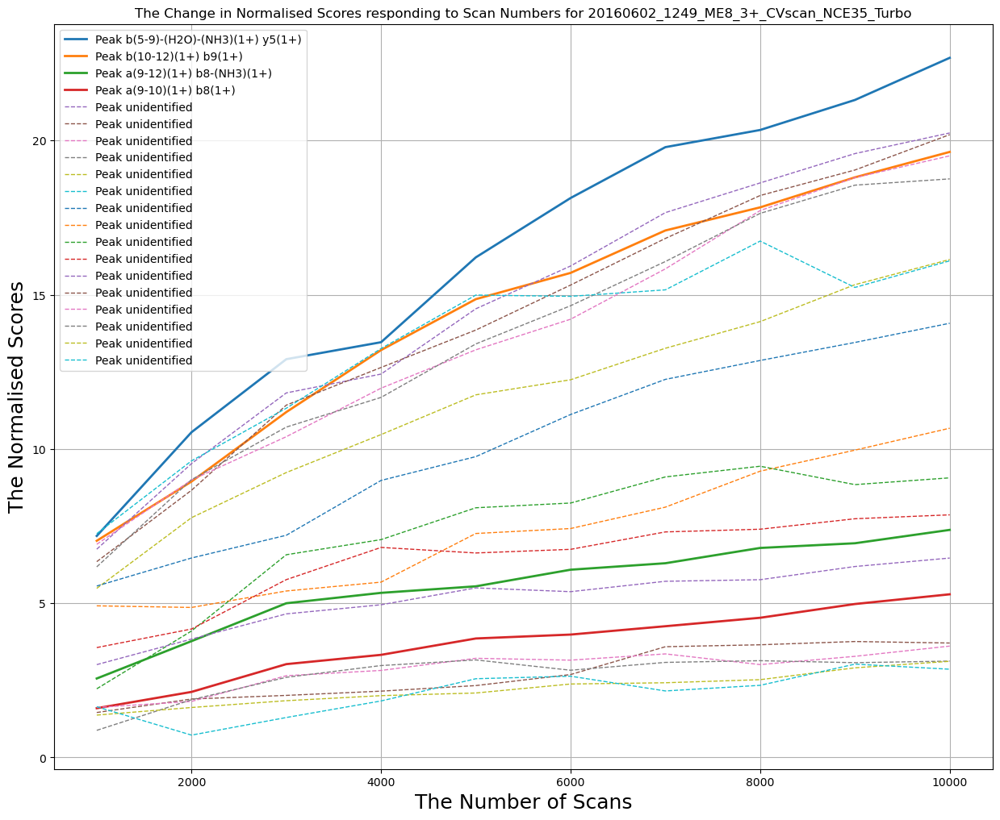

In [46]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [47]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [48]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

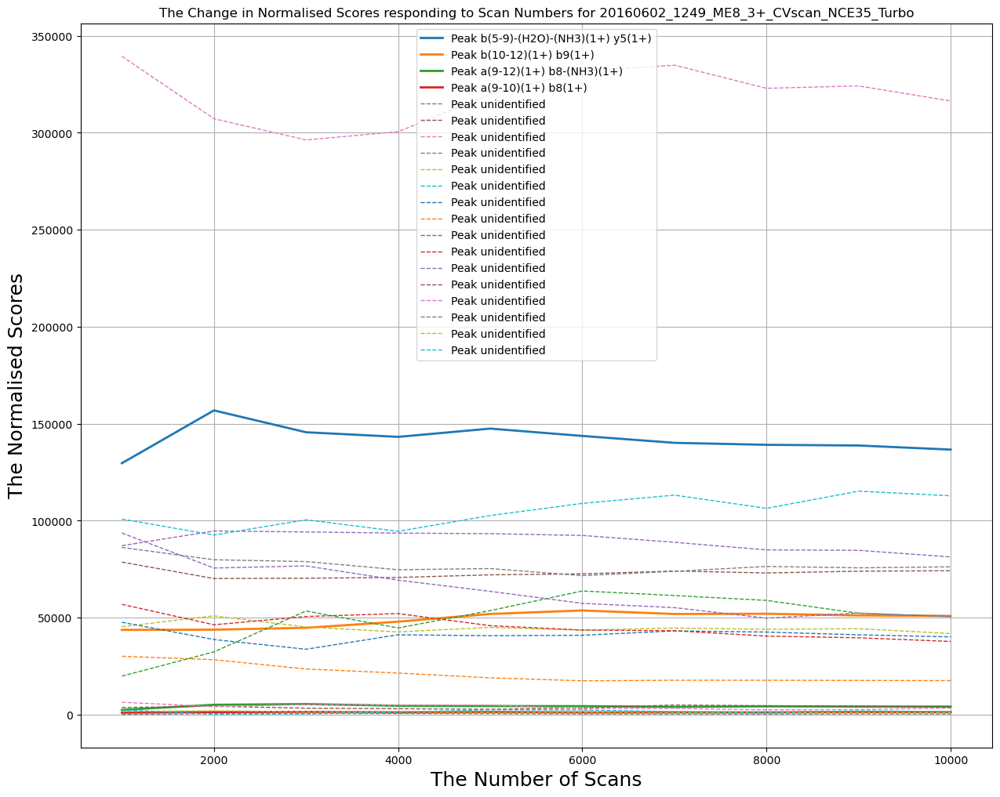

In [49]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [50]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [51]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [52]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

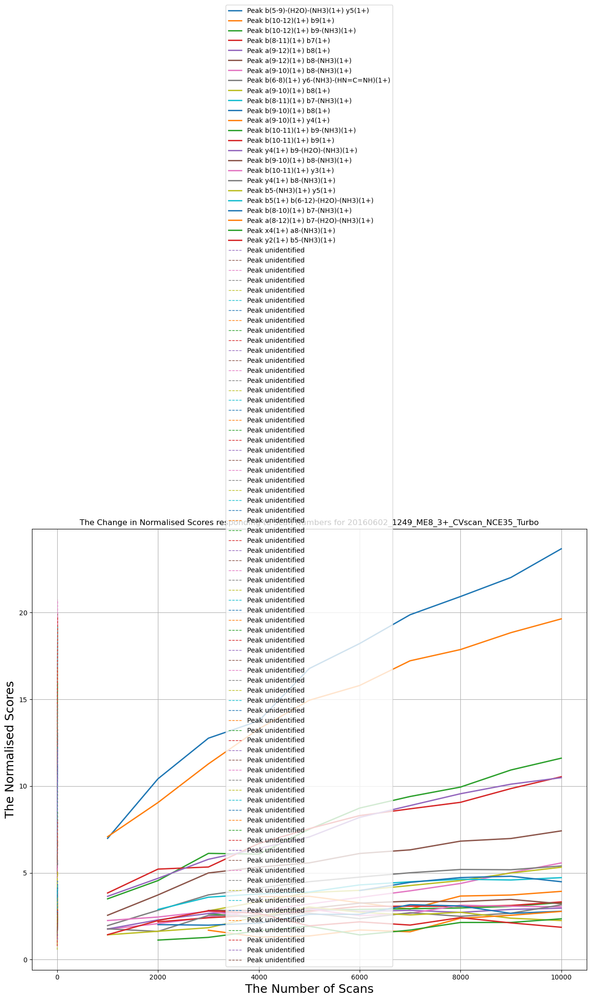

In [53]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [54]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [55]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

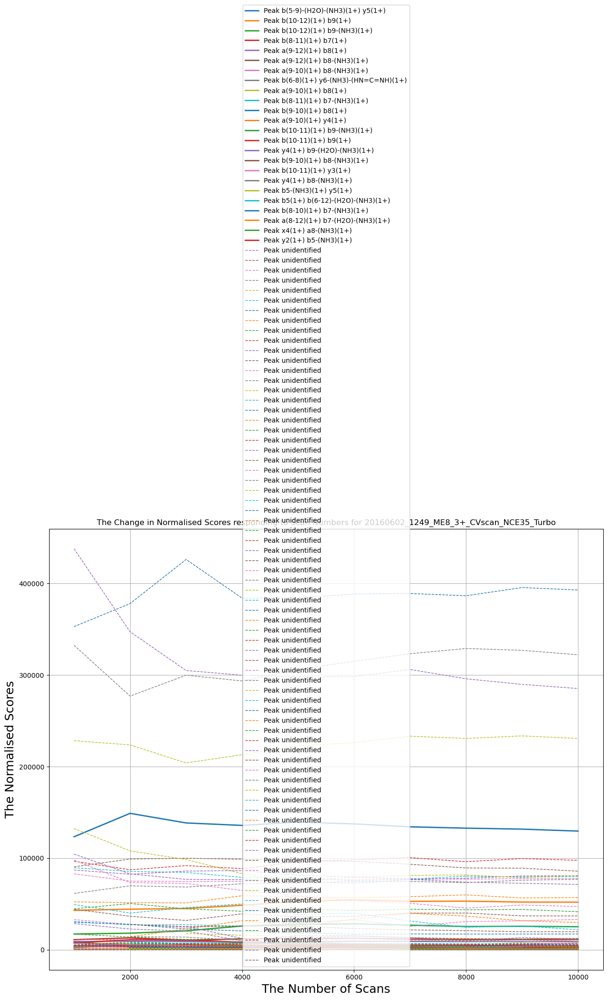

In [56]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [28]:
method='_tpe(loss_func1,bins:100)_new'
weights = weights_tpe_loss_func1

In [29]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [30]:
print(top_score)

[['1' 'b(5-9)-(H2O)-(NH3)(1+)' '394.13' '523.36' 'y5(1+)'
  '23.49106281013562']
 ['8' 'b(10-12)(1+)' '262.01' '804.43' 'b9(1+)' '19.631052558828017']
 ['19' 'b(10-12)(1+)' '262.01' '787.41' 'b9-(NH3)(1+)'
  '11.728950156869297']
 ['21' 'b(8-11)(1+)' '319.1' '690.45' 'b7(1+)' '10.652037794217998']
 ['22' 'a(9-12)(1+)' '290.49' '747.45' 'b8(1+)' '10.491040195491648']
 ['27' 'a(9-12)(1+)' '290.47' '730.37' 'b8-(NH3)(1+)' '7.459732856506585']
 ['30' 'a(9-10)(1+)' '176.75' '730.48' 'b8-(NH3)(1+)' '5.557785140432018']
 ['31' 'b(6-8)(1+)' '285.75' '521.49' 'y6-(NH3)-(HN=C=NH)(1+)'
  '5.42468772541951']
 ['32' 'a(9-10)(1+)' '176.71' '747.42' 'b8(1+)' '5.346152436993654']
 ['35' 'b(8-11)(1+)' '319.08' '673.36' 'b7-(NH3)(1+)' '4.833855167098222']
 ['36' 'b(9-10)(1+)' '204.8' '747.97' 'b8(1+)' '4.492499140915599']
 ['38' 'a(7-10)(1+)' '404.26' '502.91' 'b6-(NH3)(1+)'
  '4.3214616555728735']
 ['40' 'b(6-8)-(NH3)(1+)' '268.83' '521.16' 'y6-(NH3)-(HN=C=NH)(1+)'
  '4.2054201437968395']
 ['44' 'a(9-1

In [31]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [32]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [33]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [34]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [37]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [38]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

The history saving thread hit an unexpected error (OperationalError('database is locked')).History will not be written to the database.


In [39]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

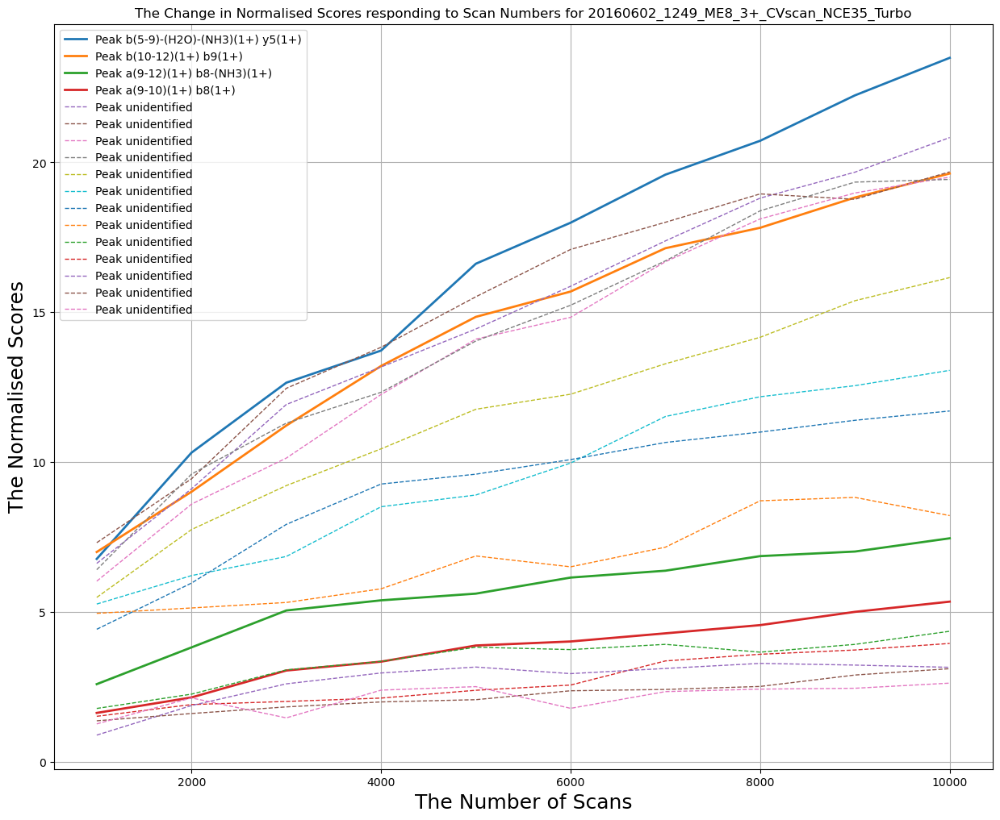

In [40]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [41]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [42]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

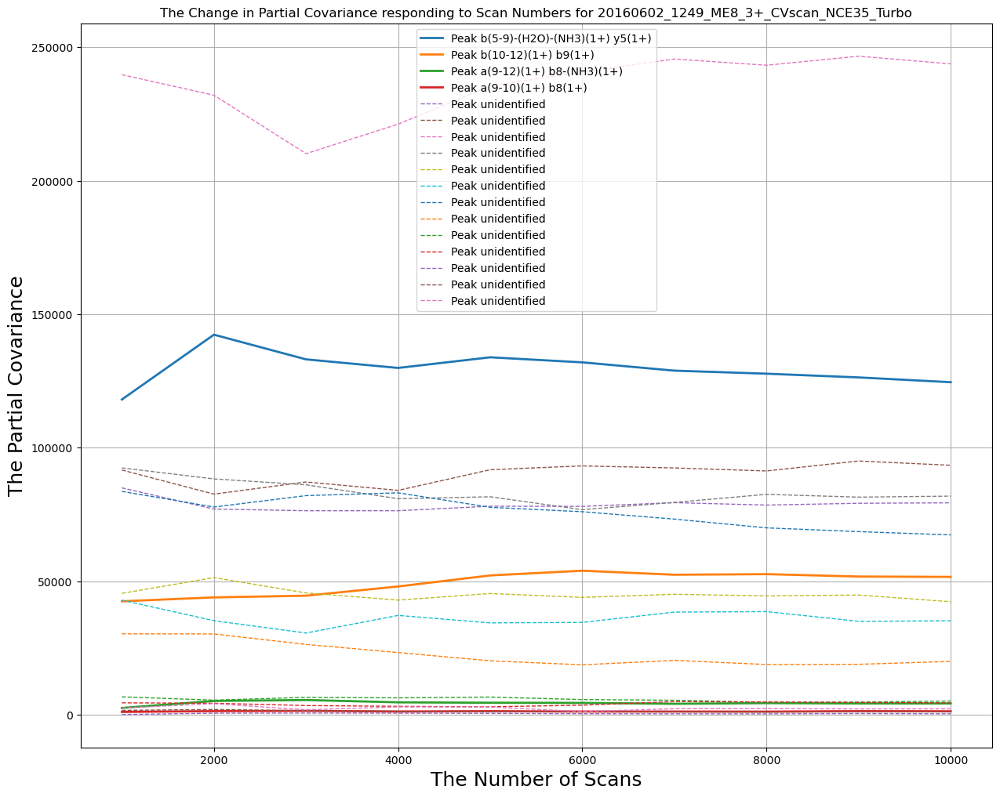

In [43]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [44]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50


/rds/general/user/ww1922/home/src/pC2DMS.py:869: RuntimeWarning: invalid value encountered in scalar divide
  2), peakVol, peakVol / np.sqrt(peakVar)


sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [45]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [46]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

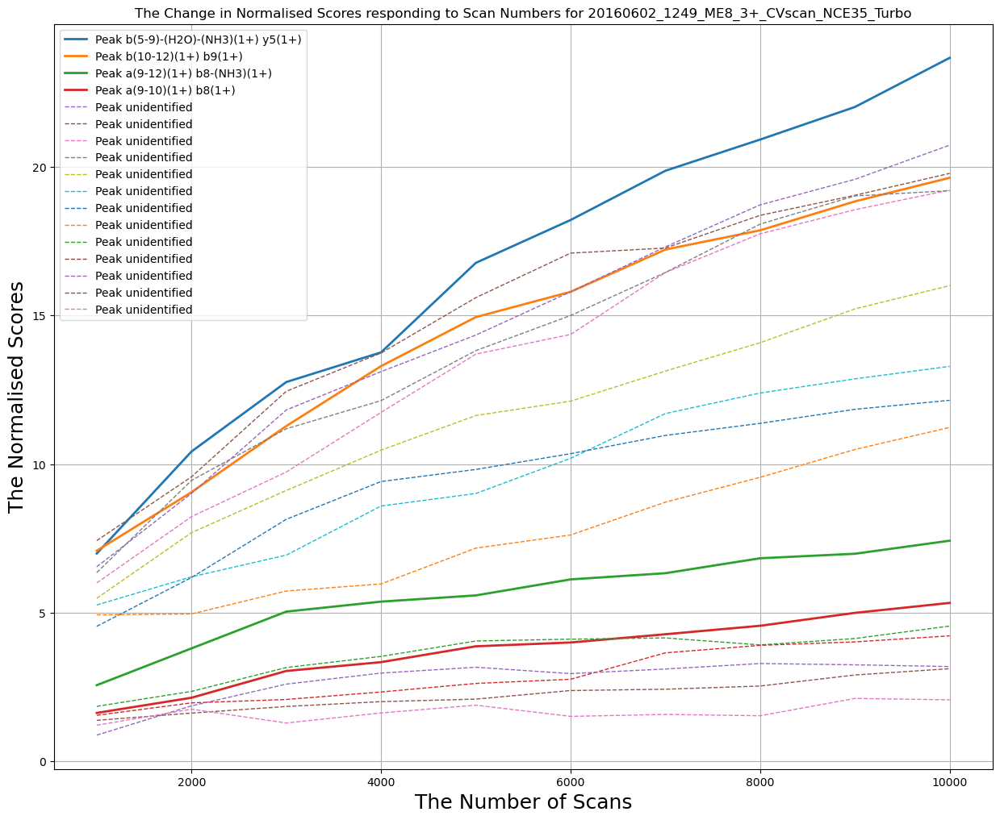

In [47]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [48]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [49]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

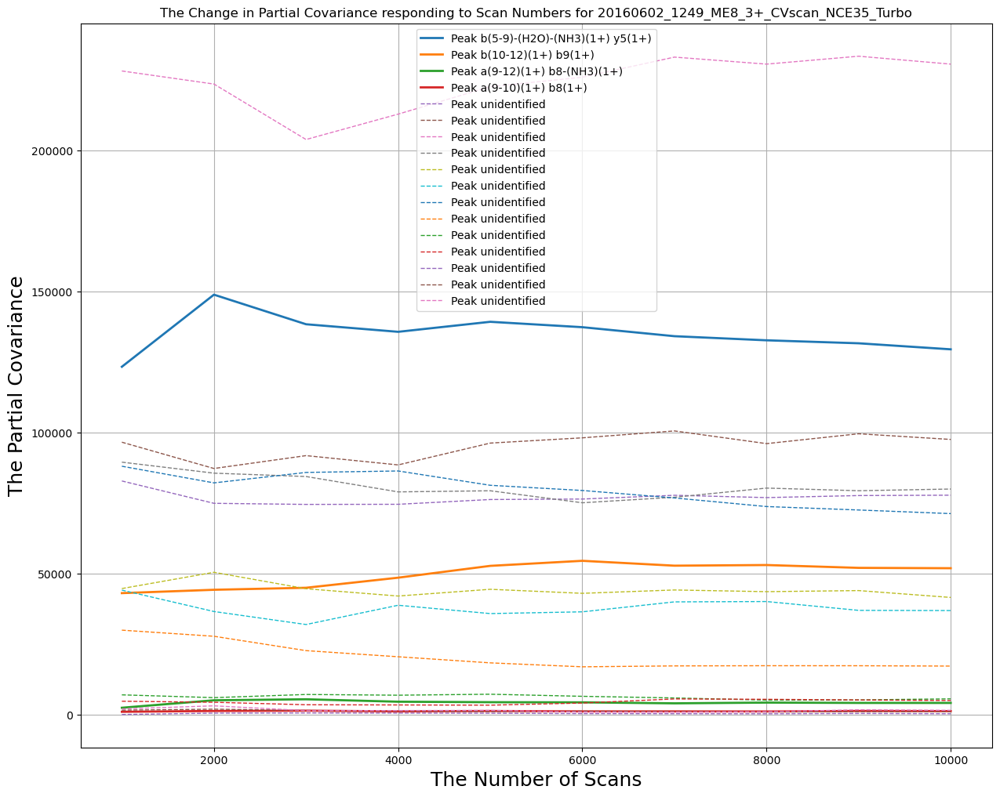

In [50]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_tpe(loss_func3,bins:100)'
weights = weights_tpe_loss_func3

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [51]:
method='_tpe(loss_func4,bins:100)_new'
weights = weights_tpe_loss_func4

In [52]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [53]:
print(top_score)

[['1' 'b(5-9)-(H2O)-(NH3)(1+)' '394.12' '523.37' 'y5(1+)'
  '23.810437677682522']
 ['6' 'b(10-12)(1+)' '262.01' '804.43' 'b9(1+)' '19.70902291896032']
 ['18' 'b(10-12)(1+)' '262.01' '787.4' 'b9-(NH3)(1+)'
  '11.577413768466512']
 ['21' 'a(9-12)(1+)' '290.49' '747.45' 'b8(1+)' '10.4758032004789']
 ['22' 'b(8-11)(1+)' '319.1' '690.45' 'b7(1+)' '10.442102687860052']
 ['27' 'a(9-12)(1+)' '290.46' '730.37' 'b8-(NH3)(1+)' '7.391379732287591']
 ['30' 'a(9-10)(1+)' '176.76' '730.48' 'b8-(NH3)(1+)'
  '5.5505887063073756']
 ['31' 'b(6-8)(1+)' '285.75' '521.49' 'y6-(NH3)-(HN=C=NH)(1+)'
  '5.3995544579202175']
 ['33' 'a(9-10)(1+)' '176.71' '747.42' 'b8(1+)' '5.265875008151808']
 ['35' 'b(8-11)(1+)' '319.08' '673.36' 'b7-(NH3)(1+)' '4.599392903114689']
 ['38' 'b(9-10)(1+)' '204.8' '747.98' 'b8(1+)' '4.448522626451678']
 ['43' 'a(7-10)(1+)' '403.96' '502.94' 'b6-(NH3)(1+)'
  '3.8619696896037214']
 ['59' 'a(9-10)(1+)' '176.64' '375.96' 'y4(1+)' '3.3686164852295453']
 ['60' 'b(10-11)(1+)' '204.72' '78

In [54]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [55]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [56]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [57]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [58]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [59]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [60]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

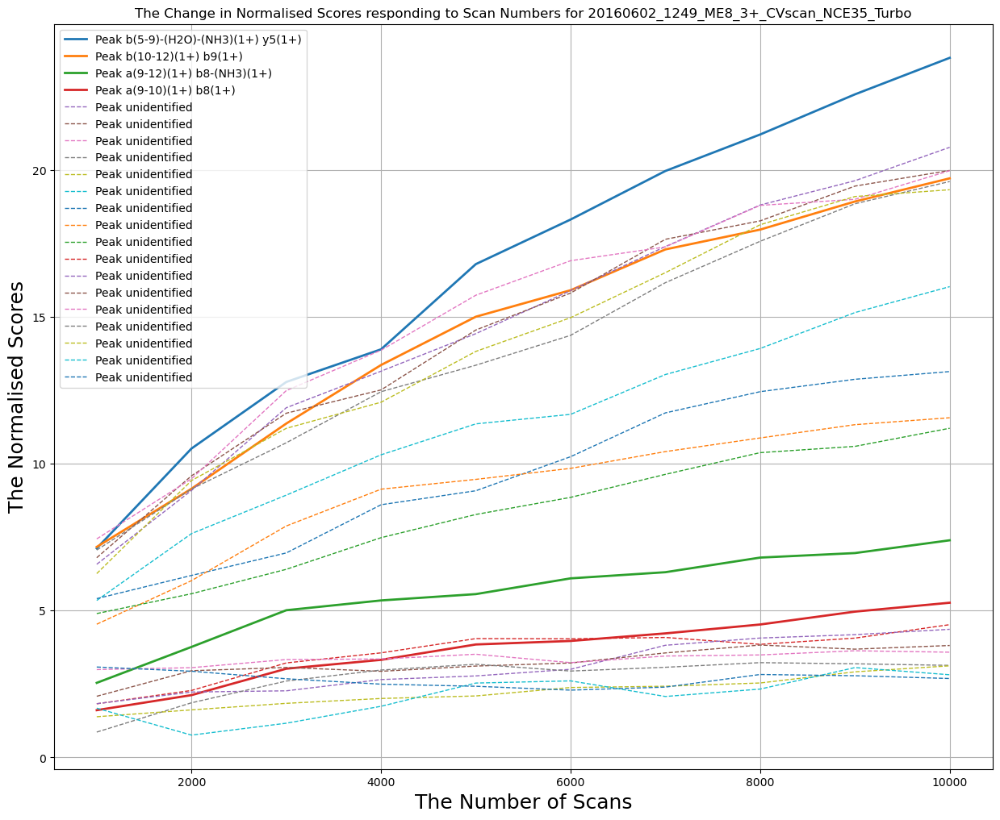

In [61]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [62]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [63]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

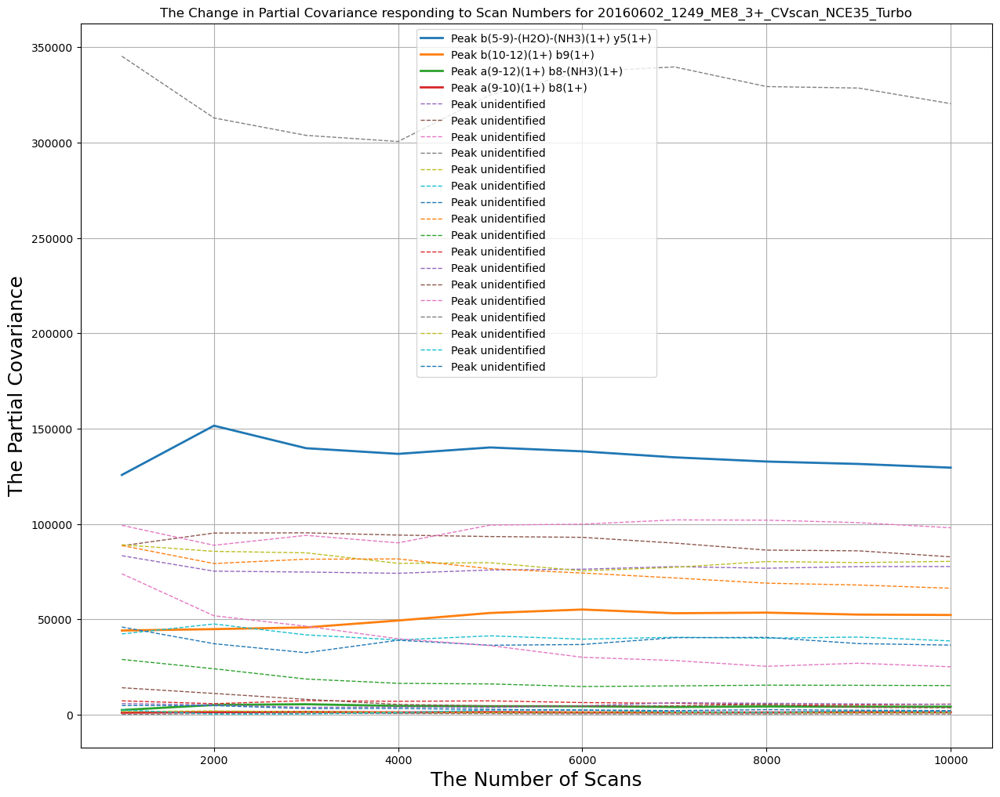

In [64]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [65]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [66]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [67]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

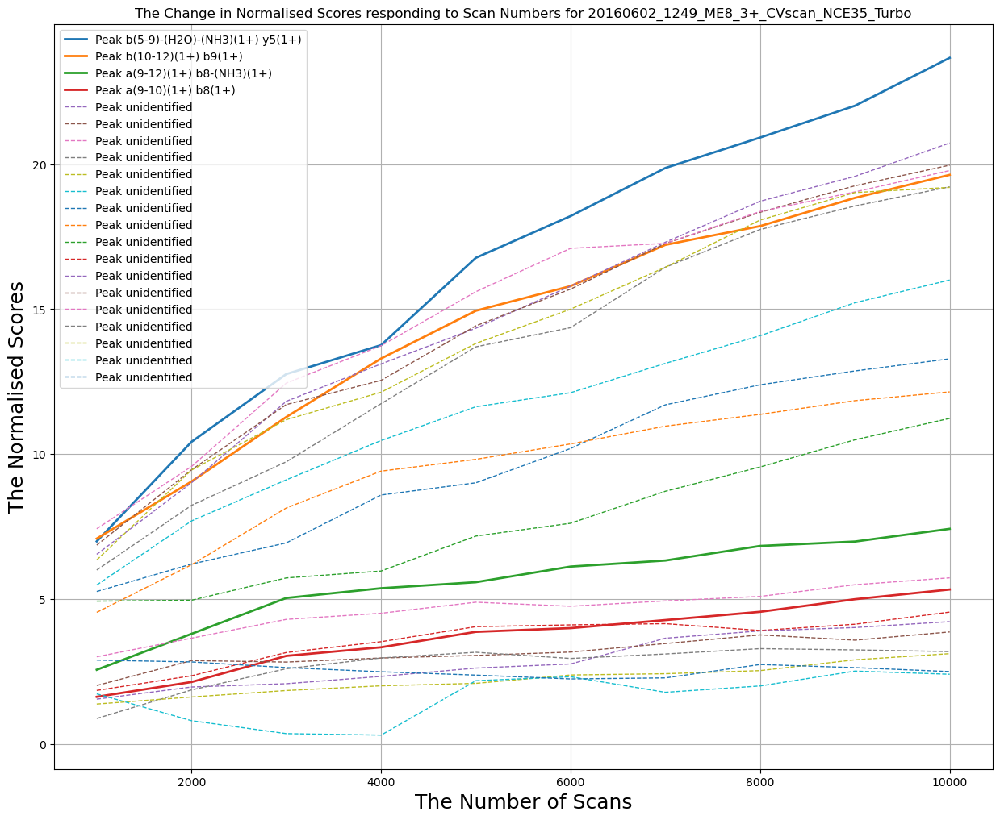

In [68]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [69]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [70]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

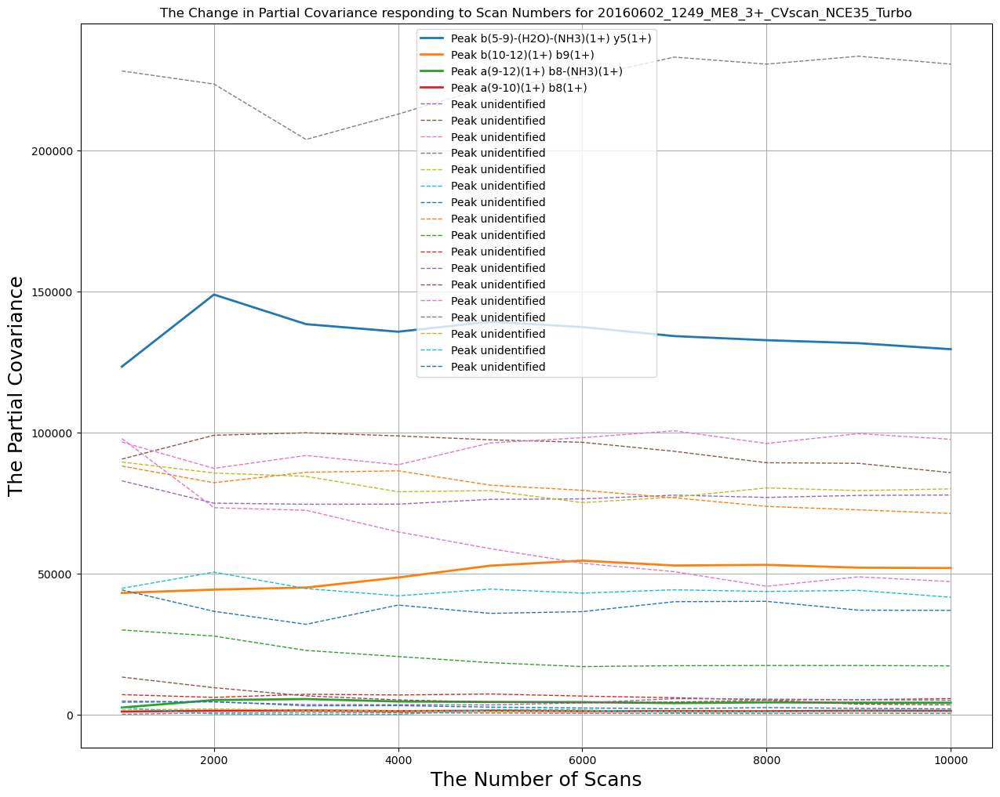

In [71]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [72]:
method='_bayopt(loss_func_2,bins:100)_new'
weights = weights_bayopt_loss_func2

In [73]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [74]:
print(top_score)

[['1' 'b9-(NH3)(2+)' '394.12' '523.37' 'y5(1+)' '24.01054402624284']
 ['2' 'b4(1+)' '376.1' '467.7' 'y10-(NH3)(2+)' '23.427303585739583']
 ['3' 'y3(1+)' '319.06' '496.16' 'b11-(NH3)(2+)' '20.90057812810903']
 ['4' 'b7-(NH3)(2+)' '337.01' '637.4' 'y7(1+)' '20.247462672733008']
 ['5' 'b9(2+)' '402.71' '523.36' 'y5(1+)' '20.163760007574698']
 ['6' 'y5(2+)' '262.01' '804.43' 'b9(1+)' '19.848598825394024']
 ['7' 'y3(1+)' '319.03' '504.82' 'b11(2+)' '19.546528801349773']
 ['8' 'y9(2+)' '432.75' '463.14' 'b5(1+)' '18.27985602072192']
 ['9' 'b7(2+)' '345.62' '637.37' 'y7(1+)' '16.75662042201298']
 ['10' 'b8-(NH3)(2+)' '365.47' '580.38' 'y6(1+)' '16.085719063278823']
 ['11' 'b3-(H2O)(1+)' '210.78' '549.95' 'y11(2+)' '15.91717918034681']
 ['12' 'y9(2+)' '432.79' '446.16' 'b5-(NH3)(1+)' '14.282851300334709']
 ['13' 'b3(1+)' '228.76' '550.0' 'y11(2+)' '14.075459887856809']
 ['14' 'b7-(H2O)-(NH3)(2+)' '328.12' '637.42' 'y7(1+)'
  '13.416579262309341']
 ['15' 'b9-(H2O)-(NH3)(2+)' '385.2' '523.4' 'y5

In [75]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [76]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [77]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [78]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [79]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [80]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [81]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

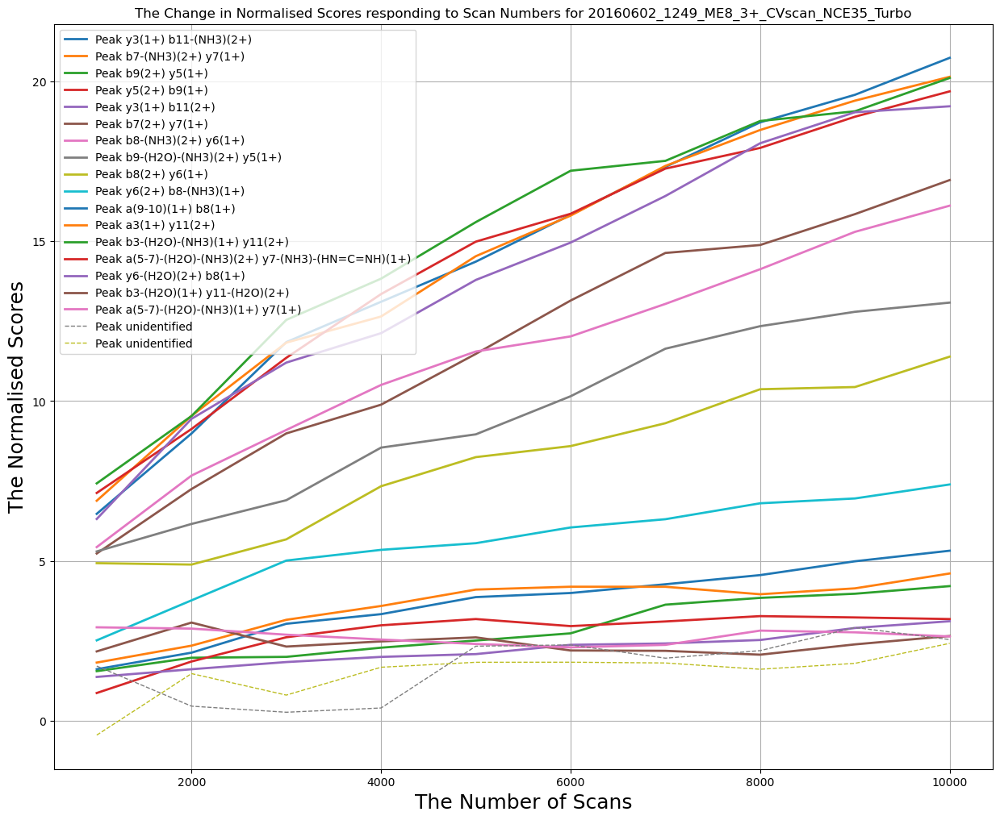

In [82]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [83]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [84]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

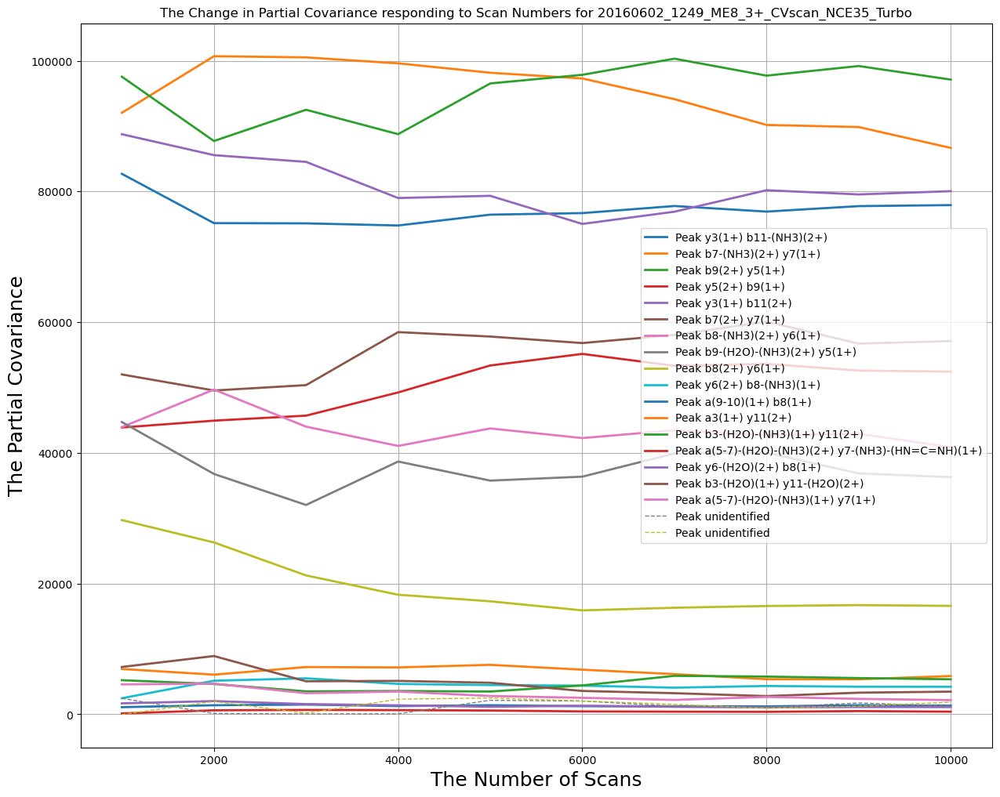

In [85]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [86]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [87]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [88]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

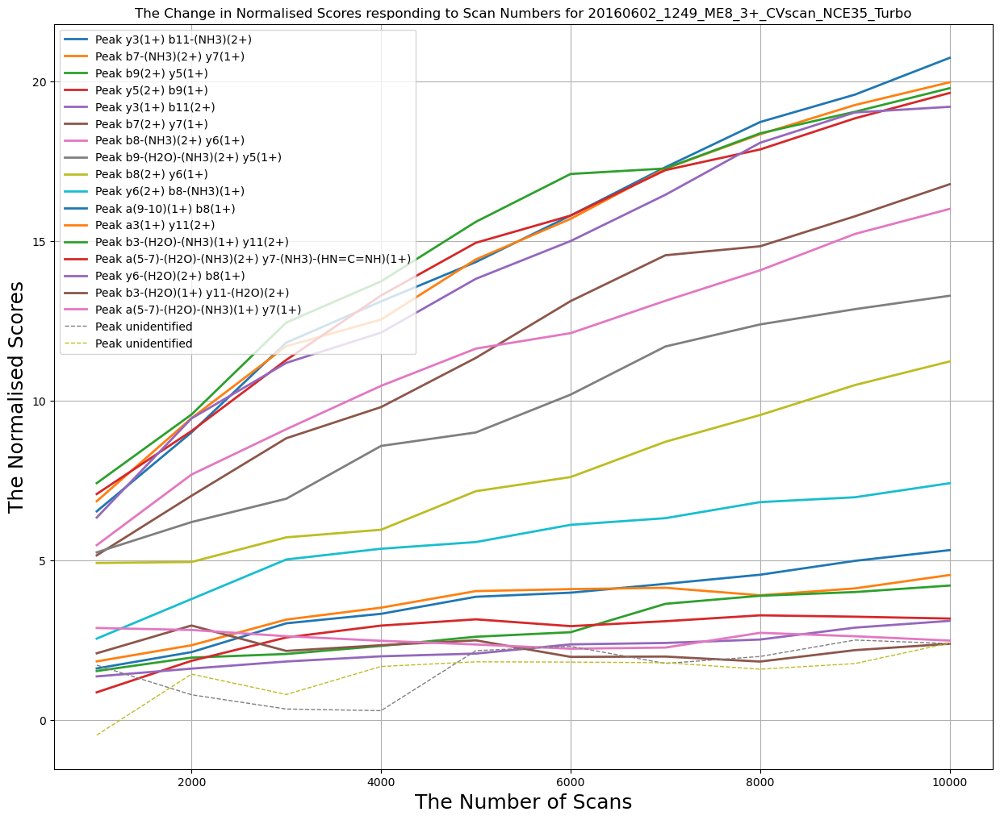

In [89]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [90]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [91]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

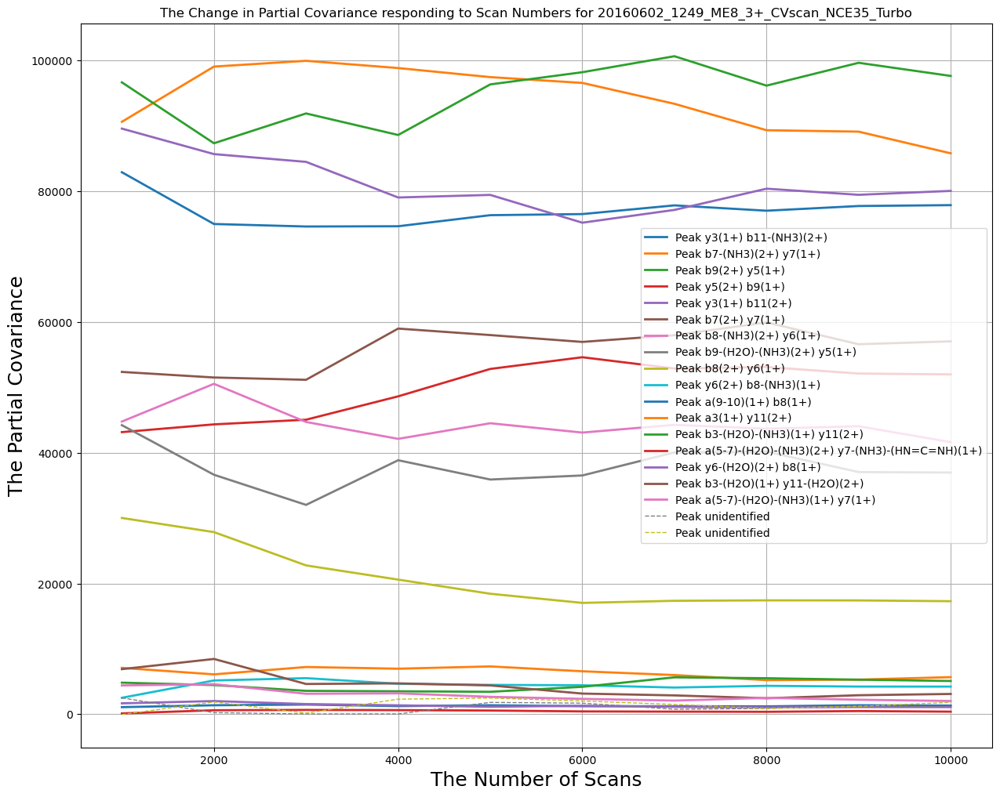

In [92]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_bayopt(loss_func1,bins:100)_new'
weights = weights_bayopt_loss_func1

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_bayopt(loss_func4,bins:100)_new'
weights = weights_bayopt_loss_func4

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in numscan_list:
        new_path = args.parpath+str(i)+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
        new_top_feat = new_top_feat_list[i//1000-1] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

display(whole_score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])))
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in numscan_list:
        new_path = args.parpath+str(i)+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
        new_top_feat = new_top_feat_list[i//1000-1] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

display(whole_score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])))
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in numscan_list:
        new_path = args.parpath+str(i)+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
        new_top_feat = np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

display(whole_score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])))
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in numscan_list:
        new_path = args.parpath+str(i)+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
        new_top_feat = np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

display(whole_score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])))
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_cma(loss_func1,bins:100)_new'
weights = weights_cma_loss_func1

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_cma(loss_func4,bins:100)'
weights = weights_cma_loss_func4

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [28]:
method='_cma(loss_func3,bins:100)_new'
weights = weights_cma_loss_func3

In [29]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [30]:
print(top_score)

[['1' 'b9-(NH3)(2+)' '394.12' '523.36' 'y5(1+)' '23.489104024162017']
 ['2' 'y3(1+)' '319.06' '496.16' 'b11-(NH3)(2+)' '20.554458017094333']
 ['3' 'y9(2+)' '432.75' '463.16' 'b5(1+)' '19.95104240216092']
 ['4' 'y5(2+)' '262.01' '804.43' 'b9(1+)' '19.89788777312703']
 ['5' 'b7-(NH3)(2+)' '337.01' '637.4' 'y7(1+)' '19.750725268145526']
 ['6' 'b9(2+)' '402.71' '523.36' 'y5(1+)' '19.52037248679612']
 ['7' 'y3(1+)' '319.02' '504.82' 'b11(2+)' '19.076827141875164']
 ['8' 'a4(1+)' '348.04' '476.38' 'y10(2+)' '18.768857583603264']
 ['9' 'b7(2+)' '345.63' '637.37' 'y7(1+)' '16.681766522513705']
 ['10' 'b8-(NH3)(2+)' '365.48' '580.38' 'y6(1+)' '16.023125791302533']
 ['11' 'b4(1+)' '376.1' '467.68' 'y10-(NH3)(2+)' '14.519229572537224']
 ['12' 'y9(2+)' '432.8' '446.16' 'b5-(NH3)(1+)' '13.874695535269359']
 ['13' 'b9-(H2O)-(NH3)(2+)' '385.2' '523.39' 'y5(1+)'
  '13.387870514411535']
 ['14' 'b7-(H2O)-(NH3)(2+)' '328.11' '637.42' 'y7(1+)'
  '12.241429305252527']
 ['15' 'y3(1+)' '319.11' '487.37' 'b11

In [31]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [32]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [33]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [34]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [100]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [101]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [102]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

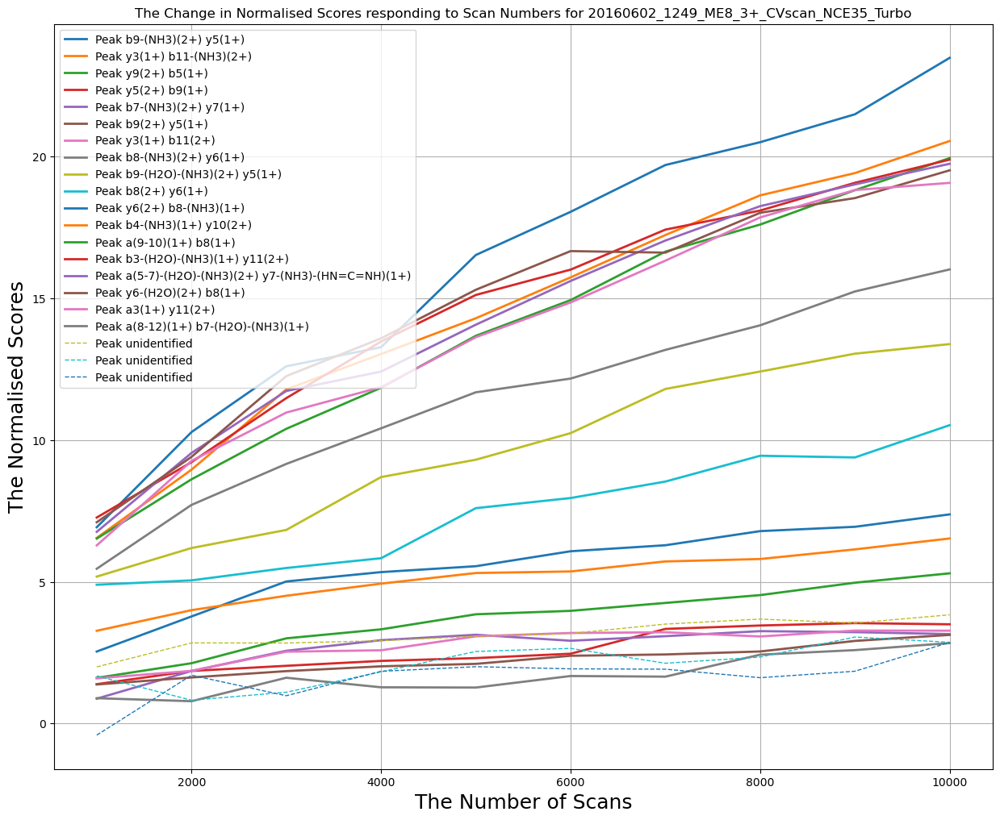

In [103]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [104]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [105]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

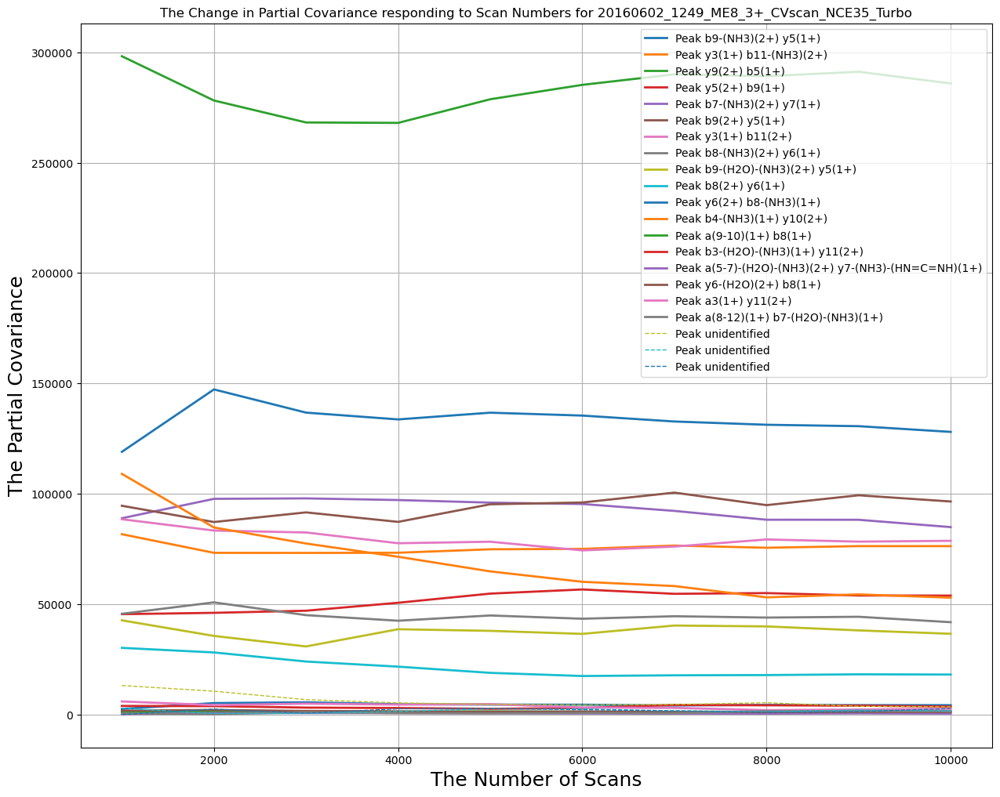

In [106]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_cma(loss_func2,bins:100)'
weights = weights_cma_loss_func2

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation' + str(method) + '.npy', allow_pickle = True)
top_number = 100

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.tic()).sampleFeats(indexlist[index_list]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [35]:
method='_cma(loss_func8,bins:100)'
weights = weights_cma_loss_func8

In [36]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [37]:
print(top_score)

[['1' 'b7(2+)' '420.68' '685.47' 'y6(1+)' '23.323411758706378']
 ['2' 'y2(1+)' '274.0' '626.38' 'b11(2+)' '22.534958333743774']
 ['3' 'y6(2+)' '343.18' '840.4' 'b7(1+)' '16.87824957875427']
 ['4' 'y7(2+)' '407.31' '712.37' 'b6(1+)' '15.928158959429112']
 ['5' 'y3(1+)' '387.15' '569.71' 'b10(2+)' '14.529577806463996']
 ['6' 'y2(1+)' '273.94' '1138.46' 'b(2-11)(1+)' '13.033978340631425']
 ['7' 'y1(1+)' '174.65' '675.8' 'b12(2+)' '11.612655291980177']
 ['8' 'y3(1+)' '387.19' '1025.41' 'b(2-10)(1+)' '11.129598992573552']
 ['9' 'y6(1+)' '685.52' '712.65' 'b6(1+)' '10.759835472384477']
 ['10' 'y6(1+)' '685.6' '729.52' 'c6(1+)' '10.4973383922343']
 ['11' 'b8(2+)' '477.67' '571.75' 'y5(1+)' '9.893767693436613']
 ['13' 'y3(2+)' '193.8' '1121.15' 'b10-(NH3)(1+)' '9.45127395895058']
 ['14' 'y4(1+)' '500.2' '912.43' 'b(2-9)(1+)' '9.23871140726109']
 ['15' 'b(7-8)(1+)' '242.83' '712.35' 'b6(1+)' '9.00396615177798']
 ['16' 'y4(1+)' '500.36' '954.34' 'b8(1+)' '8.801883843949591']
 ['17' 'y2(1+)' '274

In [38]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [39]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [40]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [41]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [42]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [43]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [44]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

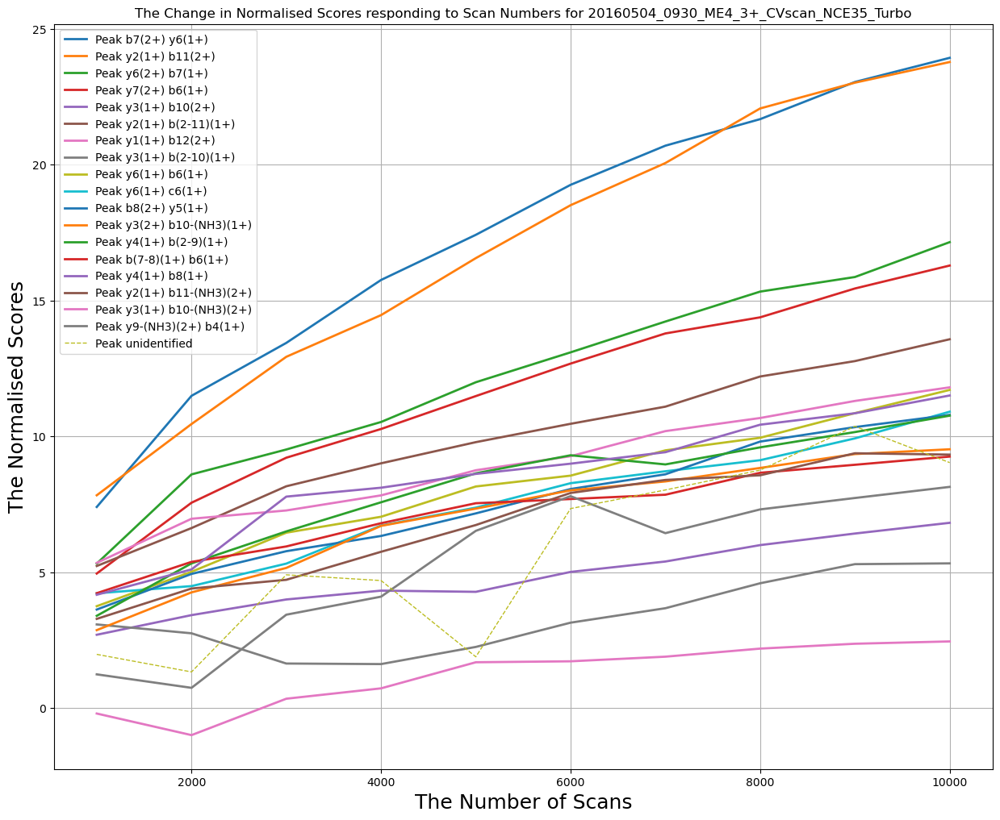

In [45]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [46]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [47]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

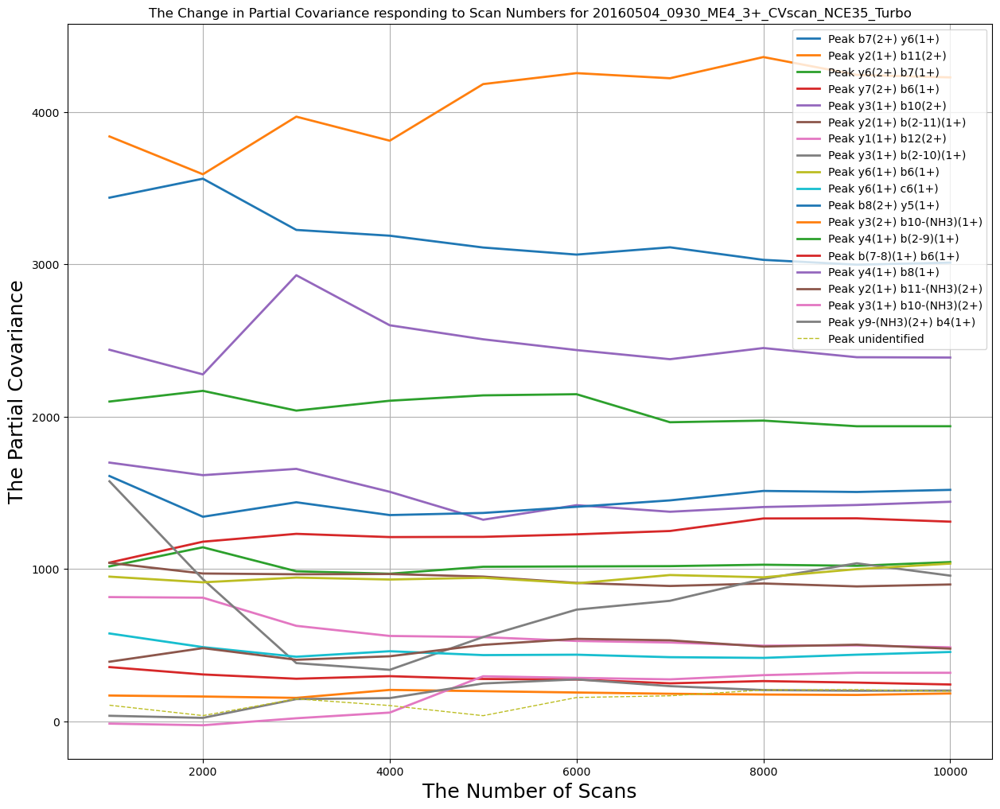

In [48]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [49]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [50]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [51]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

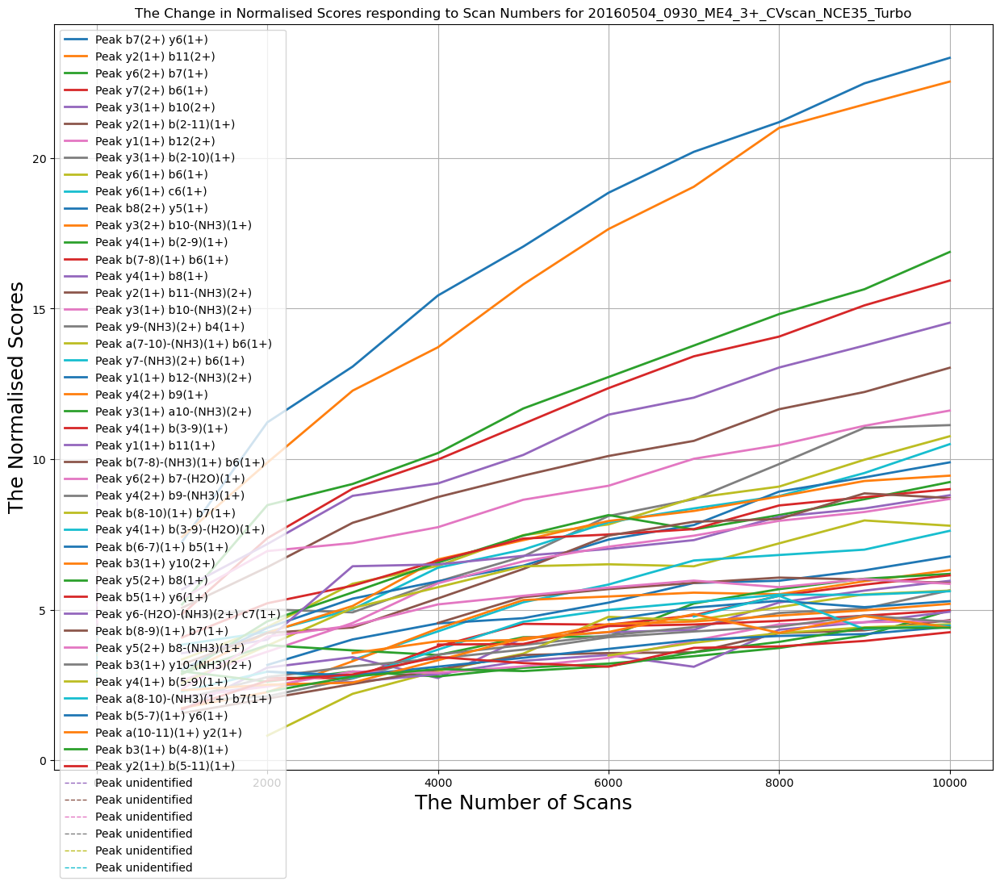

In [52]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [53]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [54]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

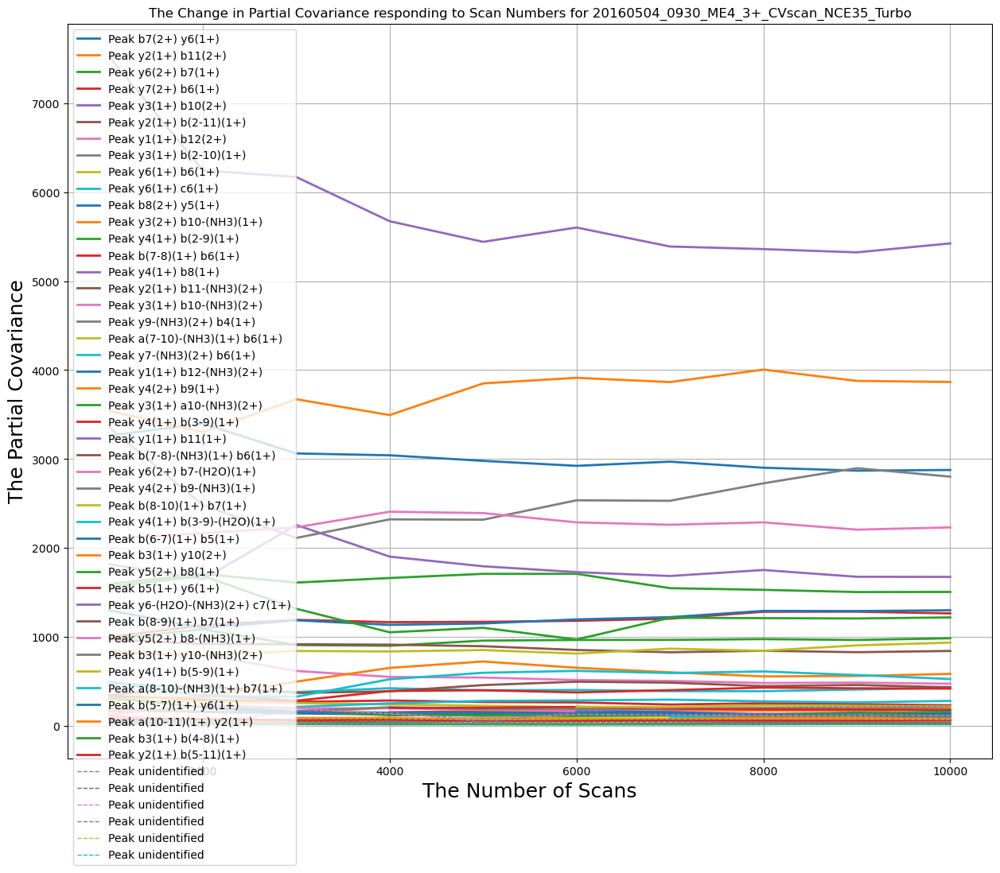

In [55]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [56]:
method='_bayopt(loss_func6,bins:100)'
weights = weights_bayopt_loss_func6

In [57]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [58]:
print(top_score)

[['1' 'b7(2+)' '420.68' '685.47' 'y6(1+)' '23.323411758706378']
 ['2' 'y2(1+)' '274.0' '626.38' 'b11(2+)' '22.534958333743774']
 ['3' 'y6(2+)' '343.18' '840.4' 'b7(1+)' '16.87824957875427']
 ['4' 'y7(2+)' '407.31' '712.37' 'b6(1+)' '15.928158959429112']
 ['5' 'y3(1+)' '387.15' '569.71' 'b10(2+)' '14.529577806463996']
 ['6' 'y2(1+)' '273.94' '1138.46' 'b(2-11)(1+)' '13.033978340631425']
 ['7' 'y1(1+)' '174.65' '675.8' 'b12(2+)' '11.612655291980177']
 ['8' 'y3(1+)' '387.19' '1025.41' 'b(2-10)(1+)' '11.129598992573552']
 ['9' 'y6(1+)' '685.52' '712.65' 'b6(1+)' '10.759835472384477']
 ['10' 'y6(1+)' '685.6' '729.52' 'c6(1+)' '10.4973383922343']
 ['11' 'b8(2+)' '477.67' '571.75' 'y5(1+)' '9.893767693436613']
 ['13' 'y3(2+)' '193.8' '1121.15' 'b10-(NH3)(1+)' '9.45127395895058']
 ['14' 'y4(1+)' '500.2' '912.43' 'b(2-9)(1+)' '9.23871140726109']
 ['15' 'b(7-8)(1+)' '242.83' '712.35' 'b6(1+)' '9.00396615177798']
 ['16' 'y4(1+)' '500.36' '954.34' 'b8(1+)' '8.801883843949591']
 ['17' 'y2(1+)' '274

In [59]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [60]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [61]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [62]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [63]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [64]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [65]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

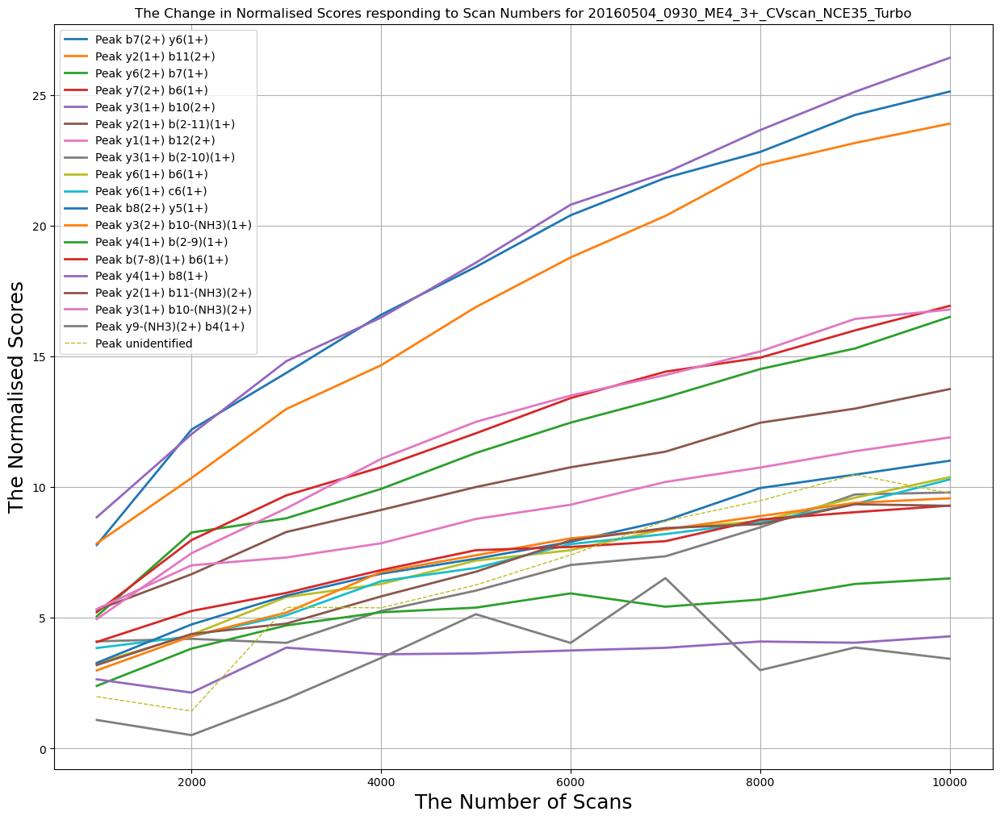

In [66]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [67]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [68]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

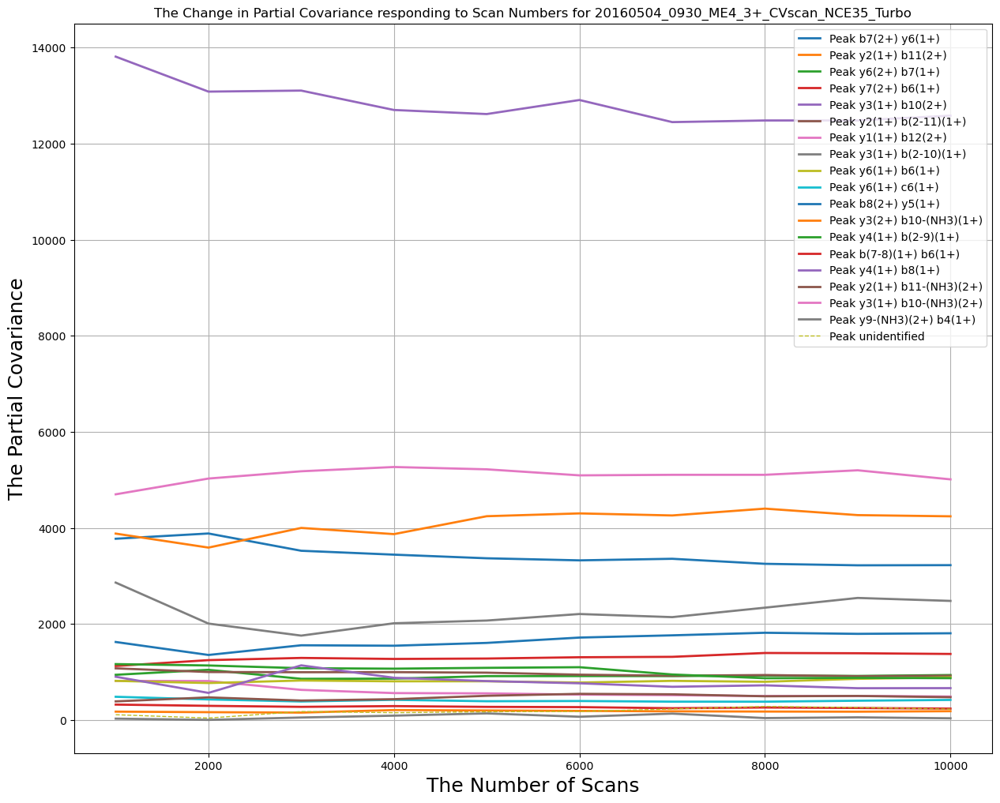

In [69]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [70]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [71]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [72]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

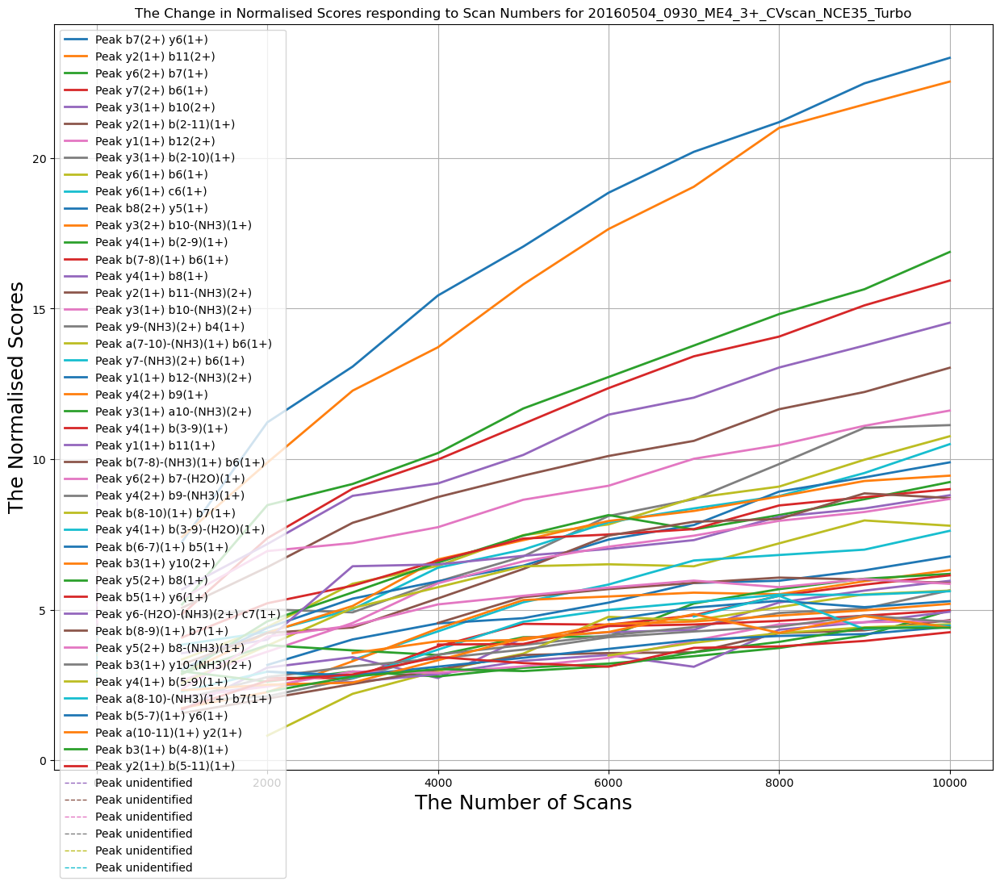

In [73]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [74]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [75]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

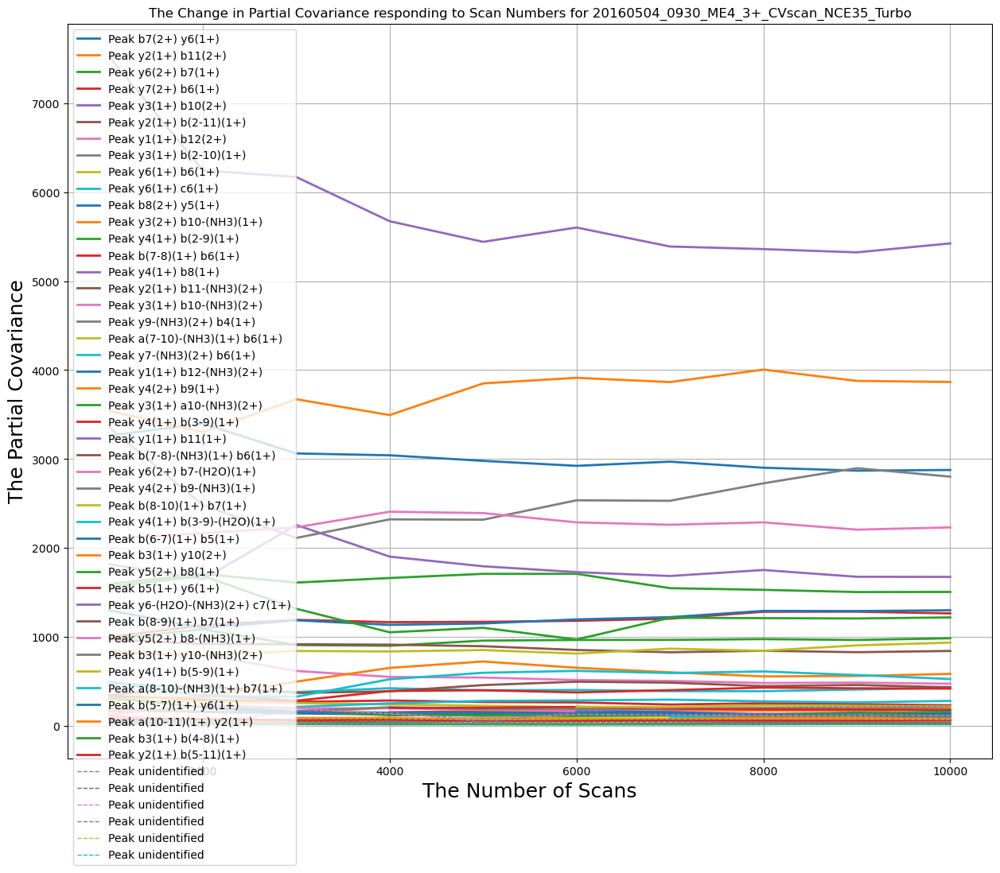

In [76]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [77]:
method='_tpe(loss_func7,bins:100)'
weights = weights_tpe_loss_func7

In [78]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [79]:
print(top_score)

[['1' 'b7(2+)' '420.68' '685.47' 'y6(1+)' '23.323411758706378']
 ['2' 'y2(1+)' '274.0' '626.38' 'b11(2+)' '22.534958333743774']
 ['3' 'y6(2+)' '343.18' '840.4' 'b7(1+)' '16.87824957875427']
 ['4' 'y7(2+)' '407.31' '712.37' 'b6(1+)' '15.928158959429112']
 ['5' 'y3(1+)' '387.15' '569.71' 'b10(2+)' '14.529577806463996']
 ['6' 'y2(1+)' '273.94' '1138.46' 'b(2-11)(1+)' '13.033978340631425']
 ['7' 'y1(1+)' '174.65' '675.8' 'b12(2+)' '11.612655291980177']
 ['8' 'y3(1+)' '387.19' '1025.41' 'b(2-10)(1+)' '11.129598992573552']
 ['9' 'y6(1+)' '685.52' '712.65' 'b6(1+)' '10.759835472384477']
 ['10' 'y6(1+)' '685.6' '729.52' 'c6(1+)' '10.4973383922343']
 ['11' 'b8(2+)' '477.67' '571.75' 'y5(1+)' '9.893767693436613']
 ['13' 'y3(2+)' '193.8' '1121.15' 'b10-(NH3)(1+)' '9.45127395895058']
 ['14' 'y4(1+)' '500.2' '912.43' 'b(2-9)(1+)' '9.23871140726109']
 ['15' 'b(7-8)(1+)' '242.83' '712.35' 'b6(1+)' '9.00396615177798']
 ['16' 'y4(1+)' '500.36' '954.34' 'b8(1+)' '8.801883843949591']
 ['17' 'y2(1+)' '274

In [80]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [81]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [82]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [83]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50
sig calculated for feature 50


In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_tpe(loss_func5,bins:100)'
weights = weights_tpe_loss_func5

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_cma(loss_func5,bins:100)'
weights = weights_cma_loss_func5

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_bayopt(loss_func5,bins:100)'
weights = weights_bayopt_loss_func5

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_bayopt(loss_func7,bins:100)'
weights = weights_bayopt_loss_func7

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_bayopt(loss_func8,bins:100)'
weights = weights_bayopt_loss_func8

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_bayopt(loss_func9,bins:100)'
weights = weights_bayopt_loss_func9

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_tpe(loss_func6,bins:100)'
weights = weights_tpe_loss_func6

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_tpe(loss_func8,bins:100)'
weights = weights_tpe_loss_func8

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:
method='_tpe(loss_func9,bins:100)'
weights = weights_tpe_loss_func9

In [ ]:
path = args.parpath + str(numscan_list[-1])+' scans/'
name = args.name
interpretation = np.load(path + '/interpretation.npy', allow_pickle = True)
top_number = 50

interpretation = interpretation[1:,]
top_score = []
top_score_unidentified = []
for j in interpretation:
    for i in nb.prange(top_number):
        # choose top peaks and only identified correlations
        if j[0]==i+1 and j[1]!= '':
            top_score.append([j[0],j[1],j[2],float(j[3]),j[4],j[6]])
        if j[0]==i+1 and j[1]== '':
            top_score_unidentified.append([j[0],'unidentified',j[2],float(j[3]),j[4],j[6]])
top_score = np.array(top_score)
top_score_unidentified = np.array(top_score_unidentified)

In [ ]:
print(top_score)

In [ ]:
indexlist = np.load(os.path.join(path, 'top_indices_tic.npy'))

In [ ]:
top_feat_tic = np.load(os.path.join(path, 'tic_topfeat.npy'))

In [ ]:
import pC2DMS
index_list = []
for j in top_score:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
for j in top_score_unidentified:
    for k in range(len(indexlist)):
        if abs(float(j[2])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[3])-float(top_feat_tic[k][1]))<=tolerance:
            index_list.append(k)
        if abs(float(j[3])-float(top_feat_tic[k][0]))<=tolerance and abs(float(j[2])-float(top_feat_tic[k][1]))<=tolerance:    
            index_list.append(k)

In [ ]:
import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = pC2DMS.PCovMap(scan_low, scan_low.weightFunc(weights)).sampleFeats(indexlist[:50]) # np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:
speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '.jpg')

In [ ]:
import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:
import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:

speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + '.jpg')

In [ ]:

import pC2DMS
whole_score_list = []
new_top_feat_list = []
for i in numscan_list:
    new_path = args.parpath+str(i)+' scans/'
    scan_low = pC2DMS.Scan(args.parpath + str(i)+ ' scans/')
    new_top_feat = np.load(new_path + '/tic_topfeat.npy')
    new_top_feat_list.append(new_top_feat)

In [ ]:

import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[3])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:

import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(i), float(k[3])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:

speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Normalised Scores',size=18)
plt.title('The Change in Normalised Scores responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number normalised score '+str(name)+ str(method) + '_tic_comparison.jpg')

In [ ]:

import pC2DMS
whole_score_list = []
for j in top_score:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list.append(score_list)

In [ ]:

import pC2DMS
whole_score_list_unidentified = []
for j in top_score_unidentified:
    score_list=[]
    for i in range(len(numscan_list)):
        new_path = args.parpath+str(numscan_list[i])+' scans/'
        scan_low = pC2DMS.Scan(args.parpath + str(numscan_list[i])+ ' scans/')
        new_top_feat = new_top_feat_list[i] # np.load(new_path + '/tic_topfeat.npy')
        for k in new_top_feat:
            if abs(float(j[2])-float(k[0]))<=tolerance and abs(float(j[3])-float(k[1]))<=tolerance:
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
            if abs(float(j[3])-float(k[0]))<=tolerance and abs(float(j[2])-float(k[1]))<=tolerance:    
                score_list.append([str(j[1] + ' ' + j[4]), int(numscan_list[i]), float(k[2])])
    if len(score_list) > 0:
        whole_score_list_unidentified.append(score_list)

In [ ]:

speed_of_convergence_list = []
plt.figure(figsize=[15,12])
plt.xlabel('The Number of Scans',size=18)
plt.ylabel('The Partial Covariance',size=18)
plt.title('The Change in Partial Covariance responding to Scan Numbers for '+str(name))
plt.grid()
for i in nb.prange(len(whole_score_list)):
    a = whole_score_list[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=2)
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
for i in nb.prange(len(whole_score_list_unidentified)):
    a = whole_score_list_unidentified[i]
    plt.plot(np.array(a,dtype=object)[:,1],np.array(a,dtype=object)[:,2],label='Peak '+str(str(a[0][0])), linewidth=1, linestyle='--')
    # speed_of_convergence_list.append(calculate_speed_of_convergence(np.array(a)[:,2]) / (np.array(a)[-1,2] - np.array(a)[0,2]))
    plt.legend()
    # print(calculate_speed_of_convergence(np.array(a)[:,2]))
plt.savefig(path + '/scan number partial covariance '+str(name)+ str(method) + 'tic_comparison.jpg')

In [ ]:

np.save(os.path.join(args.parpath, f'{scan_number} scans/some_results.npy'), np.array([max_number, 
    1 - list_number(len(df), max_number)[2] / zoom_in_fragment,
    1 - calculate_speed_of_convergence(np.array(num_array)) / (num_array[-1] - num_array[0]),
    1 - np.mean(np.array(speed_of_convergence_list))]))

In [ ]:
print(max_number)

In [ ]:
print(list_number(len(df), max_number)[2])

In [ ]:
100